In [3]:
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator        # 맨 위 import 위치

import numpy as np
from scipy.interpolate import interp1d
from iminuit import Minuit
import math as math
import warnings
import sys
import os
# sys.path.append('./Prompt_spectra/')
from scipy.linalg import inv, pinvh

# from bb_Copy1 import GammaSpectrumInterpolator as Interpolator_bb
# from four_b import GammaSpectrumInterpolator as Interpolator
from Prompt_spectra.Prompt_spectra import GammaSpectrumInterpolator as Interpolator
# from effective_2b2tau import GammaSpectrumInterpolator as Interpolator
# from bb import Interpolator
#from SFDM_h2h2_interpolator import Interpolator as Interpolator
# from SFDM_4b_interpolator import Interpolator as Interpolator
# from bbbb import Interpolator
# channel = 'bb'
from scipy import interpolate 
from scipy.interpolate import RegularGridInterpolator
from Prompt_spectra.Prompt_spectra import exctractcirellitable

# def exctractcirellitable(DMmass,DMchannel,particle,EWcorr):
#     warnings.filterwarnings("ignore", category=DeprecationWarning)

#     '''
#     This function returns the energy spectrum in 1/GeV for the particle production from DM annihilation.
#     These results come from the PPPC4DM http://www.marcocirelli.net/PPPC4DMID.html
#     Relevant tables should be downloaded and stored locally
    
#     DMmass: dark matter mass in GeV
#     DMchannel: dark matter annihilation channel with EW correction (no EW correction)
#     e 4 (2), mu 7 (3), tau 10 (4), bb 13 (7), tt 14 (8), WW 17 (9), ZZ 20 (10), gamma 22 (12), h 23 (13)
#     particle: particle produced from the DM annihilation ('gammas' or 'positrons')
#     EWcorr: electroweak corrections ('Yes' or 'No')
#     '''

#     if EWcorr=='Yes':
#         listenergies = 179
#         energy_vec = np.arange(-8.9,0.05,0.05)
#     elif EWcorr=='No':
#         listenergies = 180
#         energy_vec = np.arange(-8.95,0.05,0.05)
#     else:
#         print('Error Wrong value for EWcorr, Yes or No')
    
#     energy = np.zeros(listenergies)
#     fluxDM = np.zeros(listenergies)
#     if EWcorr=='No': 
#         table = np.loadtxt('/home/sanghwan/PPPC4/particle_data/AtProduction%sEW_%s.dat'%(EWcorr,particle), skiprows=1)
#     else:
#         table = np.loadtxt('/home/sanghwan/PPPC4/particle_data/AtProduction_%s.dat'%(particle), skiprows=1)
#     massvec = []
#     for t in range(len(table)):
#         if t%listenergies == 0:
#             massvec.append(table[t,0])
#     massvec = np.array(massvec)
    
#     flux = []
#     for t in range(len(table)):
#         flux.append(table[t,DMchannel])
    
#     f = interpolate.interp2d(massvec, energy_vec, flux, kind='linear')
    
#     for t in range(len(energy_vec)):
#         fluxDM[t] = f(DMmass,energy_vec[t])
    
#     return np.power(10.,energy_vec)*DMmass, fluxDM/(np.log(10.)*np.power(10.,energy_vec)*DMmass)

In [4]:
exctractcirellitable

<function Prompt_spectra.Prompt_spectra.exctractcirellitable(DMmass, DMchannel, particle, EWcorr)>

## Prompt signal preparation

In [5]:
table = Interpolator(40, 'bb').interpolated_table()

plt.loglog(table[0], table[0]**2*table[1], label='this work')

cirelli = exctractcirellitable(40, 13, 'gammas', 'Yes')

plt.loglog(cirelli[0], cirelli[0]**2*cirelli[1])
plt.legend()
plt.xlim(1e-1, 100)
plt.ylim(1e-1, None)

FileNotFoundError: /home/sanghwan/Madgraph_3.5.7/MG5_aMC_v3_5_7/bin/bb/dm_mass.txt not found.

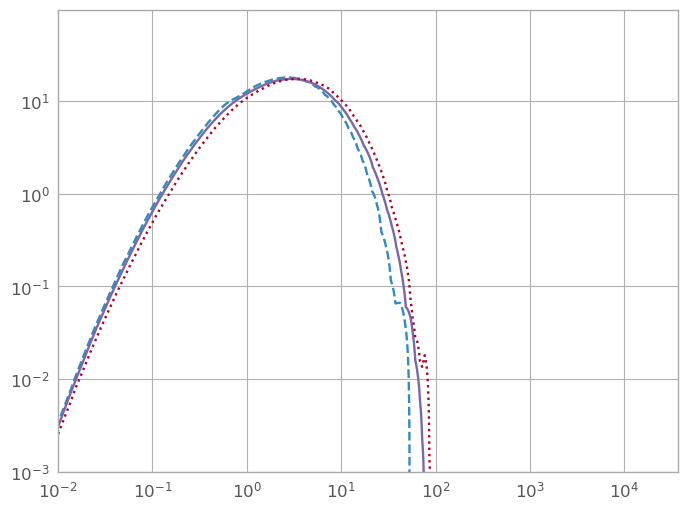

In [13]:
a = Interpolator(100, 'SFDM_mpsi_1mh2').interpolated_table()

plt.loglog(a[0], a[0]**2*a[1], linestyle='dashed')

b = Interpolator(100, 'effective_4b').interpolated_table()

plt.loglog(b[0], b[0]**2*b[1])

plt.xlim(1e-2, None)
plt.ylim(1e-3, None)
c = Interpolator(100, 'SFDM_mpsi_2mh2').interpolated_table()

plt.loglog(c[0], c[0]**2*c[1], linestyle='dotted')

In [124]:
np.logspace(-30, -18, 120)

array([1.00000000e-30, 1.26136372e-30, 1.59103844e-30, 2.00687817e-30,
       2.53140332e-30, 3.19302031e-30, 4.02755998e-30, 5.08021805e-30,
       6.40800274e-30, 8.08282219e-30, 1.01953787e-29, 1.28600808e-29,
       1.62212394e-29, 2.04608829e-29, 2.58086154e-29, 3.25540512e-29,
       4.10624992e-29, 5.17947468e-29, 6.53320146e-29, 8.24074331e-29,
       1.03945747e-28, 1.31113394e-28, 1.65381678e-28, 2.08606449e-28,
       2.63128607e-28, 3.31900880e-28, 4.18647729e-28, 5.28067057e-28,
       6.66084629e-28, 8.40174987e-28, 1.05976625e-27, 1.33675070e-27,
       1.68612884e-27, 2.12682175e-27, 2.68269580e-27, 3.38385515e-27,
       4.26827213e-27, 5.38384362e-27, 6.79098503e-27, 8.56590215e-27,
       1.08047182e-26, 1.36286796e-26, 1.71907220e-26, 2.16837531e-26,
       2.73510995e-26, 3.44996847e-26, 4.35166507e-26, 5.48903245e-26,
       6.92366640e-26, 8.73326162e-26, 1.10158194e-25, 1.38949549e-25,
       1.75265921e-25, 2.21074074e-25, 2.78854817e-25, 3.51737350e-25,
      

In [123]:
np.logspace(-28, -22, 60)

array([1.00000000e-28, 1.26384820e-28, 1.59731228e-28, 2.01876025e-28,
       2.55140652e-28, 3.22459055e-28, 4.07539297e-28, 5.15067808e-28,
       6.50967523e-28, 8.22724134e-28, 1.03979842e-27, 1.31414736e-27,
       1.66088278e-27, 2.09910372e-27, 2.65294846e-27, 3.35292415e-27,
       4.23758716e-27, 5.35566692e-27, 6.76875001e-27, 8.55467254e-27,
       1.08118075e-26, 1.36644835e-26, 1.72698329e-26, 2.18264473e-26,
       2.75853162e-26, 3.48636523e-26, 4.40623643e-26, 5.56881399e-26,
       7.03813555e-26, 8.89513497e-26, 1.12421004e-25, 1.42083083e-25,
       1.79571449e-25, 2.26951054e-25, 2.86831681e-25, 3.62511705e-25,
       4.58159767e-25, 5.79044398e-25, 7.31824222e-25, 9.24914728e-25,
       1.16895182e-24, 1.47737765e-24, 1.86718109e-24, 2.35983347e-24,
       2.98247129e-24, 3.76939098e-24, 4.76393801e-24, 6.02089449e-24,
       7.60949669e-24, 9.61724871e-24, 1.21547425e-23, 1.53617495e-23,
       1.94149195e-23, 2.45375111e-23, 3.10116893e-23, 3.91940677e-23,
      

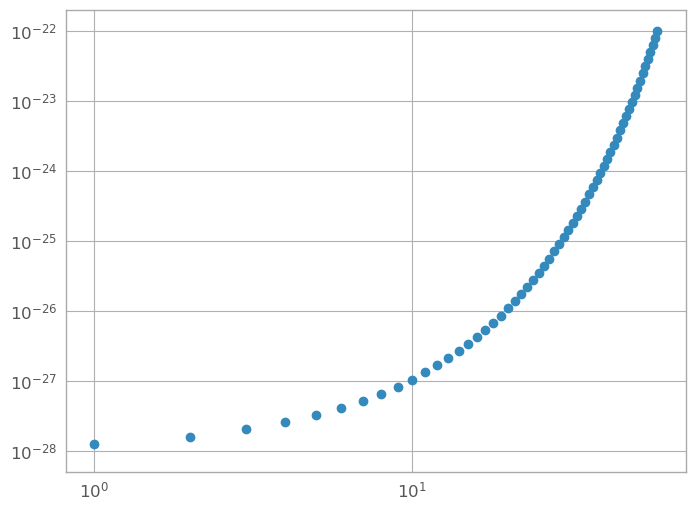

In [122]:
plt.loglog(np.arange(0, 60, 1), np.logspace(-28, -22, 60), 'o')
# plt.loglog(np.arange(0, 100, 1), np.logspace(-30, -18, 100), 'bo')
# plt.loglog(np.arange(0, 120, 1), np.logspace(-30, -18, 120), 'ro')

In [2]:
from scipy import interpolate 
from scipy.interpolate import RegularGridInterpolator
def exctractcirellitable(DMmass,DMchannel,particle,EWcorr):
    warnings.filterwarnings("ignore", category=DeprecationWarning)

    '''
    This function returns the energy spectrum in 1/GeV for the particle production from DM annihilation.
    These results come from the PPPC4DM http://www.marcocirelli.net/PPPC4DMID.html
    Relevant tables should be downloaded and stored locally
    
    DMmass: dark matter mass in GeV
    DMchannel: dark matter annihilation channel with EW correction (no EW correction)
    e 4 (2), mu 7 (3), tau 10 (4), bb 13 (7), tt 14 (8), WW 17 (9), ZZ 20 (10), gamma 22 (12), h 23 (13)
    particle: particle produced from the DM annihilation ('gammas' or 'positrons')
    EWcorr: electroweak corrections ('Yes' or 'No')
    '''

    if EWcorr=='Yes':
        listenergies = 179
        energy_vec = np.arange(-8.9,0.05,0.05)
    elif EWcorr=='No':
        listenergies = 180
        energy_vec = np.arange(-8.95,0.05,0.05)
    else:
        print('Error Wrong value for EWcorr, Yes or No')
    
    energy = np.zeros(listenergies)
    fluxDM = np.zeros(listenergies)
    if EWcorr=='No': 
        table = np.loadtxt('/home/sanghwan/PPPC4/particle_data/AtProduction%sEW_%s.dat'%(EWcorr,particle), skiprows=1)
    else:
        table = np.loadtxt('/home/sanghwan/PPPC4/particle_data/AtProduction_%s.dat'%(particle), skiprows=1)
    massvec = []
    for t in range(len(table)):
        if t%listenergies == 0:
            massvec.append(table[t,0])
    massvec = np.array(massvec)
    
    flux = []
    for t in range(len(table)):
        flux.append(table[t,DMchannel])
    
    f = interpolate.interp2d(massvec, energy_vec, flux, kind='linear')
    
    for t in range(len(energy_vec)):
        fluxDM[t] = f(DMmass,energy_vec[t])
    
    return np.power(10.,energy_vec)*DMmass, fluxDM/(np.log(10.)*np.power(10.,energy_vec)*DMmass)

In [4]:

data = np.loadtxt('/home/sanghwan/C.Weniger/covariance.dat')
ebins = data[:,0:2]  # Energy bins [GeV]
emeans = ebins.prod(axis=1)**0.5  # Geometric mean energy [GeV]
de = ebins[:,1] - ebins[:,0]  # Energy bin width [GeV]
flux = data[:,2]  # (Average flux)*E^2 in energy bin [GeV/cm2/s/sr]
flux_err = data[:,3]  # Flux error [GeV/cm2/s/sr]
empirical_variance = data[:,4:28]  # Only empirical component [(GeV/cm2/s/sr)^2]
full_variance = data[:,28:]  # Variance as it enters the spectral fit [(GeV/cm2/s/sr)^2]
empirical_sigma = np.sqrt(np.diagonal(empirical_variance))  # Diagonal elements
full_sigma = np.sqrt(np.diagonal(full_variance))  # Diagonal elements
inv_GCE_data_err_matrix=np.linalg.inv(full_variance)


model='I'
h=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_{model}_(4).dat')
#h=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_{model}_15yr.dat')
GCE_data_h = h[0:, 1][0:14]
GCE_data_err_h=h[0:, 2][0:14] #Statistical error only
GCE_data_E_h=h[0:, 0][0:14]

f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_{"I"}_15yr.dat')
GCE_data_f = f[0:, 1]
GCE_data_err_f=f[0:, 2] #Statistical error only
GCE_data_E_f=f[0:, 0]

f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_(7).dat')
f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_15yr.dat')
f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_15yr_cholis (1).dat')
#f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')

#f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_12yr_test.dat')

#f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_test_test.dat')

GCE_data_f = f[0:, 1]
GCE_data_err_f=f[0:, 2] #Statistical error only
GCE_data_E_f=f[0:, 0]
GCE_data_E_upper = f[0:, 4] - GCE_data_f
GCE_data_E_lower = GCE_data_f - f[0:, 3]

#i=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_12yr_positive.dat')
#i=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
i=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_positive.dat')
i=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_positive_test.dat')
#i=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_15yr_cholis.dat')
i=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_front_back_16yr_cholis.dat')

#f=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_model_I_test_test.dat')

GCE_data_i = i[0:, 1]
GCE_data_err_i=i[0:, 2] #Statistical error only
GCE_data_E_i=i[0:, 0]
GCE_data_E_upper_i = i[0:, 4] - GCE_data_i
GCE_data_E_lower_i = GCE_data_i - i[0:, 3]

#j = np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_analysis/covariance/GC_12yr_statistical_uncertainty_1.dat')
#GCE_data_err_f=j[0:, 1]

#GCE_data_h[0] *= 0.8
#GCE_data_h[1:4] *= 0.9
#GCE_data_h[12] *= 0.9
#GCE_data_h[13] *= 0.8

#v=np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Model{model}_flux_Inner40x40_masked_disk.dat')
v=np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Model{"XLIX"}_flux_Inner40x40_masked_disk.dat')
#v=np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Model{"I"}_flux_Inner40x40_masked_disk.dat')
#v=np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Model{"XV"}_flux_Inner40x40_masked_disk.dat')

#v=np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_BestFitModel_flux_Inner40x40_masked_disk.dat')
energy=v[0:, 0]
flux_data = v[0:, 1]
lower_flux_error = flux_data - v[0:, 2]
upper_flux_error = v[0:, 3] - flux_data
c=np.load('/home/FermiLAT/Sanghwan/GC_14yr/data/cov_mat_21Dec02.npy')
d=np.loadtxt('/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Statistical_errors.dat')
d=np.diag(d[0:, 1]**2)
cov_matrix=c+d
error_data=np.diag(cov_matrix)

b = np.loadtxt('/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Statistical_errors.dat')

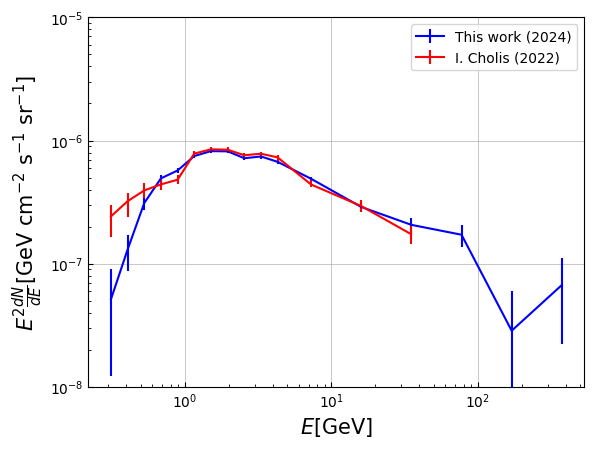

In [5]:
plt.loglog()
plt.ylim(1e-8, 1e-5)
plt.style.use('default')
plt.tick_params(axis='y', which='both', direction='in', left=True)
plt.tick_params(axis='x', which='both', direction='in', bottom=True)
#plt.minorticks_on()
plt.grid(True, which='Major', linestyle='-', linewidth=0.5)



#plt.errorbar(emeans, flux, flux_err, label='F.Calore(2015)', alpha=0.5,color='red')

#plt.errorbar(GCE_data_E_i, GCE_data_i, yerr=[GCE_data_E_lower_i, GCE_data_E_upper_i], label='This work (2024)', alpha=1, color='blue')
plt.errorbar(GCE_data_E_i, GCE_data_i, yerr=GCE_data_err_i, label='This work (2024)', alpha=1, color='blue')

#plt.errorbar(GCE_data_E_h, GCE_data_h, GCE_data_err_h*2, label='This work(12yr data)', alpha=0.5, color='blue')
plt.errorbar(energy, flux_data, yerr=[lower_flux_error, upper_flux_error],label='I. Cholis (2022)', color='red', alpha=1)
#plt.fill_between(energy, flux_data - 2*lower_flux_error, flux_data + 2*upper_flux_error, color='green', alpha=0.5, label=r'$2\sigma$ statistical uncertainty, I. Cholis (2022)')
#plt.errorbar(GCE_data_E_f, GCE_data_f, yerr=np.sqrt(np.diag(covaraince_matrix)), label='This work(15yr data) with sys. uncert.', alpha=1, color='red')
#plt.errorbar(GCE_data_E_f[0:14], GCE_data_f[0:14], GCE_data_err_f[0:14], label='Mine(2022)', alpha=1, color='red')
#plt.errorbar(GCE_data_E_f, GCE_data_f, yerr=GCE_data_err_f, label='15yr with Cholis GDE', alpha=1, color='red')

#plt.errorbar(GCE_data_E_h, GCE_data_h, GCE_data_err_h, label='Model I', alpha=1, color='blue')

#plt.errorbar(GCE_data_E_f, h2h2_theory_data*3.9 ,color='navy',label=r'$m_\psi = 69.2 \, GeV$, $h2h2->4b$, $J=3.9\bar{J}$' )

#plt.plot(GCE_data_E_h, bb_theory_data, label=r'$m_\chi = 40 \, GeV$, $bb$')
#plt.plot(GCE_data_E_h, tau_theory_data, label=r'$m_\chi = 7 \, GeV$, $\tau^+ \tau^-$')

#plt.plot(GCE_data_E_h, flux_interp(GCE_data_E_h))

plt.xlabel('$E$[GeV]', fontsize=15)
plt.ylabel(r'${E}^2 \frac{{dN}}{{dE}}$[GeV cm$^{-2}$ s$^{-1}$ sr$^{-1}$]', fontsize=15)

#plt.text(0.5, 5e-6, '2 sigma fitting error', size=15)
plt.legend()

In [6]:

model='I'
front='front'
i=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
# i = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_I_16yr_positive.dat')

GCE_data_i = i[0:, 1]
GCE_data_err_i=i[0:, 2] #Statistical error only
GCE_data_E_i=i[0:, 0]
GCE_data_E_upper_i = i[0:, 4] - GCE_data_i
GCE_data_E_lower_i = GCE_data_i - i[0:, 3]


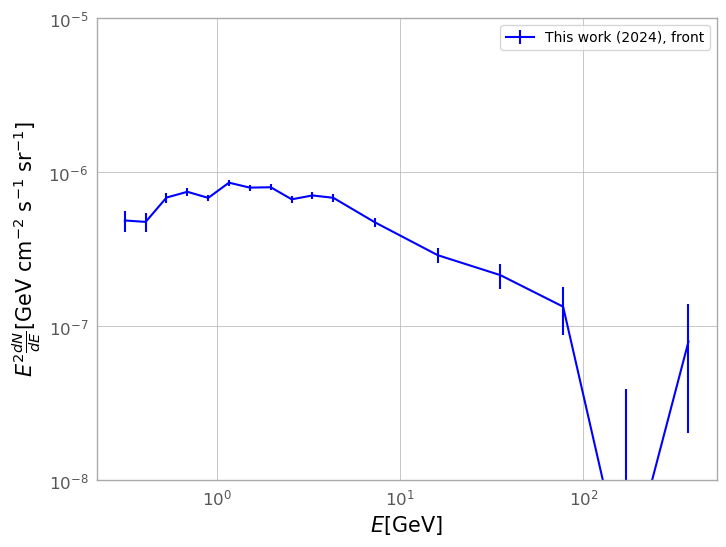

In [7]:
plt.loglog()
plt.ylim(1e-8, 1e-5)
plt.style.use('default')
plt.tick_params(axis='y', which='both', direction='in', left=True)
plt.tick_params(axis='x', which='both', direction='in', bottom=True)
#plt.minorticks_on()
plt.grid(True, which='Major', linestyle='-', linewidth=0.5)

plt.errorbar(GCE_data_E_i, GCE_data_i, yerr=GCE_data_err_i, label=f'This work (2024), {front}', alpha=1, color='blue')


plt.xlabel('$E$[GeV]', fontsize=15)
plt.ylabel(r'${E}^2 \frac{{dN}}{{dE}}$[GeV cm$^{-2}$ s$^{-1}$ sr$^{-1}$]', fontsize=15)

plt.legend()

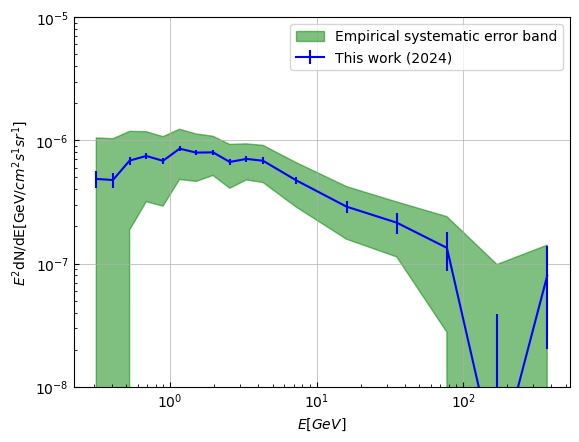

In [30]:
plt.loglog()
plt.ylim(1e-8, 1e-5)
plt.style.use('default')
plt.tick_params(axis='y', which='both', direction='in', left=True)
plt.tick_params(axis='x', which='both', direction='in', bottom=True)
plt.minorticks_on()
plt.grid(True, which='Major', linestyle='-', linewidth=0.5)


cov_matrix=np.diag(np.load('/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_16yr.npy'))
plt.fill_between(GCE_data_E_i, GCE_data_i - np.sqrt(cov_matrix), GCE_data_i + np.sqrt(cov_matrix), color='green', alpha=0.5, label='Empirical systematic error band')

plt.errorbar(GCE_data_E_i, GCE_data_i, yerr=GCE_data_err_i, label='This work (2024)', alpha=1, color='blue')

plt.ylabel(f'$E^2$dN/dE[GeV/$cm^2 s^1 sr^1$]')
plt.xlabel(f'$E[GeV$]')

plt.legend()

## GCE for GDEs preparation

In [102]:
def generate_roman_numerals(n):
    """
    Generate a list of Roman numerals from 1 to n.
    """
    roman_map = [
        (1000, 'M'), (900, 'CM'), (500, 'D'), (400, 'CD'),
        (100, 'C'), (90, 'XC'), (50, 'L'), (40, 'XL'),
        (10, 'X'), (9, 'IX'), (5, 'V'), (4, 'IV'), (1, 'I')
    ]

    def to_roman(num):
        roman = ""
        for value, symbol in roman_map:
            while num >= value:
                roman += symbol
                num -= value
        return roman

    return [to_roman(i) for i in range(1, n + 1)]

In [103]:
name_list=generate_roman_numerals(80)

In [4]:
front='front_back'

In [5]:
existing_list=[]
for name in name_list:
    if os.path.exists(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value'):
        existing_list.append(name)

lhd_value=[]
for name in existing_list:
    value=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value')
    lhd_value.append([name, np.sum(value[0:14])])

sorted_data = sorted(lhd_value, key=lambda x: x[1], reverse=True)

np.savetxt(f'./GC_analysis/GCE_plots/GDE_{front}_likelihood_16yr_E_14.txt', np.array(sorted_data), fmt="%s", header = 'log likelihood, the higher is the better')

lhd_value=[]
for name in existing_list:
    value=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value')
    lhd_value.append([name, np.sum(value[0:17])])

sorted_data = sorted(lhd_value, key=lambda x: x[1], reverse=True)

np.savetxt(f'./GC_analysis/GCE_plots/GDE_{front}_likelihood_16yr_E_17.txt', np.array(sorted_data), fmt="%s", header = 'log likelihood, the higher is the better')


# Print the sorted list
for item in sorted_data:
    print(item)
print(len(sorted_data))

['I', -2430304.4494027495]
['LIII', -2430521.0959099787]
['X', -2430662.2416427154]
['XLI', -2430990.179265266]
['XV', -2431044.064918089]
['XLII', -2431641.504347044]
['XLIII', -2431670.0753144547]
['VII', -2431777.9995781938]
['LV', -2431778.0595038994]
['VI', -2431883.754807438]
['XLIX', -2431993.7970977654]
['XXXIX', -2432027.7397046047]
['LVI', -2432194.2196432897]
['V', -2432251.6101673297]
['XLVII', -2432378.5047451546]
['IV', -2432459.357871058]
['LXXIV', -2432545.0981652276]
['XLVIII', -2432560.254135964]
['LII', -2432764.8255699887]
['IX', -2432855.705747187]
['L', -2432863.112899466]
['LXXV', -2432877.3199422047]
['XLIV', -2432932.83334861]
['XLV', -2432967.6820991714]
['XL', -2433191.4875159794]
['LI', -2433451.7591939988]
['XXXVIII', -2433730.164612552]
['XLVI', -2433778.041817136]
['LXXVI', -2434188.309512105]
['LXXX', -2434679.1681434116]
['LXXIII', -2434699.65382516]
['LXXIX', -2434800.0319018005]
['LX', -2435597.1880018455]
['LXXVII', -2435626.2589527112]
['XXXIII', -2

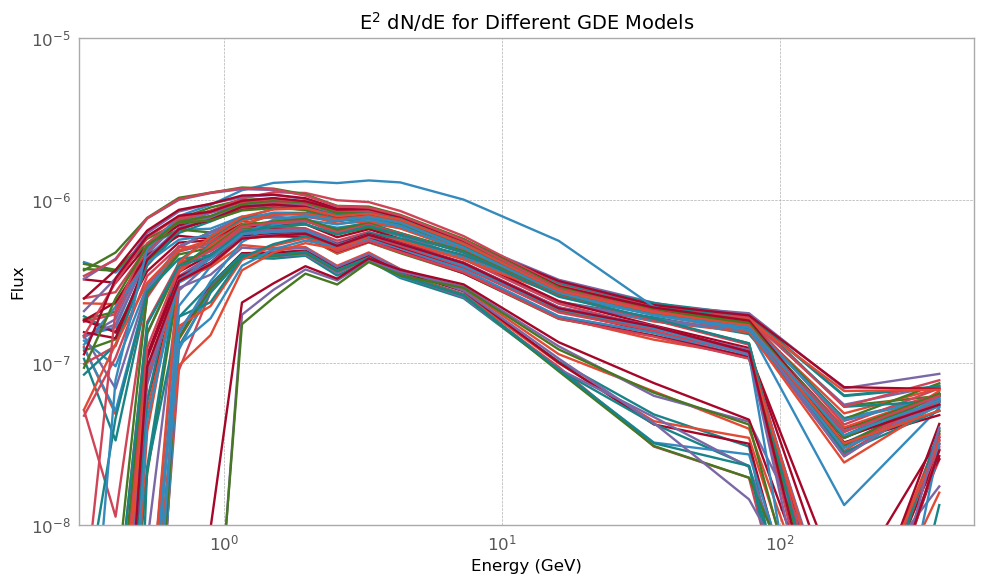

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# List of model names
model_names = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'

# Initialize a plot
plt.figure(figsize=(10, 6))

# Loop through the files and plot the data
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the data (17x5) as a numpy array
        data = np.loadtxt(file_name)
        
        # Extract Energy (column 0) and Flux (column 1)
        energy = data[:, 0]
        flux = data[:, 1]
        
        # Plot Energy vs Flux
        plt.plot(energy, flux, label=f"Model {model}")
    
    except FileNotFoundError:
        print(f"File not found: {file_name}")
        continue
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")
        continue

# Add plot decorations
plt.xlabel("Energy (GeV)", fontsize=12)
plt.ylabel("Flux", fontsize=12)
plt.title(r"E$^2$ dN/dE for Different GDE Models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy if needed
plt.yscale("log")  # Log-scale for Flux if needed
#plt.legend()
#plt.grid(True, which="both", linestyle="--", linewidth=0.5)

plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)


# Show the plot
plt.tight_layout()
plt.show()


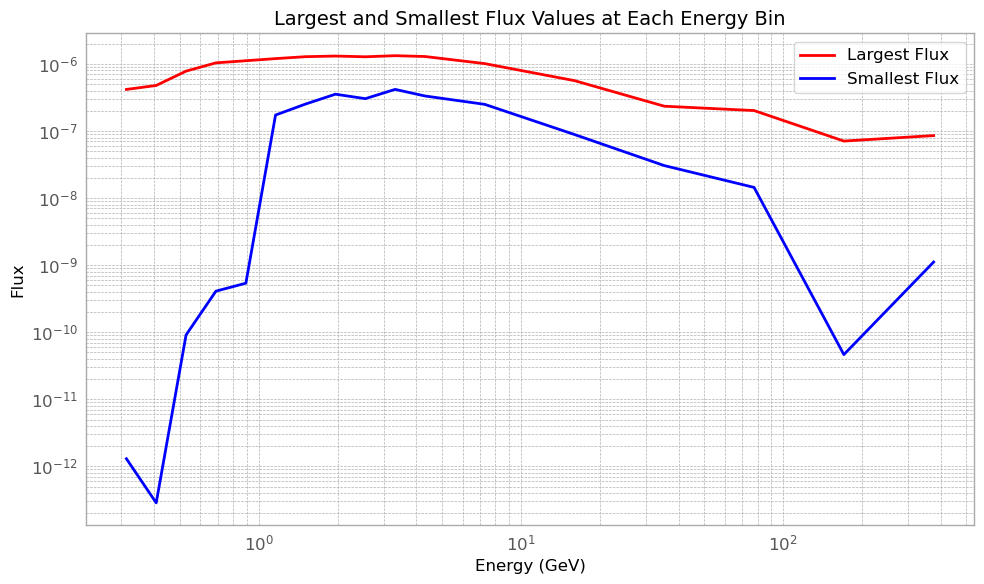

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# List of model names
model_names = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'

# Initialize lists to hold energy and flux data
energy = None
flux_values = []

# Load data for each model
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the file and extract energy and flux
        data = np.loadtxt(file_name)
        
        # Store energy bins (assume same energy bins for all files)
        if energy is None:
            energy = data[:, 0]  # Energy bins
        
        # Append flux values
        flux_values.append(data[:, 1])
    
    except FileNotFoundError:
        print(f"File not found: {file_name}")
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")

# Convert list of flux values into a numpy array
flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)

# Calculate the largest and smallest flux values at each energy bin
flux_max = np.max(flux_values, axis=0)
flux_min = np.min(flux_values, axis=0)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(energy, flux_max, label="Largest Flux", color="red", linestyle="-", linewidth=2)
plt.plot(energy, flux_min, label="Smallest Flux", color="blue", linestyle="-", linewidth=2)

# Add plot decorations
plt.xlabel("Energy (GeV)", fontsize=12)
plt.ylabel("Flux", fontsize=12)
plt.title("Largest and Smallest Flux Values at Each Energy Bin", fontsize=14)
plt.xscale("log")  # Log-scale for Energy if needed
plt.yscale("log")  # Log-scale for Flux if needed
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()


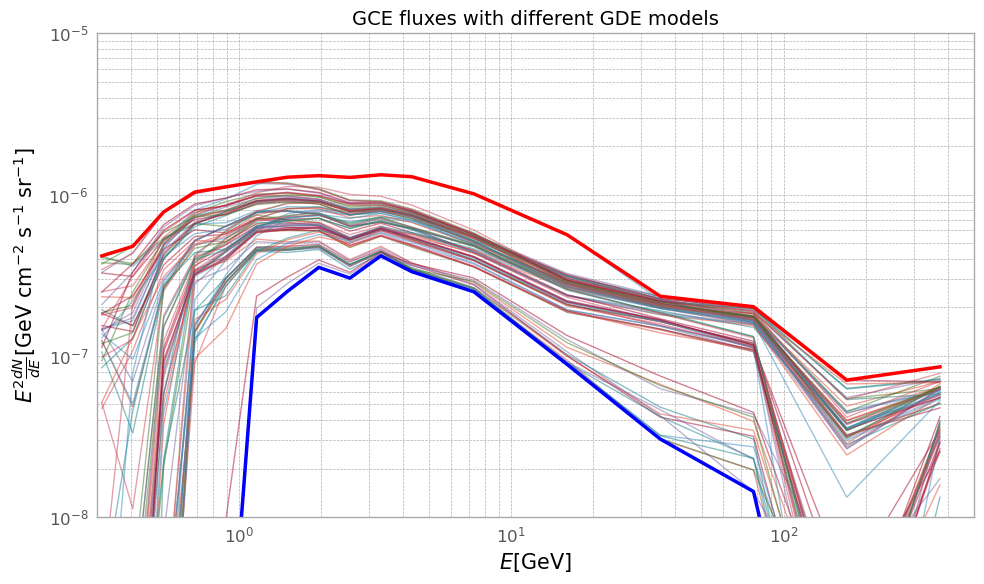

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Initialize lists to hold energy and flux data
energy = None
flux_values = []
model_fluxes = {}

# Load data for each model
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the file and extract energy and flux
        data = np.loadtxt(file_name)
        
        # Store energy bins (assume same energy bins for all files)
        if energy is None:
            energy = data[:, 0]  # Energy bins
        
        # Store flux values
        flux = data[:, 1]
        flux_values.append(flux)
        model_fluxes[model] = flux  # Store flux with model name
    
    except FileNotFoundError:
        print(f"File not found: {file_name}")
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")

# Convert list of flux values into a numpy array
flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)

# Calculate the largest and smallest flux values at each energy bin
flux_max = np.max(flux_values, axis=0)
flux_min = np.min(flux_values, axis=0)

# Plot the results
plt.figure(figsize=(10, 6))

# Plot flux of different models
for model, flux in model_fluxes.items():
    plt.plot(energy, flux, label=f"Model {model}", linewidth=1.0, alpha=0.5)

# Overlay largest and smallest flux values
plt.plot(energy, flux_max, label="Largest Flux", color="red", linestyle="-", linewidth=2.5)
plt.plot(energy, flux_min, label="Smallest Flux", color="blue", linestyle="-", linewidth=2.5)

# Add plot decorations
plt.xlabel("Energy (GeV)", fontsize=12)
plt.ylabel("Flux", fontsize=12)
plt.title("Flux for Different Models and Extremal Values", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Show the plot
plt.tight_layout()
#plt.show()


plt.xlabel('$E$[GeV]', fontsize=15)
plt.ylabel(r'${E}^2 \frac{{dN}}{{dE}}$[GeV cm$^{-2}$ s$^{-1}$ sr$^{-1}$]', fontsize=15)


plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.show()


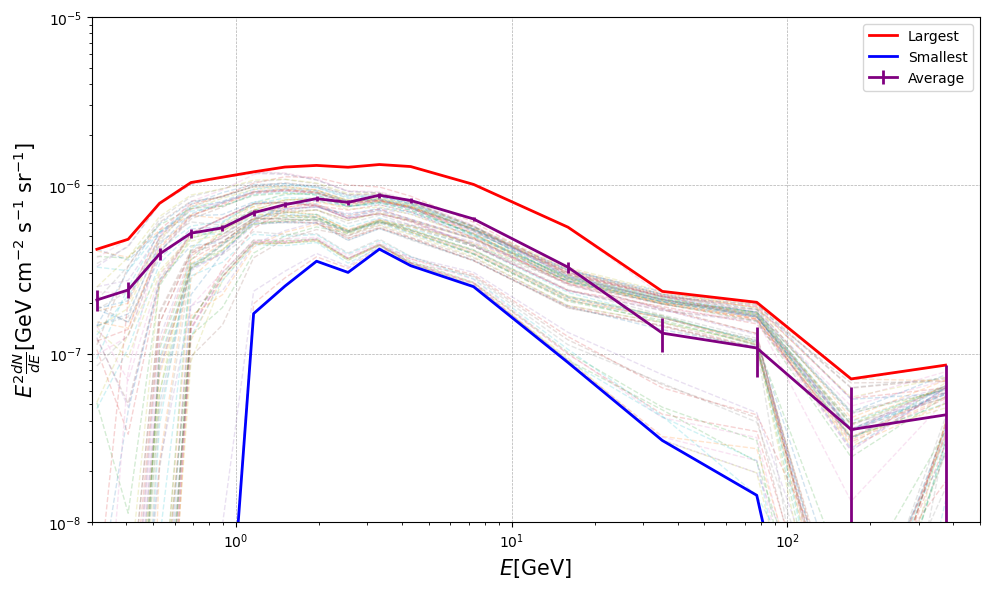

In [520]:
import numpy as np
import matplotlib.pyplot as plt


# Initialize lists to hold energy and flux data
energy = None
flux_values = []
statistical_uncertainty_values = []
model_fluxes = {}

# Load data for each model
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the file and extract energy and flux
        data = np.loadtxt(file_name)
        
        # Store energy bins (assume same energy bins for all files)
        if energy is None:
            energy = data[:, 0]  # Energy bins
        
        # Store flux values
        flux = data[:, 1]
        flux_values.append(flux)
        model_fluxes[model] = flux  # Store flux with model name

        statistical_uncertainty = data[:, 2]
        statistical_uncertainty_values.append(statistical_uncertainty)
    
    except FileNotFoundError:
        print(f"File not found: {file_name}")
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")

# Convert list of flux values into a numpy array
flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)
statistical_uncertainty_values = np.array(statistical_uncertainty_values)
# Calculate the largest, smallest, and median flux values at each energy bin
flux_max = np.max(flux_values, axis=0)
flux_min = np.min(flux_values, axis=0)
flux_median = np.median(flux_values, axis=0)
flux_average = (flux_max+flux_min)/2

statistical_uncertainty_average = np.average(statistical_uncertainty_values, axis=0)
# Plot the results
#plt.figure(figsize=(10, 10))
plt.figure(figsize=(10, 6))

# Plot flux of different models
for model, flux in model_fluxes.items():
    #plt.plot(energy, flux, label=f"Model {model}", linewidth=0.2, alpha=1)
    plt.plot(energy, flux, linewidth=1, alpha=0.2, linestyle='dashed')

# Overlay largest, smallest, and median flux values
plt.plot(energy, flux_max, label="Largest", color="red", linestyle="-", linewidth=2)
plt.plot(energy, flux_min, label="Smallest", color="blue", linestyle="-", linewidth=2)
#plt.plot(energy, flux_median, label="Median Flux", color="green", linestyle="-", linewidth=2)
plt.errorbar(energy, flux_average, statistical_uncertainty_average,label="Average", color="purple", linestyle="-", linewidth=2)
# Add plot decorations

plt.xlabel('$E$[GeV]', fontsize=15)
plt.ylabel(r'${E}^2 \frac{{dN}}{{dE}}$[GeV cm$^{-2}$ s$^{-1}$ sr$^{-1}$]', fontsize=15)

#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.show()


In [521]:
np.savetxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat', np.vstack([energy, flux_average, flux_min, flux_max, statistical_uncertainty_average]).T, header="energy, flux_median, flux_min, flux_max, statistical uncertainty average")

In [126]:
front='front_back'

In [127]:
existing_list=[]
for name in name_list:
    if os.path.exists(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value'):
        existing_list.append(name)

lhd_value=[]
for name in existing_list:
    value=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value')
    lhd_value.append([name, np.sum(value[0:14])])

sorted_data = sorted(lhd_value, key=lambda x: x[1], reverse=True)

# np.savetxt(f'./GC_analysis/GCE_plots/GDE_{front}_likelihood_16yr_E_14.txt', np.array(sorted_data), fmt="%s", header = 'log likelihood, the higher is the better')

lhd_value=[]
for name in existing_list:
    value=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value')
    lhd_value.append([name, np.sum(value[0:17])])

sorted_data = sorted(lhd_value, key=lambda x: x[1], reverse=True)

# np.savetxt(f'./GC_analysis/GCE_plots/GDE_{front}_likelihood_16yr_E_17.txt', np.array(sorted_data), fmt="%s", header = 'log likelihood, the higher is the better')


# Print the sorted list
for item in sorted_data:
    print(item)
print(len(sorted_data))

['I', -2430304.4494027495]
['LIII', -2430521.0959099787]
['X', -2430662.2416427154]
['XLI', -2430990.179265266]
['XV', -2431044.064918089]
['XLII', -2431641.504347044]
['XLIII', -2431670.0753144547]
['VII', -2431777.9995781938]
['LV', -2431778.0595038994]
['VI', -2431883.754807438]
['XLIX', -2431993.7970977654]
['XXXIX', -2432027.7397046047]
['LVI', -2432194.2196432897]
['V', -2432251.6101673297]
['XLVII', -2432378.5047451546]
['IV', -2432459.357871058]
['LXXIV', -2432545.0981652276]
['XLVIII', -2432560.254135964]
['LII', -2432764.8255699887]
['IX', -2432855.705747187]
['L', -2432863.112899466]
['LXXV', -2432877.3199422047]
['XLIV', -2432932.83334861]
['XLV', -2432967.6820991714]
['XL', -2433191.4875159794]
['LI', -2433451.7591939988]
['XXXVIII', -2433730.164612552]
['XLVI', -2433778.041817136]
['LXXVI', -2434188.309512105]
['LXXX', -2434679.1681434116]
['LXXIII', -2434699.65382516]
['LXXIX', -2434800.0319018005]
['LX', -2435597.1880018455]
['LXXVII', -2435626.2589527112]
['XXXIII', -2

In [176]:
front

'front_back'

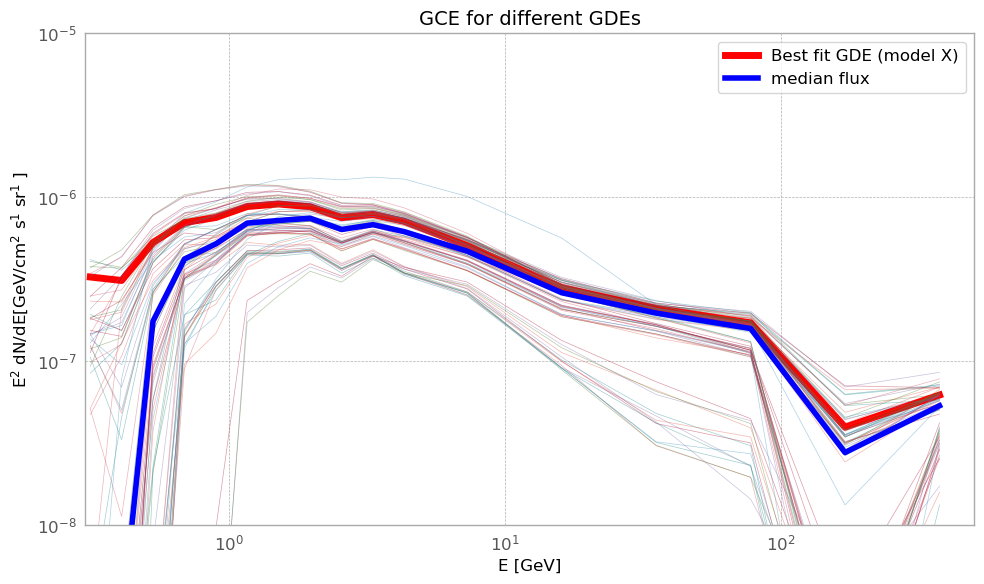

In [175]:
import matplotlib.pyplot as plt
import numpy as np

# List of model names
model_names = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'
flux_values = []

# Initialize a plot
plt.figure(figsize=(10, 6))

# Loop through the files and plot the data
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the data (17x5) as a numpy array
        data = np.loadtxt(file_name)
        
        # Extract Energy (column 0) and Flux (column 1)
        energy = data[:, 0]
        flux = data[:, 1]
        flux_values.append(data[:, 1])

        # Plot Energy vs Flux
        # plt.plot(energy, flux, label=f"Model {model}", alpha=0.3, linestyle='dashed')
        plt.plot(energy, flux, alpha=0.4, linestyle='solid', linewidth = 0.5)
        if model == 'X':
            plt.plot(energy, flux, label='Best fit GDE (model X)', linewidth=5, color='red')
    except FileNotFoundError:
        print(f"File not found: {file_name}")
        continue
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")
        continue

flux_max = np.max(flux_values, axis=0)
flux_min = np.min(flux_values, axis=0)
flux_avg = np.median(flux_values, axis=0)
plt.plot(energy, flux_avg, label='median flux', linewidth=4, color='blue')
# Add plot decorations
plt.xlabel("Energy (GeV)", fontsize=12)
plt.ylabel("Flux", fontsize=12)
plt.title("GCE for different GDEs", fontsize=14)
plt.xscale("log")  # Log-scale for Energy if needed
plt.yscale("log")  # Log-scale for Flux if needed
#plt.legend()
#plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# plt.grid(True, which="major", linestyle="--", linewidth=0.5)
# plt.ylim(1e-8, 1e-5)
# plt.xlim(0.3, 500)

plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')


# Show the plot
plt.tight_layout()
plt.show()


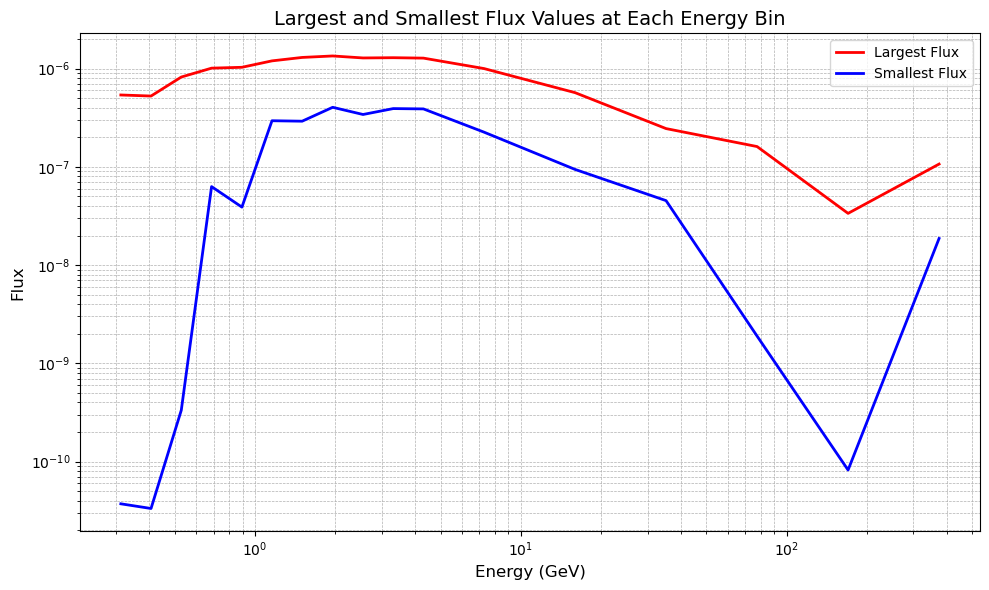

In [525]:
import numpy as np
import matplotlib.pyplot as plt

# List of model names
model_names = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'

# Initialize lists to hold energy and flux data
energy = None
flux_values = []

# Load data for each model
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the file and extract energy and flux
        data = np.loadtxt(file_name)
        
        # Store energy bins (assume same energy bins for all files)
        if energy is None:
            energy = data[:, 0]  # Energy bins
        
        # Append flux values
        flux_values.append(data[:, 1])
    
    except FileNotFoundError:
        print(f"File not found: {file_name}")
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")

# Convert list of flux values into a numpy array
flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)

# Calculate the largest and smallest flux values at each energy bin
flux_max = np.max(flux_values, axis=0)
flux_min = np.min(flux_values, axis=0)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(energy, flux_max, label="Largest Flux", color="red", linestyle="-", linewidth=2)
plt.plot(energy, flux_min, label="Smallest Flux", color="blue", linestyle="-", linewidth=2)

# Add plot decorations
plt.xlabel("Energy (GeV)", fontsize=12)
plt.ylabel("Flux", fontsize=12)
plt.title("Largest and Smallest Flux Values at Each Energy Bin", fontsize=14)
plt.xscale("log")  # Log-scale for Energy if needed
plt.yscale("log")  # Log-scale for Flux if needed
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()


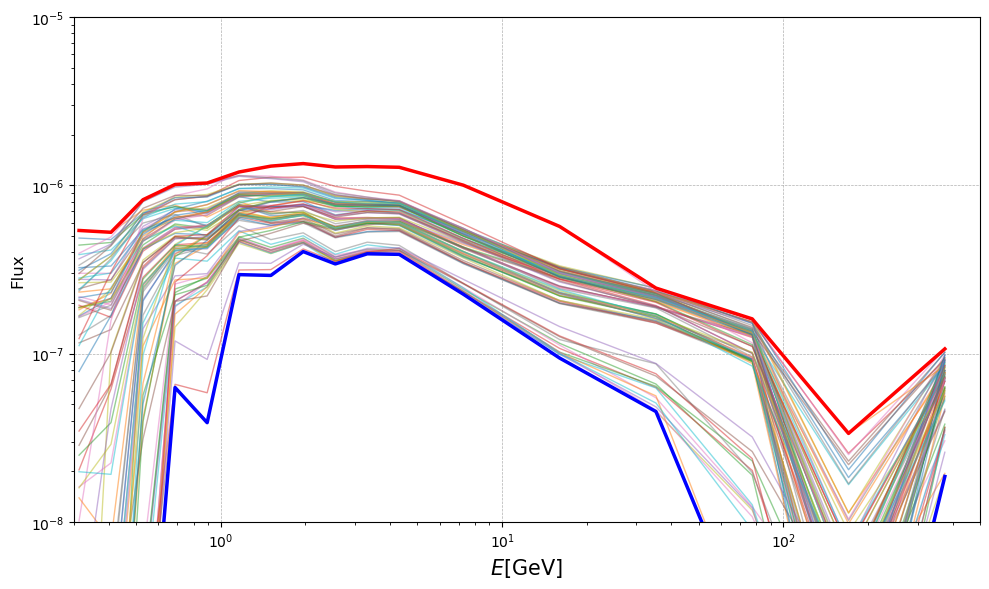

In [526]:
import numpy as np
import matplotlib.pyplot as plt

# Initialize lists to hold energy and flux data
energy = None
flux_values = []
model_fluxes = {}

# Load data for each model
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the file and extract energy and flux
        data = np.loadtxt(file_name)
        
        # Store energy bins (assume same energy bins for all files)
        if energy is None:
            energy = data[:, 0]  # Energy bins
        
        # Store flux values
        flux = data[:, 1]
        flux_values.append(flux)
        model_fluxes[model] = flux  # Store flux with model name
    
    except FileNotFoundError:
        print(f"File not found: {file_name}")
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")

# Convert list of flux values into a numpy array
flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)

# Calculate the largest and smallest flux values at each energy bin
flux_max = np.max(flux_values, axis=0)
flux_min = np.min(flux_values, axis=0)

# Plot the results
plt.figure(figsize=(10, 6))

# Plot flux of different models
for model, flux in model_fluxes.items():
    plt.plot(energy, flux, label=f"Model {model}", linewidth=1.0, alpha=0.5)

# Overlay largest and smallest flux values
plt.plot(energy, flux_max, label="Largest Flux", color="red", linestyle="-", linewidth=2.5)
plt.plot(energy, flux_min, label="Smallest Flux", color="blue", linestyle="-", linewidth=2.5)

# Add plot decorations
plt.xlabel("Energy (GeV)", fontsize=12)
plt.ylabel("Flux", fontsize=12)
#plt.title("Flux for Different Models and Extremal Values", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend()
#plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Show the plot
plt.tight_layout()
#plt.show()


plt.xlabel('$E$[GeV]', fontsize=15)
#plt.ylabel(r'${E}^2 \frac{{dN}}{{dE}}$[GeV cm$^{-2}$ s$^{-1}$ sr$^{-1}$]', fontsize=15)


#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.show()


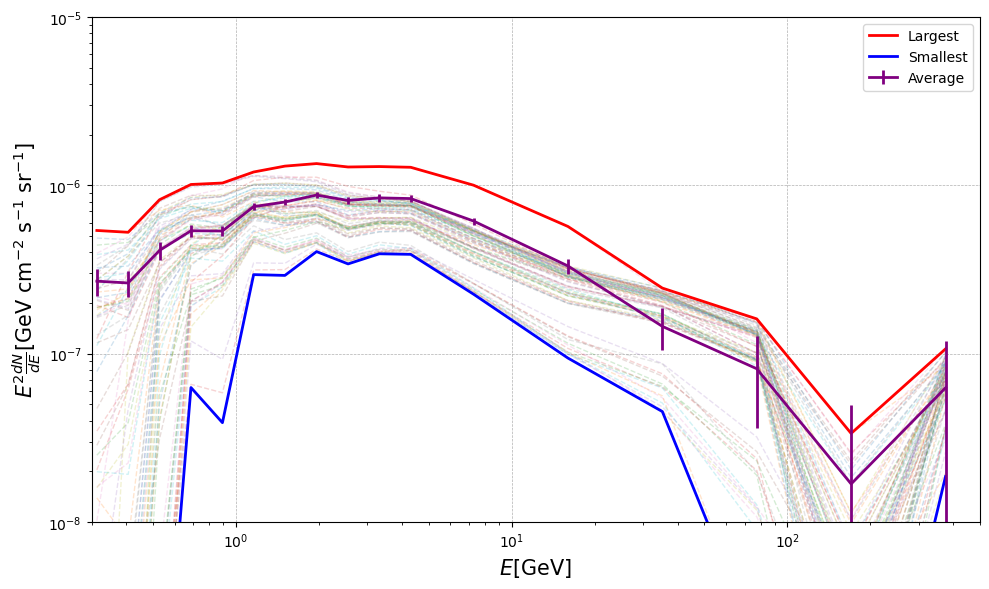

In [527]:
import numpy as np
import matplotlib.pyplot as plt


# Initialize lists to hold energy and flux data
energy = None
flux_values = []
statistical_uncertainty_values = []
model_fluxes = {}

# Load data for each model
for model in model_names:
    file_name = file_pattern.format(model, front)
    try:
        # Load the file and extract energy and flux
        data = np.loadtxt(file_name)
        
        # Store energy bins (assume same energy bins for all files)
        if energy is None:
            energy = data[:, 0]  # Energy bins
        
        # Store flux values
        flux = data[:, 1]
        flux_values.append(flux)
        model_fluxes[model] = flux  # Store flux with model name

        statistical_uncertainty = data[:, 2]
        statistical_uncertainty_values.append(statistical_uncertainty)
    
    except FileNotFoundError:
        print(f"File not found: {file_name}")
    except Exception as e:
        print(f"Error reading file {file_name}: {e}")

# Convert list of flux values into a numpy array
flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)
statistical_uncertainty_values = np.array(statistical_uncertainty_values)
# Calculate the largest, smallest, and median flux values at each energy bin
flux_max = np.max(flux_values, axis=0)
flux_min = np.min(flux_values, axis=0)
flux_median = np.median(flux_values, axis=0)
flux_average = (flux_max+flux_min)/2

statistical_uncertainty_average = np.average(statistical_uncertainty_values, axis=0)
# Plot the results
#plt.figure(figsize=(10, 10))
plt.figure(figsize=(10, 6))

# Plot flux of different models
for model, flux in model_fluxes.items():
    #plt.plot(energy, flux, label=f"Model {model}", linewidth=0.2, alpha=1)
    plt.plot(energy, flux, linewidth=1, alpha=0.2, linestyle='dashed')

# Overlay largest, smallest, and median flux values
plt.plot(energy, flux_max, label="Largest", color="red", linestyle="-", linewidth=2)
plt.plot(energy, flux_min, label="Smallest", color="blue", linestyle="-", linewidth=2)
#plt.plot(energy, flux_median, label="Median Flux", color="green", linestyle="-", linewidth=2)
plt.errorbar(energy, flux_average, statistical_uncertainty_average,label="Average", color="purple", linestyle="-", linewidth=2)
# Add plot decorations

plt.xlabel('$E$[GeV]', fontsize=15)
plt.ylabel(r'${E}^2 \frac{{dN}}{{dE}}$[GeV cm$^{-2}$ s$^{-1}$ sr$^{-1}$]', fontsize=15)

#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.show()


In [434]:
np.savetxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat', np.vstack([energy, flux_average, flux_min, flux_max, statistical_uncertainty_average]).T, header="energy, flux_median, flux_min, flux_max, statistical uncertainty average")

## End of GDEs flux plotting
## Start of GDEs covariance matrix generation

In [57]:
front='front_back'

In [58]:
existing_list=[]
for name in name_list:
    if os.path.exists(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value'):
        existing_list.append(name)
len(existing_list)

80

In [59]:
output=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
sys_upp = output[0:, 3] - output[0:, 1]
sys_low = output[0:, 1] - output[0:, 2]

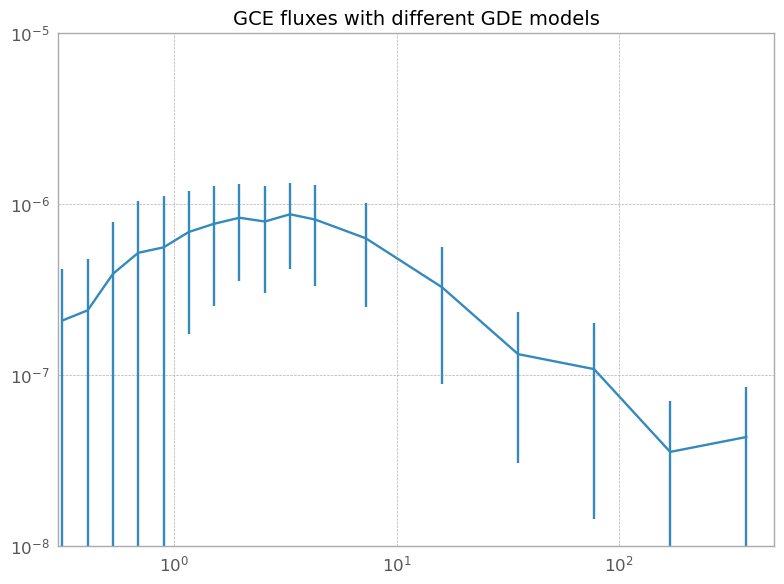

In [60]:
plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp])

plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.show()


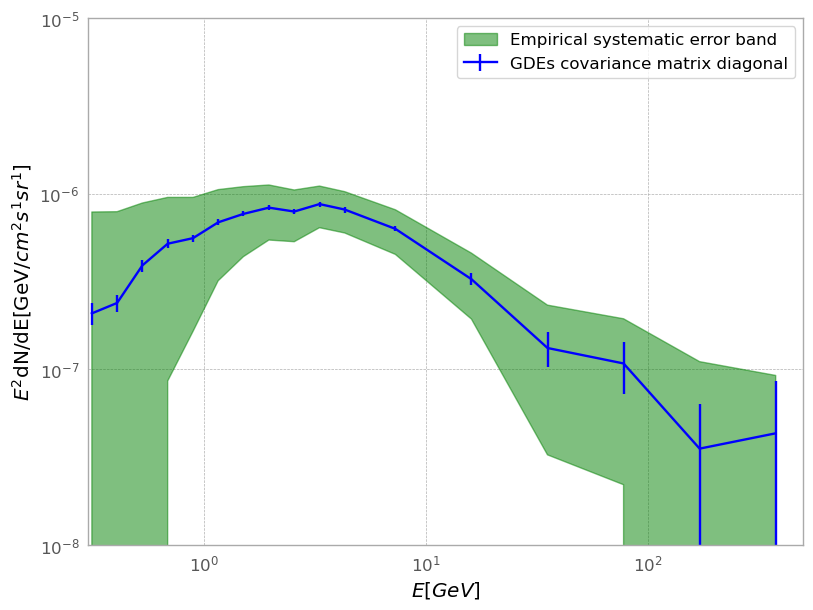

In [62]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')


cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_front_back_16yr.npy')
plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

plt.errorbar(output[0:, 0], output[0:, 1], output[0:, -1], label='GDEs covariance matrix diagonal', color='blue')

#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.ylabel(f'$E^2$dN/dE[GeV/$cm^2 s^1 sr^1$]')
plt.xlabel(f'$E[GeV$]')

plt.show()



In [538]:
import numpy as np

# List of all available models
all_models = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'

# Function to calculate the covariance matrix
def calculate_covariance(selected_models):
    # Initialize lists to hold energy and flux data
    energy = None
    flux_values = []
    
    # Load data for each selected model
    for model in selected_models:
        file_name = file_pattern.format(model, front)
        try:
            # Load the file and extract energy and flux
            data = np.loadtxt(file_name)
            
            # Store energy bins (assume same energy bins for all files)
            if energy is None:
                energy = data[:, 0][0:14]  # Energy bins
            
            # Store flux values
            flux = data[:, 1][0:14]
            flux_values.append(flux)
        
        except FileNotFoundError:
            print(f"File not found: {file_name}")
        except Exception as e:
            print(f"Error reading file {file_name}: {e}")
    
    # Convert list of flux values into a numpy array
    flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)
    
    # Transpose flux_values so that rows correspond to energy bins
    flux_values = flux_values.T  # New shape: (num_bins, num_models)
    
    # Calculate covariance matrix across energy bins
    covariance_matrix = np.cov(flux_values, rowvar=True)
    
    return flux_values, energy, covariance_matrix

# Example: Select a subset of models
selected_models = all_models

# Calculate the covariance matrix for the selected models
flux_values, energy, covariance_matrix = calculate_covariance(selected_models)

# Perform PCA: Eigenvalue decomposition
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Sort eigenvalues and eigenvectors in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# Select the top two eigenvalues and their corresponding eigenvectors
top_eigenvalues = eigenvalues[:2]
top_eigenvectors = eigenvectors[:, :2]

# # Reconstruct the truncated covariance matrix
# truncated_covariance = np.zeros_like(covariance_matrix)
# for i in range(2):  # Use only the top two eigenvalues and eigenvectors
#     truncated_covariance += top_eigenvalues[i] * np.outer(top_eigenvectors[:, i], top_eigenvectors[:, i])

# # Print results
# print("Truncated Covariance Matrix (Using Top 2 Eigenvectors):")
# #print(truncated_covariance)

# # Save the truncated covariance matrix to a file
#np.save("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_truncated_covariance_matrix_16yr.npy", truncated_covariance)


np.save(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_14x14_16yr.npy", covariance_matrix)

print("Truncated covariance matrix saved as 'GDE_truncated_covariance_matrix.txt'")


Truncated covariance matrix saved as 'GDE_truncated_covariance_matrix.txt'


In [539]:
import numpy as np

# List of all available models
all_models = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'

# Function to calculate the covariance matrix
def calculate_covariance(selected_models):
    # Initialize lists to hold energy and flux data
    energy = None
    flux_values = []
    
    # Load data for each selected model
    for model in selected_models:
        file_name = file_pattern.format(model, front)
        try:
            # Load the file and extract energy and flux
            data = np.loadtxt(file_name)
            
            # Store energy bins (assume same energy bins for all files)
            if energy is None:
                energy = data[:, 0]  # Energy bins
            
            # Store flux values
            flux = data[:, 1]
            flux_values.append(flux)
        
        except FileNotFoundError:
            print(f"File not found: {file_name}")
        except Exception as e:
            print(f"Error reading file {file_name}: {e}")
    
    # Convert list of flux values into a numpy array
    flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)
    
    # Transpose flux_values so that rows correspond to energy bins
    flux_values = flux_values.T  # New shape: (num_bins, num_models)
    
    # Calculate covariance matrix across energy bins
    covariance_matrix = np.cov(flux_values, rowvar=True)
    
    return flux_values, energy, covariance_matrix

# Example: Select a subset of models
selected_models = all_models

# Calculate the covariance matrix for the selected models
flux_values, energy, covariance_matrix = calculate_covariance(selected_models)

# Perform PCA: Eigenvalue decomposition
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Sort eigenvalues and eigenvectors in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# Select the top two eigenvalues and their corresponding eigenvectors
top_eigenvalues = eigenvalues[:2]
top_eigenvectors = eigenvectors[:, :2]

# # Reconstruct the truncated covariance matrix
# truncated_covariance = np.zeros_like(covariance_matrix)
# for i in range(2):  # Use only the top two eigenvalues and eigenvectors
#     truncated_covariance += top_eigenvalues[i] * np.outer(top_eigenvectors[:, i], top_eigenvectors[:, i])

# # Print results
# print("Truncated Covariance Matrix (Using Top 2 Eigenvectors):")
# #print(truncated_covariance)

# # Save the truncated covariance matrix to a file
#np.save("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_truncated_covariance_matrix_16yr.npy", truncated_covariance)


np.save(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_17x17_16yr.npy", covariance_matrix)

print("Truncated covariance matrix saved as 'GDE_truncated_covariance_matrix.txt'")


Truncated covariance matrix saved as 'GDE_truncated_covariance_matrix.txt'


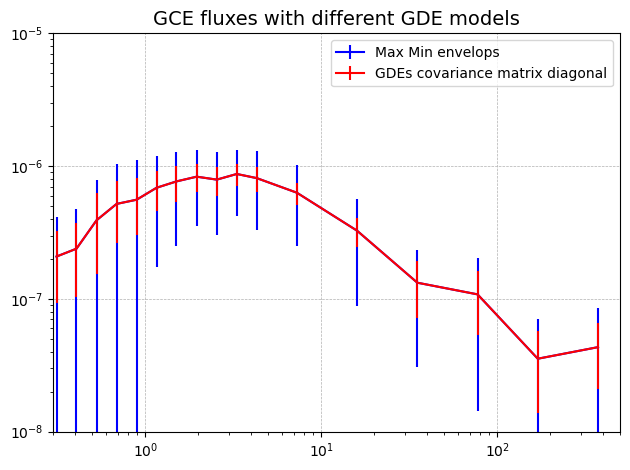

In [270]:
plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')

plt.errorbar(output[0:, 0], output[0:, 1], yerr=np.sqrt(np.diag(covariance_matrix)), label='GDEs covariance matrix diagonal', color='red')

plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.show()



In [40]:
front='front'

In [41]:
existing_list=[]
for name in name_list:
    if os.path.exists(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{name}_{front}_16yr_cholis_likelihood_value'):
        existing_list.append(name)
len(existing_list)

80

In [42]:
output=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
sys_upp = output[0:, 3] - output[0:, 1]
sys_low = output[0:, 1] - output[0:, 2]

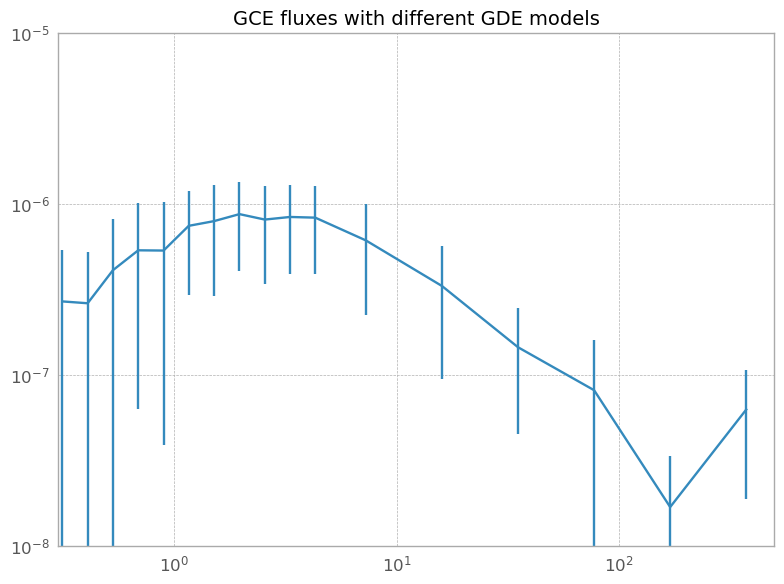

In [43]:
plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp])

plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.show()


In [44]:
import numpy as np

# List of all available models
all_models = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'

# Function to calculate the covariance matrix
def calculate_covariance(selected_models):
    # Initialize lists to hold energy and flux data
    energy = None
    flux_values = []
    
    # Load data for each selected model
    for model in selected_models:
        file_name = file_pattern.format(model, front)
        try:
            # Load the file and extract energy and flux
            data = np.loadtxt(file_name)
            
            # Store energy bins (assume same energy bins for all files)
            if energy is None:
                energy = data[:, 0][0:14]  # Energy bins
            
            # Store flux values
            flux = data[:, 1][0:14]
            flux_values.append(flux)
        
        except FileNotFoundError:
            print(f"File not found: {file_name}")
        except Exception as e:
            print(f"Error reading file {file_name}: {e}")
    
    # Convert list of flux values into a numpy array
    flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)
    
    # Transpose flux_values so that rows correspond to energy bins
    flux_values = flux_values.T  # New shape: (num_bins, num_models)
    
    # Calculate covariance matrix across energy bins
    covariance_matrix = np.cov(flux_values, rowvar=True)
    
    return flux_values, energy, covariance_matrix

# Example: Select a subset of models
selected_models = all_models

# Calculate the covariance matrix for the selected models
flux_values, energy, covariance_matrix = calculate_covariance(selected_models)

# Perform PCA: Eigenvalue decomposition
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Sort eigenvalues and eigenvectors in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# Select the top two eigenvalues and their corresponding eigenvectors
top_eigenvalues = eigenvalues[:2]
top_eigenvectors = eigenvectors[:, :2]

# # Reconstruct the truncated covariance matrix
# truncated_covariance = np.zeros_like(covariance_matrix)
# for i in range(2):  # Use only the top two eigenvalues and eigenvectors
#     truncated_covariance += top_eigenvalues[i] * np.outer(top_eigenvectors[:, i], top_eigenvectors[:, i])

# # Print results
# print("Truncated Covariance Matrix (Using Top 2 Eigenvectors):")
# #print(truncated_covariance)

# # Save the truncated covariance matrix to a file
#np.save("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_truncated_covariance_matrix_16yr.npy", truncated_covariance)


np.save(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_14x14_16yr.npy", covariance_matrix)

print(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_14x14_16yr.npy")


/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_front_14x14_16yr.npy


In [18]:
import numpy as np

# List of all available models
all_models = existing_list#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XV', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']

# File name pattern
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'

# Function to calculate the covariance matrix
def calculate_covariance(selected_models):
    # Initialize lists to hold energy and flux data
    energy = None
    flux_values = []
    
    # Load data for each selected model
    for model in selected_models:
        file_name = file_pattern.format(model, front)
        try:
            # Load the file and extract energy and flux
            data = np.loadtxt(file_name)
            
            # Store energy bins (assume same energy bins for all files)
            if energy is None:
                energy = data[:, 0]  # Energy bins
            
            # Store flux values
            flux = data[:, 1]
            flux_values.append(flux)
        
        except FileNotFoundError:
            print(f"File not found: {file_name}")
        except Exception as e:
            print(f"Error reading file {file_name}: {e}")
    
    # Convert list of flux values into a numpy array
    flux_values = np.array(flux_values)  # Shape: (num_models, num_bins)
    
    # Transpose flux_values so that rows correspond to energy bins
    flux_values = flux_values.T  # New shape: (num_bins, num_models)
    
    # Calculate covariance matrix across energy bins
    covariance_matrix = np.cov(flux_values, rowvar=True)
    
    return flux_values, energy, covariance_matrix

# Example: Select a subset of models
selected_models = all_models

# Calculate the covariance matrix for the selected models
flux_values, energy, covariance_matrix = calculate_covariance(selected_models)

# Perform PCA: Eigenvalue decomposition
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Sort eigenvalues and eigenvectors in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# Select the top two eigenvalues and their corresponding eigenvectors
top_eigenvalues = eigenvalues[:2]
top_eigenvectors = eigenvectors[:, :2]

# # Reconstruct the truncated covariance matrix
# truncated_covariance = np.zeros_like(covariance_matrix)
# for i in range(2):  # Use only the top two eigenvalues and eigenvectors
#     truncated_covariance += top_eigenvalues[i] * np.outer(top_eigenvectors[:, i], top_eigenvectors[:, i])

# # Print results
# print("Truncated Covariance Matrix (Using Top 2 Eigenvectors):")
# #print(truncated_covariance)

# # Save the truncated covariance matrix to a file
#np.save("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_truncated_covariance_matrix_16yr.npy", truncated_covariance)


np.save(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_17x17_16yr.npy", covariance_matrix)

print(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_17x17_16yr.npy")


/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_front_17x17_16yr.npy


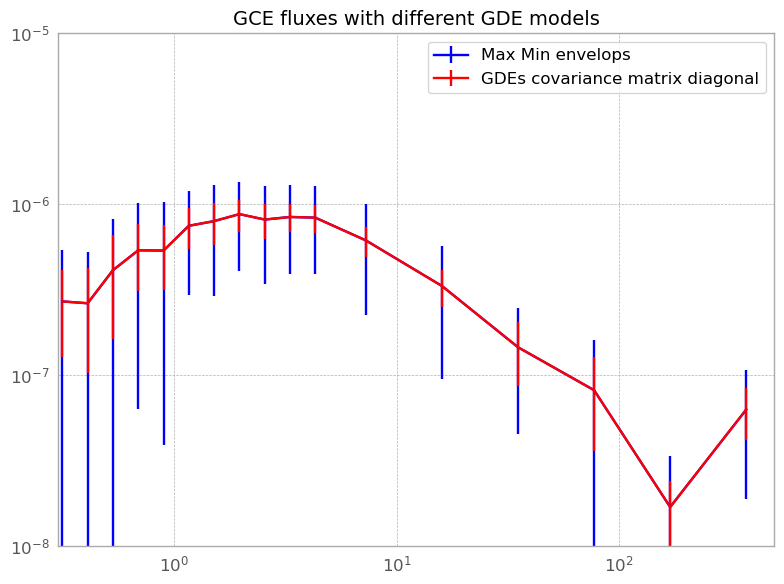

In [19]:
plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')

plt.errorbar(output[0:, 0], output[0:, 1], yerr=np.sqrt(np.diag(covariance_matrix)), label='GDEs covariance matrix diagonal', color='red')

plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.show()



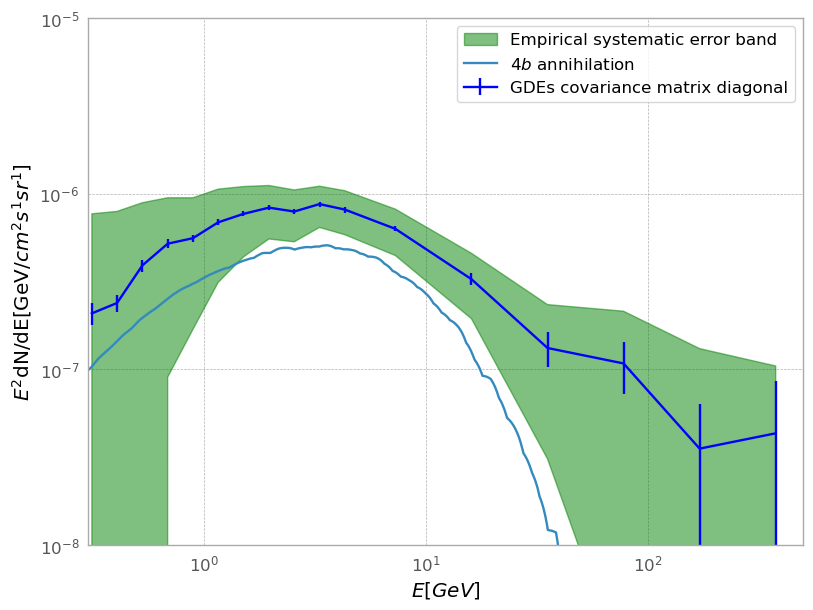

In [64]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')


cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_16yr.npy')
plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

plt.errorbar(output[0:, 0], output[0:, 1], output[0:, -1], label='GDEs covariance matrix diagonal', color='blue')

plt.plot(Interpolator(78).interpolated_table()[0], Interpolator(78).interpolated_table()[0]**2*Interpolator(110).interpolated_table()[1]*(5e-26)/78**2 *3*10**21, label=r'4$b$ annihilation')

#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()

plt.ylabel(f'$E^2$dN/dE[GeV/$cm^2 s^1 sr^1$]')
plt.xlabel(f'$E[GeV$]')

plt.show()



# Differential spectrum plotting

In [2]:
J_factor=3.5251837158376415e+21

In [3]:
# First, for front and low energy plot

In [4]:
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'
file_name = file_pattern.format('X', 'front_back')
energy_length = 17
data = np.loadtxt(file_name)

energy = data[:, 0][0:energy_length]  # Energy bins

flux = data[:, 1][0:energy_length]

stat_error = data[:, 2][0:energy_length]

stat_error_long = data[:, 2]

cov_file_pattern = './GC_analysis/covariance/approx_covariance_{}x{}_{}_model_X_16yr.npy' 


cov_file = cov_file_pattern.format(energy_length, energy_length, 'front_back')

# cov_file = './GC_analysis/covariance/approx_covariance_14x14_16yr.npy'

emph_cov = np.load(cov_file)

systematics_band_upp = flux + np.sqrt(np.diag(emph_cov))[0:energy_length] 
systematics_band_low = flux - np.sqrt(np.diag(emph_cov))[0:energy_length] 

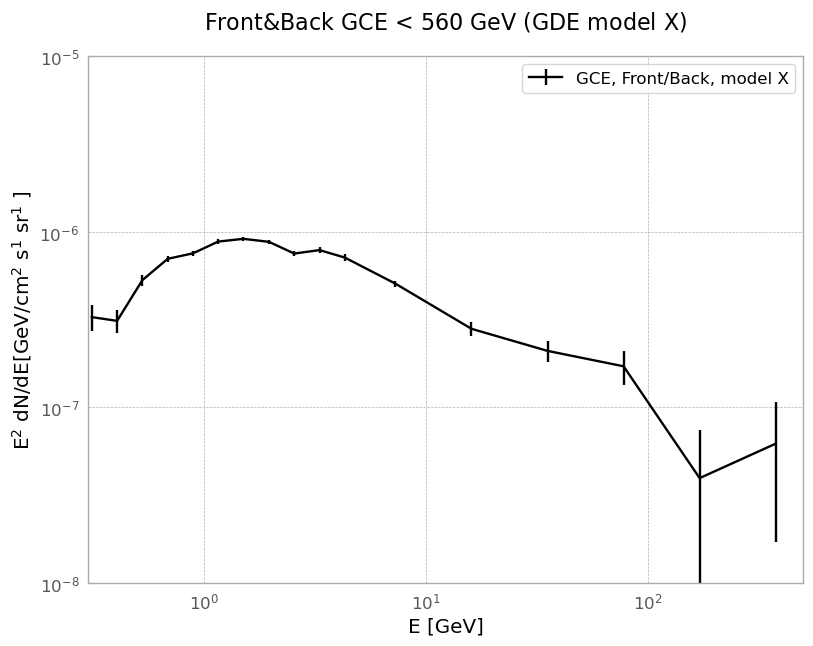

In [5]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')


# cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_front_back_16yr.npy')
# plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

# plt.errorbar(output[0:, 0], output[0:, 1], output[0:, -1], label='GDEs covariance matrix diagonal', color='blue')

plt.errorbar(energy, flux, stat_error, color='black', label= 'GCE, Front/Back, model X')
# plt.fill_between(energy, systematics_band_upp, systematics_band_low, color='green', alpha=0.3, label='Empirical systematic error band')

# plt.errorbar(dat[0:, 0], dat[0:, 1], stat_error_long)
#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')
plt.title(r'Front&Back GCE < $560$ GeV (GDE model X)', fontsize=16, pad=20)
# plt.savefig('./GC_analysis/GCE_plots/GCE_SED_Front&Back_<560_GeV_GDE_X.png', bbox_inches="tight", dpi=600)
plt.show()



NameError: name 'EnergyDM_4b' is not defined

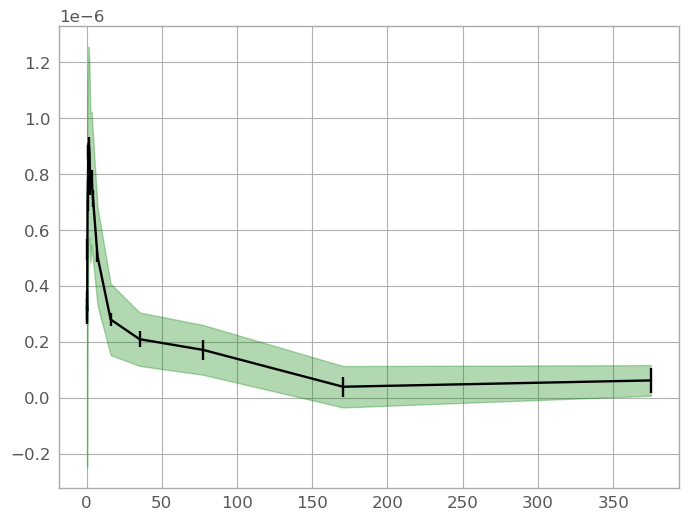

In [6]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')


# cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_front_back_16yr.npy')
# plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

# plt.errorbar(output[0:, 0], output[0:, 1], output[0:, -1], label='GDEs covariance matrix diagonal', color='blue')

plt.errorbar(energy, flux, stat_error, color='black', label= 'GCE, Front/Back, model X')
plt.fill_between(energy, systematics_band_upp, systematics_band_low, color='green', alpha=0.3, label='Empirical systematic error band')

plt.plot(EnergyDM_4b, sed_4b, color='red', label=r'$4b$, $\langle \sigma v \rangle$ = 7e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 110 GeV', linestyle='dashed')
plt.plot(EnergyDM_4tau, sed_4tau, color='blue', label=r'$4\tau$, $\langle \sigma v \rangle$ = 9e$-$27 cm$^{3}$ s $^{-1}$, $m_\chi$ = 25 GeV', linestyle='dashed')
plt.plot(EnergyDM_2b2tau, sed_2b2tau, color='purple', label=r'$2b2 \tau$, $\langle \sigma v \rangle$ = 5e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 45 GeV', linestyle='dashed')

plt.plot(EnergyDM_bb, sed_bb, color='red', label=r'$\bar{b}b$, $\langle \sigma v \rangle$ = 4e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 65 GeV', linestyle='solid')
plt.plot(EnergyDM_4tau, sed_tau, color='blue', label=r'$\tau^+ \tau^-$, $\langle \sigma v \rangle$ = 5e$-$27 cm$^{3}$ s $^{-1}$, $m_\chi$ = 18 GeV', linestyle='solid')



# plt.errorbar(dat[0:, 0], dat[0:, 1], stat_error_long)
#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-4)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')
plt.show()



In [7]:
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{}_{}_16yr_cholis.dat'
file_name = file_pattern.format('X', 'front')
energy_length = 17
data = np.loadtxt(file_name)

energy = data[:, 0][0:energy_length]  # Energy bins

flux = data[:, 1][0:energy_length]

stat_error = data[:, 2][0:energy_length]

stat_error_long = data[:, 2]

cov_file_pattern = './GC_analysis/covariance/approx_covariance_{}x{}_{}_model_X_16yr.npy' 


cov_file = cov_file_pattern.format(energy_length, energy_length, 'front')

# cov_file = './GC_analysis/covariance/approx_covariance_14x14_16yr.npy'

emph_cov = np.load(cov_file)

systematics_band_upp = flux + np.sqrt(np.diag(emph_cov))[0:energy_length] 
systematics_band_low = flux - np.sqrt(np.diag(emph_cov))[0:energy_length] 

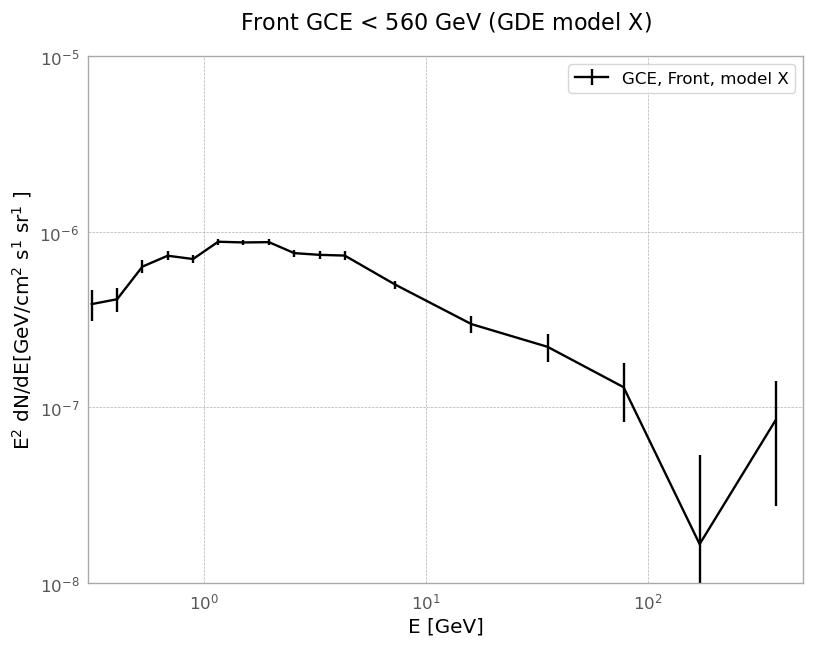

In [8]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')


# cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_front_back_16yr.npy')
# plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

# plt.errorbar(output[0:, 0], output[0:, 1], output[0:, -1], label='GDEs covariance matrix diagonal', color='blue')

plt.errorbar(energy, flux, stat_error, color='black', label= 'GCE, Front, model X')
# plt.fill_between(energy, systematics_band_upp, systematics_band_low, color='green', alpha=0.3, label='Empirical systematic error band')

# plt.errorbar(dat[0:, 0], dat[0:, 1], stat_error_long)
#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')
plt.title(r'Front GCE < $560$ GeV (GDE model X)', fontsize=16, pad=20)
# plt.savefig('./GC_analysis/GCE_plots/GCE_SED_Front_<560_GeV_GDE_X.png', bbox_inches="tight", dpi=600)
plt.show()



In [9]:
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{}_16yr.dat'
file_name = file_pattern.format('front_back')
energy_length = 17
data = np.loadtxt(file_name)

energy = data[:, 0][0:energy_length]  # Energy bins

flux = data[:, 1][0:energy_length]

stat_error = np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{"X"}_{"front_back"}_16yr_cholis.dat')[:, 2][0:energy_length]

cov_file_pattern = './GC_analysis/covariance/approx_covariance_{}x{}_{}_model_X_16yr.npy' 


cov_file = cov_file_pattern.format(energy_length, energy_length, 'front_back')

# cov_file = './GC_analysis/covariance/approx_covariance_14x14_16yr.npy'

emph_cov = np.load(cov_file)

GDE_cov_file_pattern = './GC_analysis/covariance/GDE_covariance_matrix_{}_16yr.npy'

GDE_cov_file = GDE_cov_file_pattern.format('front_back')

GDE_cov = np.load(GDE_cov_file)

diagonal_cov = np.diag(emph_cov + GDE_cov)

systematic_uncer = np.sqrt(diagonal_cov)

systematics_band_upp = flux + systematic_uncer[0:energy_length] 
systematics_band_low = flux - systematic_uncer[0:energy_length] 

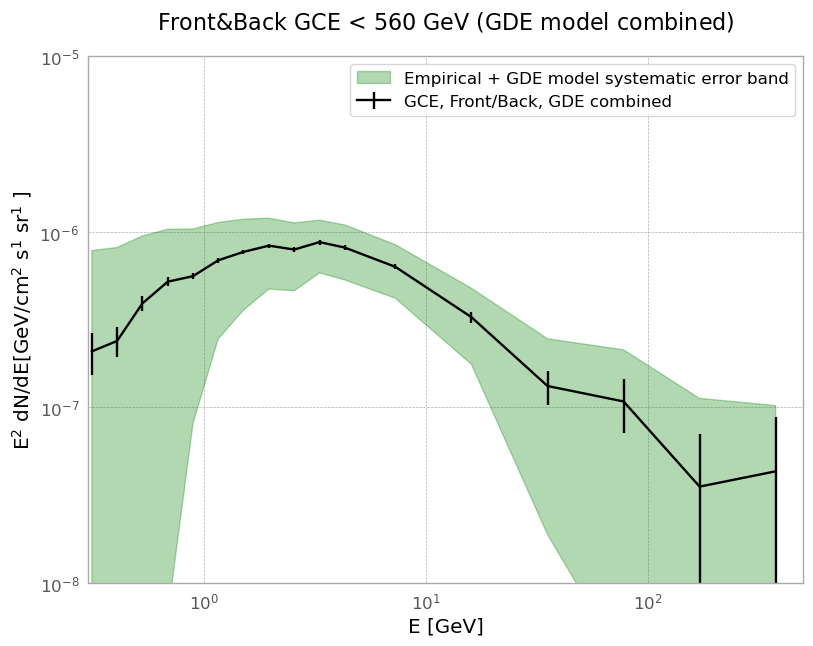

In [10]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')


# cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_front_back_16yr.npy')
# plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

# plt.errorbar(output[0:, 0], output[0:, 1], output[0:, -1], label='GDEs covariance matrix diagonal', color='blue')

plt.errorbar(energy, flux, stat_error, color='black', label= 'GCE, Front/Back, GDE combined')
plt.fill_between(energy, systematics_band_upp, systematics_band_low, color='green', alpha=0.3, label='Empirical + GDE model systematic error band')

# plt.errorbar(dat[0:, 0], dat[0:, 1], stat_error_long)
#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')
plt.title(r'Front&Back GCE < $560$ GeV (GDE model combined)', fontsize=16, pad=20)
# plt.savefig('./GC_analysis/GCE_plots/GCE_SED_Front&Back_<560_GeV_GDE_combined.png', bbox_inches="tight", dpi=600)
plt.show()



In [114]:
J_factor=3.5251837158376415e+21 #Check needed
sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree

EnergyDM_4b, fluxDM_4b = Interpolator(110, 'effective_4b').interpolated_table()
sed_4b = EnergyDM_4b**2*fluxDM_4b*(7e-26)/(110**2)*J_factor/(sr)

EnergyDM_bb, fluxDM_bb = prompt_dat=exctractcirellitable(65, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
sed_bb = EnergyDM_bb**2*fluxDM_bb*(4e-26)/(65**2)*J_factor/(sr)


EnergyDM_4tau, fluxDM_4tau = Interpolator(25, 'effective_4tau').interpolated_table()
sed_4tau = EnergyDM_4tau**2*fluxDM_4tau*(9e-27)/(25**2)*J_factor/(sr)

EnergyDM_tau, fluxDM_tau = prompt_dat=exctractcirellitable(18, 10, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
sed_tau = EnergyDM_tau**2*fluxDM_tau*(5e-27)/(18**2)*J_factor/(sr)
sed_tau_interp = interp1d(EnergyDM_tau, sed_tau, fill_value=0., bounds_error=False)
sed_tau = sed_tau_interp(EnergyDM_4tau)

EnergyDM_2b2tau, fluxDM_2b2tau = Interpolator(45, 'effective_2b2tau').interpolated_table()
sed_2b2tau = EnergyDM_2b2tau**2*fluxDM_2b2tau*(5e-26)/(45**2)*J_factor/(sr)

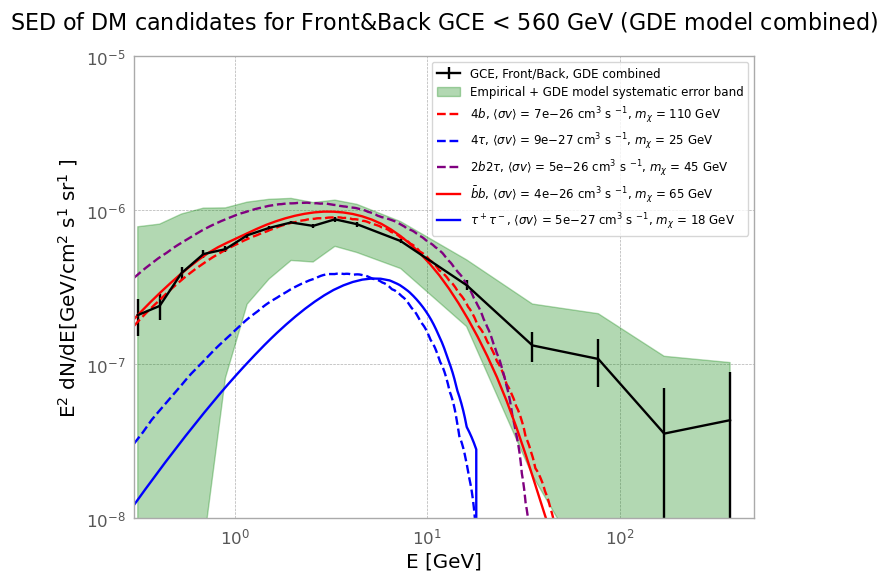

In [140]:
plt.errorbar(energy, flux, stat_error, color='black', label= 'GCE, Front/Back, GDE combined')
plt.fill_between(energy, systematics_band_upp, systematics_band_low, color='green', alpha=0.3, label='Empirical + GDE model systematic error band')




plt.plot(EnergyDM_4b, sed_4b, color='red', label=r'$4b$, $\langle \sigma v \rangle$ = 7e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 110 GeV', linestyle='dashed')
plt.plot(EnergyDM_4tau, sed_4tau, color='blue', label=r'$4\tau$, $\langle \sigma v \rangle$ = 9e$-$27 cm$^{3}$ s $^{-1}$, $m_\chi$ = 25 GeV', linestyle='dashed')
plt.plot(EnergyDM_2b2tau, sed_2b2tau, color='purple', label=r'$2b2 \tau$, $\langle \sigma v \rangle$ = 5e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 45 GeV', linestyle='dashed')
plt.plot(EnergyDM_bb, sed_bb, color='red', label=r'$\bar{b}b$, $\langle \sigma v \rangle$ = 4e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 65 GeV', linestyle='solid')
plt.plot(EnergyDM_4tau, sed_tau, color='blue', label=r'$\tau^+ \tau^-$, $\langle \sigma v \rangle$ = 5e$-$27 cm$^{3}$ s $^{-1}$, $m_\chi$ = 18 GeV', linestyle='solid')

plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
# plt.tight_layout()

ax = plt.gca()                              # 현재 Axes
handles, labels = ax.get_legend_handles_labels()

# errorbar 라벨이 들어 있는 인덱스를 찾는다
idx_err = labels.index('GCE, Front/Back, GDE combined')

# errorbar 를 맨 앞으로 보내고 나머지는 그대로 유지
handles = [handles[idx_err]] + handles[:idx_err] + handles[idx_err+1:]
labels  = [labels[idx_err]]  + labels[:idx_err]  + labels[idx_err+1:]

ax.legend(handles, labels, fontsize=8.5)     # ← 이제 errorbar 가 맨 위!

# plt.legend(fontsize=10)
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')
plt.title(r'SED of DM candidates for Front&Back GCE < $560$ GeV (GDE model combined)', fontsize=16, pad=20)
plt.savefig('./GC_analysis/GCE_plots/GCE_DM_SED_Front_Back_<560_GeV_GDE_combined.png', bbox_inches="tight", dpi=600)
plt.show()



In [200]:
file_pattern = '/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{}_16yr.dat'
file_name = file_pattern.format('front')
energy_length = 17
data = np.loadtxt(file_name)

energy = data[:, 0][0:energy_length]  # Energy bins

flux = data[:, 1][0:energy_length]

stat_error = np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{"X"}_{"front"}_16yr_cholis.dat')[:, 2][0:energy_length]

cov_file_pattern = './GC_analysis/covariance/approx_covariance_{}x{}_{}_model_X_16yr.npy' 


cov_file = cov_file_pattern.format(energy_length, energy_length, 'front_back')

# cov_file = './GC_analysis/covariance/approx_covariance_14x14_16yr.npy'

emph_cov = np.load(cov_file)

GDE_cov_file_pattern = './GC_analysis/covariance/GDE_covariance_matrix_{}_16yr.npy'

GDE_cov_file = GDE_cov_file_pattern.format('front')

GDE_cov = np.load(GDE_cov_file)

diagonal_cov = np.diag(emph_cov + GDE_cov)

systematic_uncer = np.sqrt(diagonal_cov)

systematics_band_upp = flux + systematic_uncer[0:energy_length] 
systematics_band_low = flux - systematic_uncer[0:energy_length] 

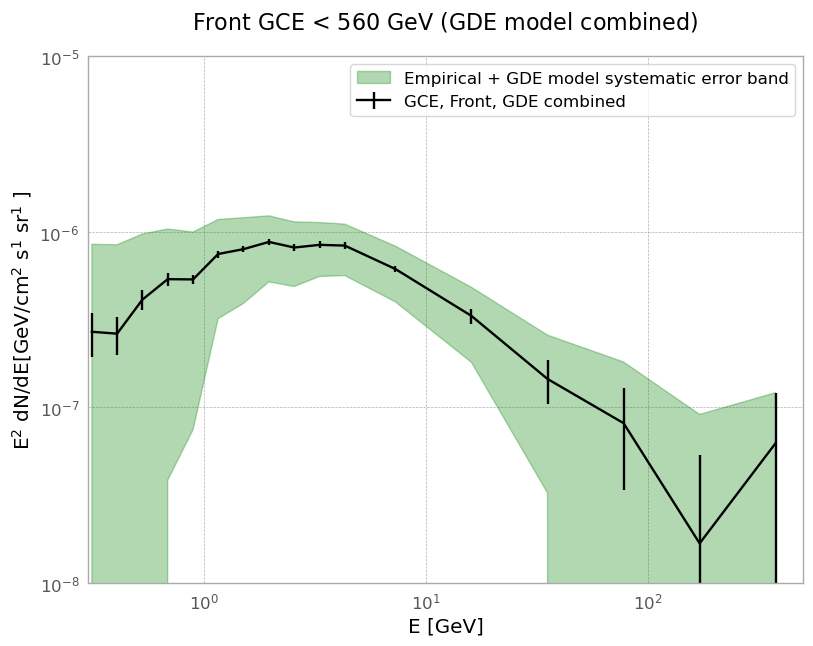

In [201]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')


# cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_front_back_16yr.npy')
# plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

# plt.errorbar(output[0:, 0], output[0:, 1], output[0:, -1], label='GDEs covariance matrix diagonal', color='blue')

plt.errorbar(energy, flux, stat_error, color='black', label= 'GCE, Front, GDE combined')
plt.fill_between(energy, systematics_band_upp, systematics_band_low, color='green', alpha=0.3, label='Empirical + GDE model systematic error band')

# plt.errorbar(dat[0:, 0], dat[0:, 1], stat_error_long)
#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')
plt.title(r'Front GCE < $560$ GeV (GDE model combined)', fontsize=16, pad=20)
plt.savefig('./GC_analysis/GCE_plots/GCE_SED_Front_<560_GeV_GDE_combined.png', bbox_inches="tight", dpi=600)
plt.show()



In [154]:
J_factor=3.5251837158376415e+21 #Check needed
sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree

EnergyDM_4b, fluxDM_4b = Interpolator(105, 'effective_4b').interpolated_table()
sed_4b = EnergyDM_4b**2*fluxDM_4b*(5e-26)/(105**2)*J_factor/(sr)

EnergyDM_bb, fluxDM_bb = prompt_dat=exctractcirellitable(57.5, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
sed_bb = EnergyDM_bb**2*fluxDM_bb*(3e-26)/(57.5**2)*J_factor/(sr)


EnergyDM_4tau, fluxDM_4tau = Interpolator(21, 'effective_4tau').interpolated_table()
sed_4tau = EnergyDM_4tau**2*fluxDM_4tau*(7e-27)/(21**2)*J_factor/(sr)

EnergyDM_tau, fluxDM_tau = prompt_dat=exctractcirellitable(11, 10, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
sed_tau = EnergyDM_tau**2*fluxDM_tau*(4e-27)/(11**2)*J_factor/(sr)
sed_tau_interp = interp1d(EnergyDM_tau, sed_tau, fill_value=0., bounds_error=False)
sed_tau = sed_tau_interp(EnergyDM_4tau)

EnergyDM_2b2tau, fluxDM_2b2tau = Interpolator(42, 'effective_2b2tau').interpolated_table()
sed_2b2tau = EnergyDM_2b2tau**2*fluxDM_2b2tau*(3e-26)/(42**2)*J_factor/(sr)

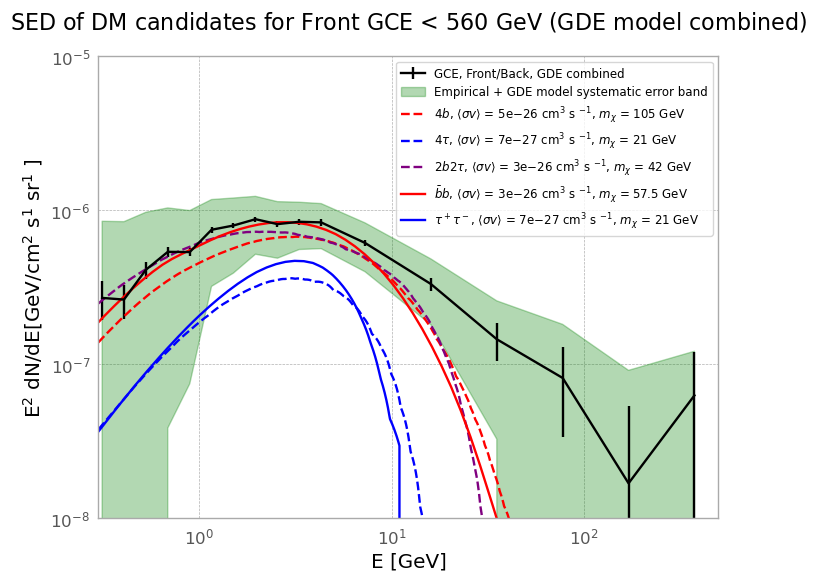

In [155]:
plt.errorbar(energy, flux, stat_error, color='black', label= 'GCE, Front/Back, GDE combined')
plt.fill_between(energy, systematics_band_upp, systematics_band_low, color='green', alpha=0.3, label='Empirical + GDE model systematic error band')




plt.plot(EnergyDM_4b, sed_4b, color='red', label=r'$4b$, $\langle \sigma v \rangle$ = 5e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 105 GeV', linestyle='dashed')
plt.plot(EnergyDM_4tau, sed_4tau, color='blue', label=r'$4\tau$, $\langle \sigma v \rangle$ = 7e$-$27 cm$^{3}$ s $^{-1}$, $m_\chi$ = 21 GeV', linestyle='dashed')
plt.plot(EnergyDM_2b2tau, sed_2b2tau, color='purple', label=r'$2b2 \tau$, $\langle \sigma v \rangle$ = 3e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 42 GeV', linestyle='dashed')
plt.plot(EnergyDM_bb, sed_bb, color='red', label=r'$\bar{b}b$, $\langle \sigma v \rangle$ = 3e$-$26 cm$^{3}$ s $^{-1}$, $m_\chi$ = 57.5 GeV', linestyle='solid')
plt.plot(EnergyDM_4tau, sed_tau, color='blue', label=r'$\tau^+ \tau^-$, $\langle \sigma v \rangle$ = 7e$-$27 cm$^{3}$ s $^{-1}$, $m_\chi$ = 21 GeV', linestyle='solid')

plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
# plt.tight_layout()

ax = plt.gca()                              # 현재 Axes
handles, labels = ax.get_legend_handles_labels()

# errorbar 라벨이 들어 있는 인덱스를 찾는다
idx_err = labels.index('GCE, Front/Back, GDE combined')

# errorbar 를 맨 앞으로 보내고 나머지는 그대로 유지
handles = [handles[idx_err]] + handles[:idx_err] + handles[idx_err+1:]
labels  = [labels[idx_err]]  + labels[:idx_err]  + labels[idx_err+1:]

ax.legend(handles, labels, fontsize=8.5)     # ← 이제 errorbar 가 맨 위!

# plt.legend(fontsize=10)
plt.ylabel(f'E$^2$ dN/dE[GeV/cm$^2$ s$^1$ sr$^1$ ]')
plt.xlabel(f'E [GeV]')
plt.title(r'SED of DM candidates for Front GCE < $560$ GeV (GDE model combined)', fontsize=16, pad=20)
plt.savefig('./GC_analysis/GCE_plots/GCE_DM_SED_Front_<560_GeV_GDE_combined.png', bbox_inches="tight", dpi=600)
plt.show()



## 2D fitting

In [3]:
front='front_back'
energy_bin_length='17' #'17'

In [18]:
for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
    print(front, energy_bin_length)

front_back 17
front 14


front_back 17


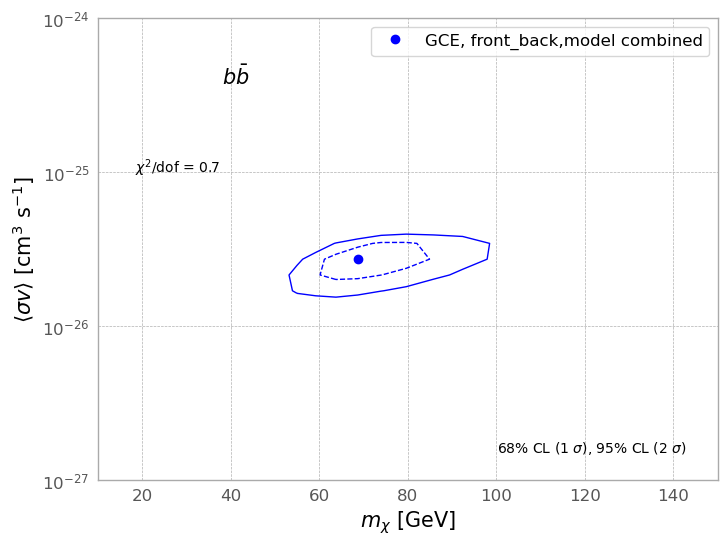

front_back 14


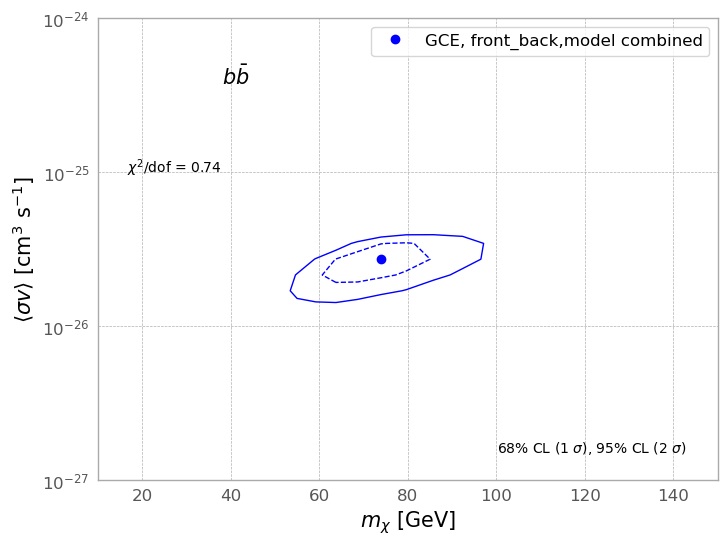

front 17


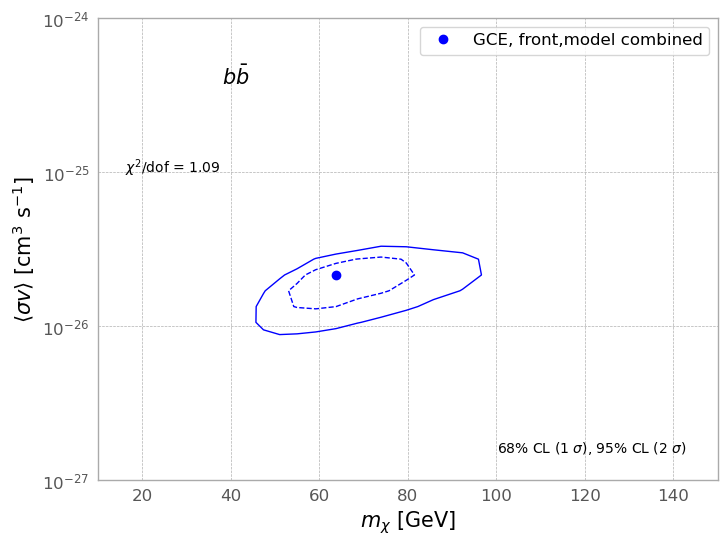

front 14


KeyboardInterrupt: 

In [140]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]
            #d_u = (g[0:, 4] - g[0:, 1])#[0:14]
            #d_l = (g[0:, 1] - g[0:, 3])#[0:14]
            
         
            #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
            #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
            # prompt_dat = Interpolator(dm_mass).interpolated_table()
            prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
            #prompt_dat = Interpolator(dm_mass).interpolated_table()
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value='extrapolate', bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
            #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='cubic')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
            #data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            
            #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)
        
            #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
            #for i in range(0, len(emeans), 1):
                #GCE_data_err[i] = np.max([d_u[i], d_l[i]])
            #data = data[0:bin_length]
            #GCE_data = GCE_data[0:bin_length]
            
            #cov=(np.diag(GCE_data_err[0:17])**2 + np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy"))
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-27, -23, 40)
        
        mass_vec = np.logspace(np.log10(10), np.log10(180), 40)
        #mass_vec = np.logspace(np.log10(0.1), np.log10(60), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        dof = int(energy_bin_length) - 2

        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        
        
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
        #ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')
        
        
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, {front},model combined')
        
        
        plt.yscale('log')
        plt.xscale('linear')
        
        plt.xlim(10, 150)
        plt.ylim(1e-27, 1e-24)
    
        plt.xlim(10, 150)
        plt.ylim(1e-27, 1e-24)
        
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
    
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        # plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_bb_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
        


front_back 17


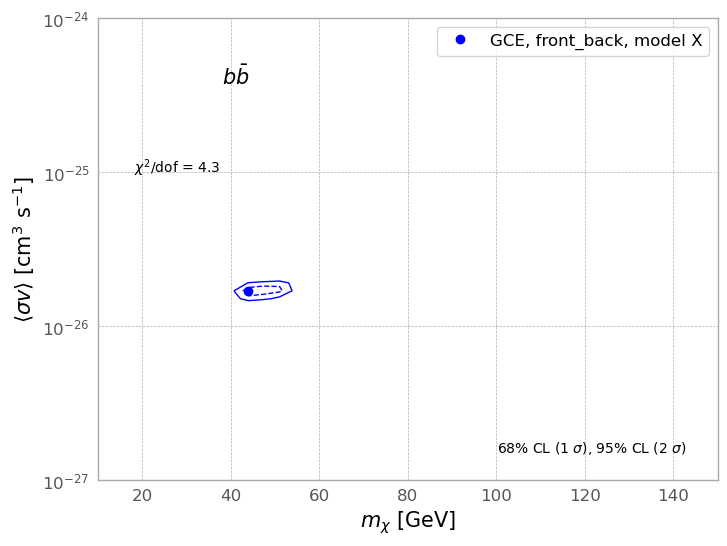

front_back 14


KeyboardInterrupt: 

In [139]:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
channel ='bb'
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
        print(front, energy_bin_length)
        for model in ['X']:#, 'I', 'XLIX']: 
            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
                # systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
                # systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                
                #d_u = (g[0:, 4] - g[0:, 1])#[0:14]
                #d_l = (g[0:, 1] - g[0:, 3])#[0:14]
                
             
                #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
                #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
                #prompt_dat = Interpolator(dm_mass).interpolated_table()
                prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
                #prompt_dat = Interpolator(dm_mass).interpolated_table()
                # prompt_dat = Interpolator(dm_mass).interpolated_table()
    
                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value='extrapolate', bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
                #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='cubic')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
            
                #data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)
            
                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                
                #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)
            
                #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
                #for i in range(0, len(emeans), 1):E_
                    #GCE_data_err[i] = np.max([d_u[i], d_l[i]])
                #data = data[0:bin_length]
                #GCE_data = GCE_data[0:bin_length]
                
                #cov=(np.diag(GCE_data_err[0:17])**2 + np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy"))
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy") )
                #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
     
            sigmav_vec=np.logspace(-27, -25, 40)
        
            mass_vec = np.logspace(np.log10(10), np.log10(180), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)

            dof = int(energy_bin_length) - 2
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            #plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, {front}, model X')
    
            
            plt.yscale('log')
            plt.xscale('linear')
            plt.xlim(10, 150)
            plt.ylim(1e-27, 1e-24)
        
            
            # plt.xlim(0.1, 30)
            # plt.ylim(1e-28, 1e-24)
            # if channel == '4b':
            #     plt.xlim(30, 150)
            #     plt.ylim(1e-27, 1e-24)
        
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, f'{channel}', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
            ulm = np.loadtxt('./Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')
            # import matplotlib.pyplot as plt
            # import pandas as pd
            
            # solid_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
            # solid_line_x = solid_line_data['x']
            # solid_line_y = solid_line_data['y']*(10**-26)
            
            # dashed_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
            # dashed_line_x = dashed_line_data['x']
            # dashed_line_y = dashed_line_data['y']*(10**-26)
            
            # point_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
            # point_x = point_data['x']
            # point_y = point_data['y']*(10**-26)
            
            # rectangle_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
            # rectangle_x = rectangle_data['x']
            # rectangle_y = rectangle_data['y']
            
            # point2_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
            # point2_x = point2_data['x']
            # point2_y = point2_data['y']
            
            # errorbar_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
            # error_x = errorbar_data['x']
            # error_y = errorbar_data['y']
            # error_yerr = errorbar_data['yerr']
            
            # plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black')
            # plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black')
            # plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)
            
            #plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
            #plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')
            #plt.figure(figsize=(20, 20))
            
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()
    
            # plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E__{channel}_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            #plt.title("DM interpretation of GCE for model I", fontsize=13)
            
                
                
                


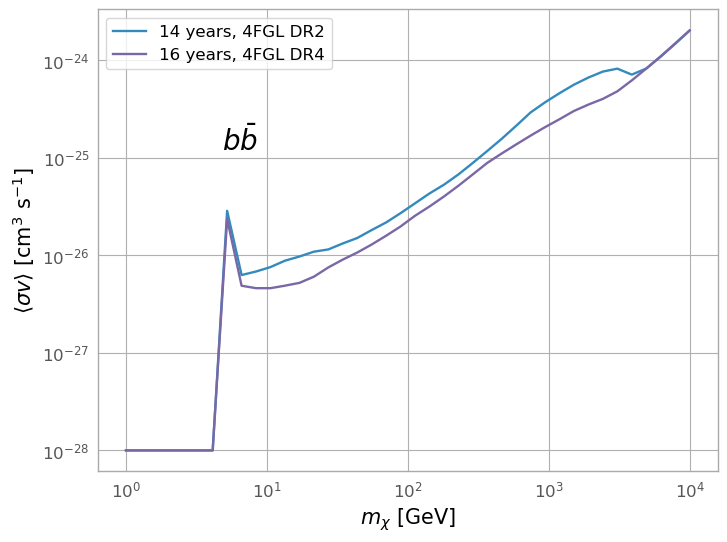

In [165]:
ulm_14 = np.loadtxt('./Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
ulm_16 = np.loadtxt('./Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
plt.text(0.2, 0.75, r'$b \bar{b}$', fontsize=20, color='black',
         verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        
plt.loglog(ulm_14[0:, 0], ulm_14[0:, 1], label='14 years, 4FGL DR2')
plt.loglog(ulm_16[0:, 0], ulm_16[0:, 1], label='16 years, 4FGL DR4')
plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
plt.legend()
plt.savefig('./Fermipy_dSphs/DM_limit/14_16_comparison_bb.png')

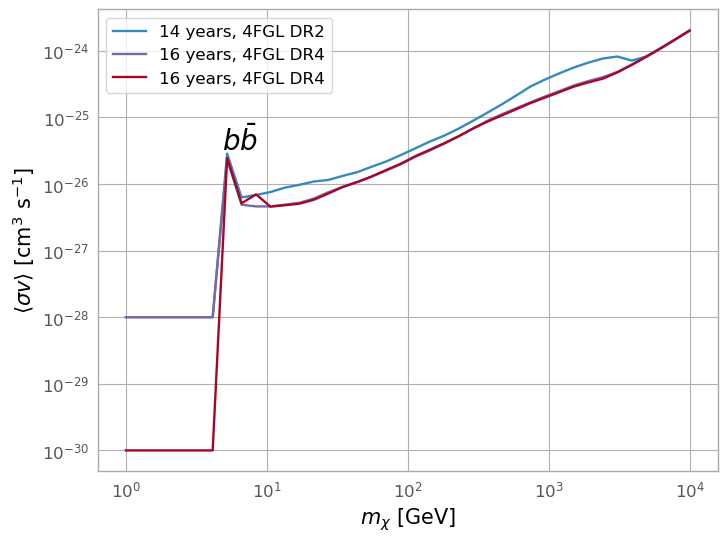

In [167]:
ulm_14 = np.loadtxt('./Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
ulm_16 = np.loadtxt('./Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
ulm = np.loadtxt('./Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs_test.txt')
plt.text(0.2, 0.75, r'$b \bar{b}$', fontsize=20, color='black',
         verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        
plt.loglog(ulm_14[0:, 0], ulm_14[0:, 1], label='14 years, 4FGL DR2')
plt.loglog(ulm_16[0:, 0], ulm_16[0:, 1], label='16 years, 4FGL DR4')
plt.loglog(ulm[0:, 0], ulm[0:, 1], label='16 years, 4FGL DR4')

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
plt.legend()
plt.savefig('./Fermipy_dSphs/DM_limit/14_16_comparison_bb.png')

(20, 15848.931924611143)

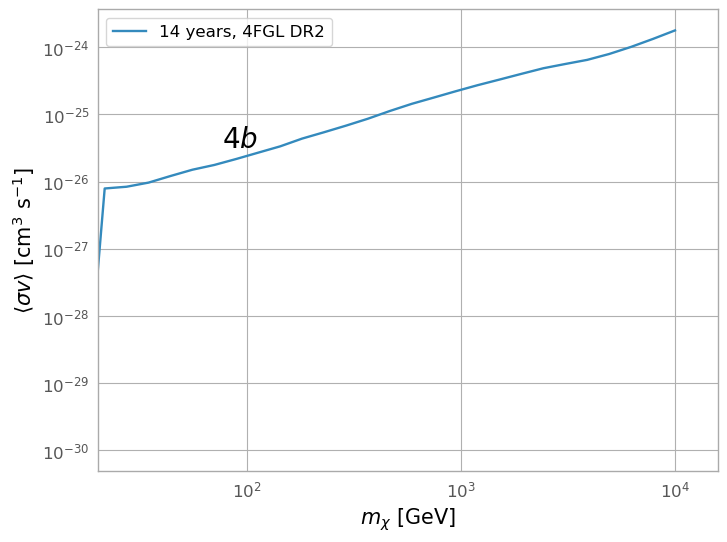

In [169]:
ulm_14 = np.loadtxt('./Fermipy_dSphs/DM_limit/bbbb_16yr_30_dSphs.txt')
plt.text(0.2, 0.75, r'$4b$', fontsize=20, color='black',
         verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        
plt.loglog(ulm_14[0:, 0], ulm_14[0:, 1], label='14 years, 4FGL DR2')
# plt.loglog(ulm_16[0:, 0], ulm_16[0:, 1], label='16 years, 4FGL DR4')
plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
# plt.xscale('linear')
plt.legend()
plt.xlim(20, None)
# plt.savefig('./Fermipy_dSphs/DM_limit/14_16_comparison_bb.png')

# 4b

front_back 17


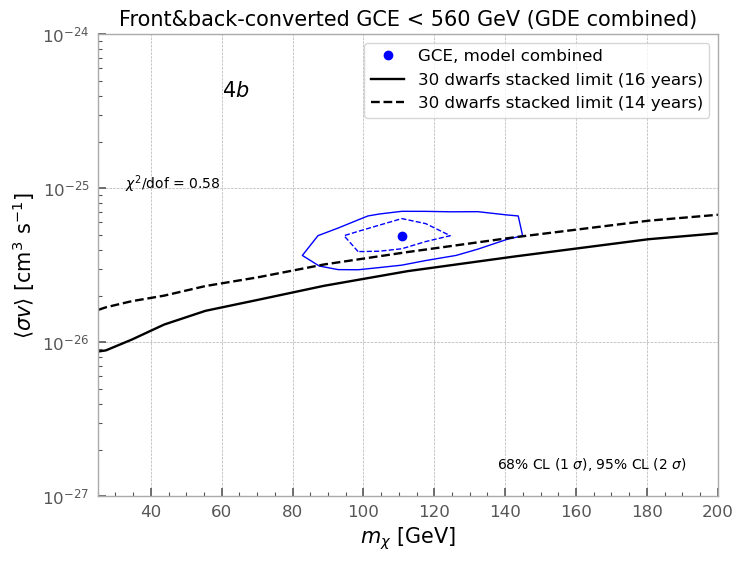

front_back 14


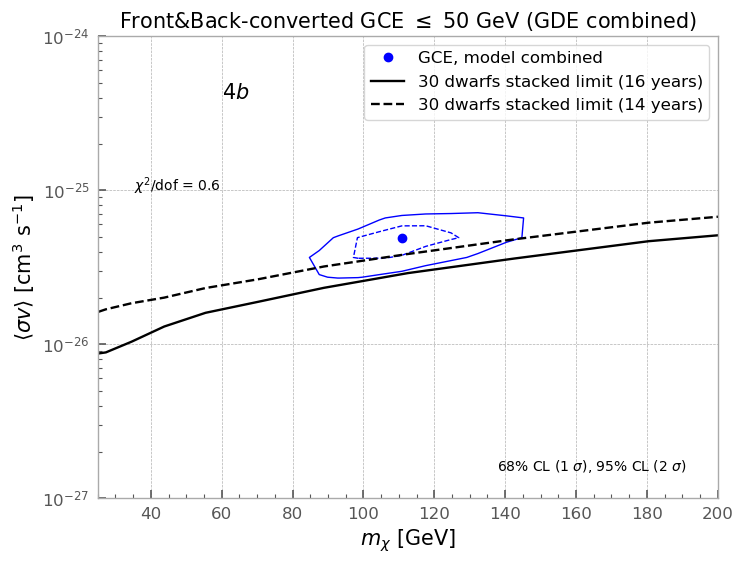

front 17


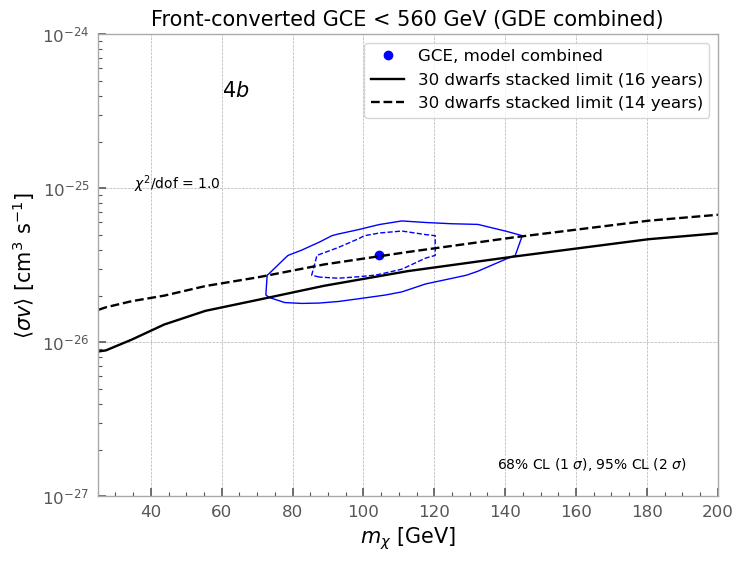

front 14


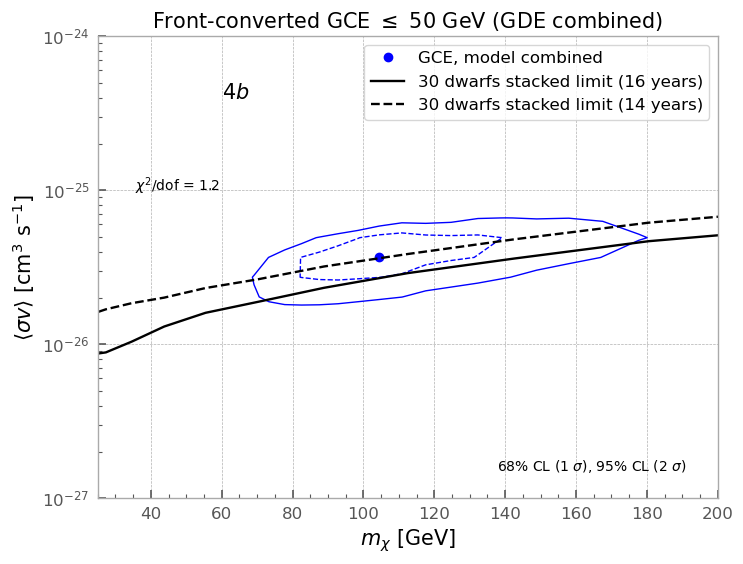

In [6]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            prompt_dat = Interpolator(dm_mass, 'effective_4b').interpolated_table()

            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(20), np.log10(200), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
        
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        
        plt.yscale('log')
        plt.xscale('linear')
        # -----------------------------
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
        # ---------------------------
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bbbb_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bbbb_14yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.xlim(25, 200)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)

        plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
    
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.legend()
         
        # plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_4b_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


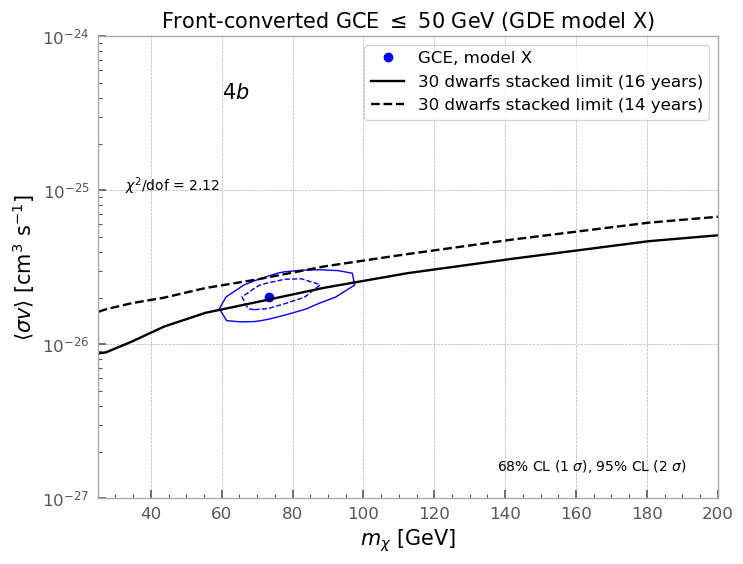

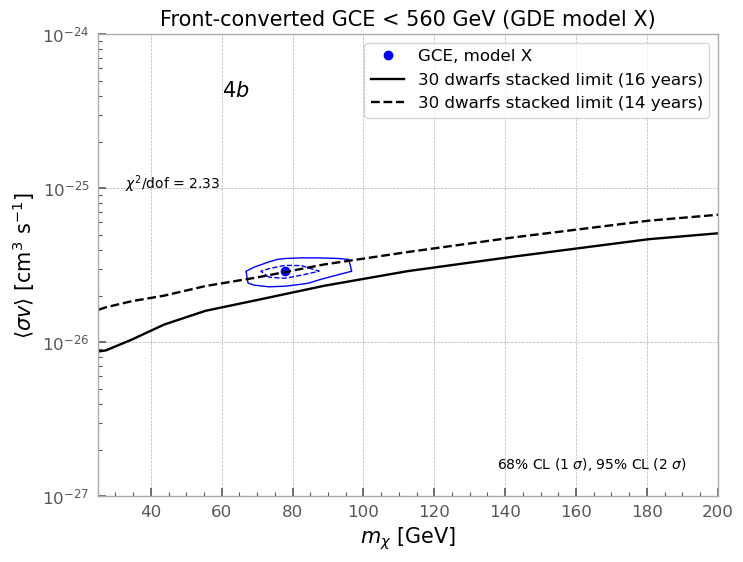

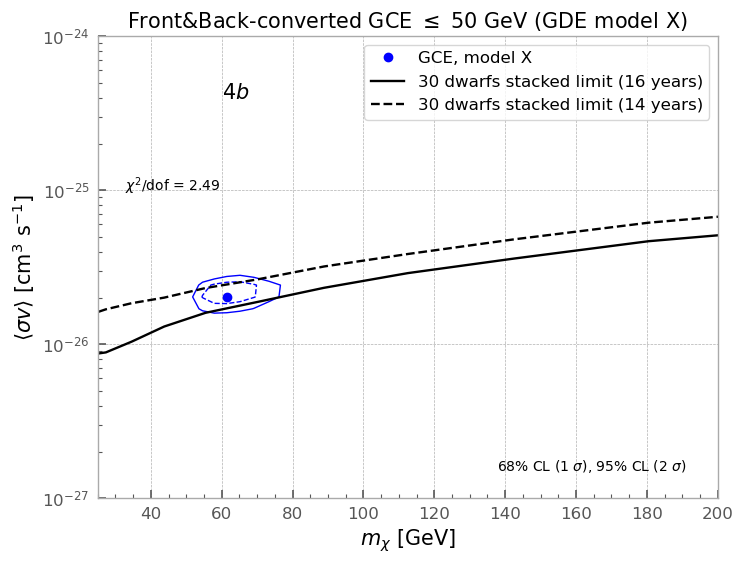

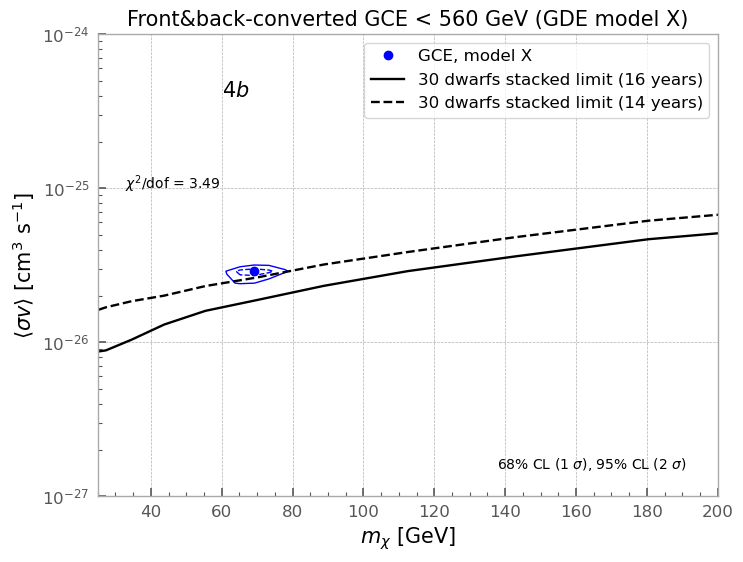

In [157]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                prompt_dat = Interpolator(dm_mass, 'effective_4b').interpolated_table()

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -25, 40)
        
            mass_vec = np.logspace(np.log10(20), np.log10(200), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bbbb_16yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bbbb_14yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
 
            
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.legend()
            plt.xlim(25, 200)
            plt.ylim(1e-27, 1e-24)
            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_4b_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

# 2b 2tau

front_back 17


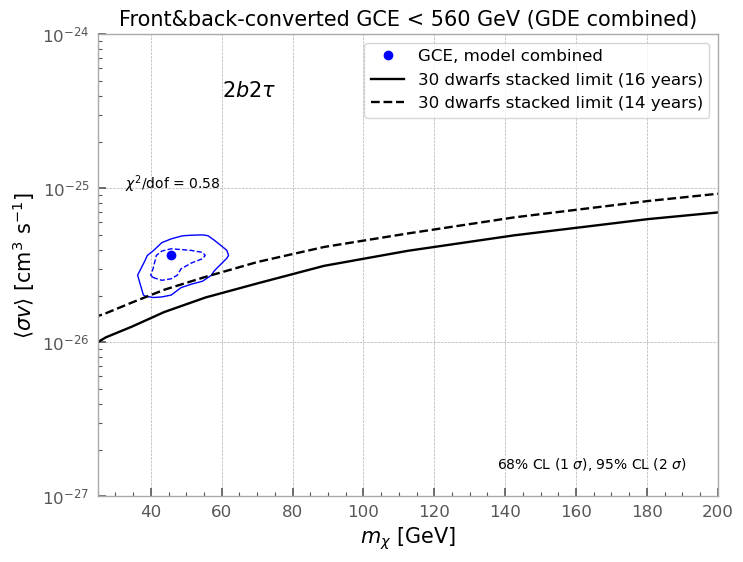

front_back 14


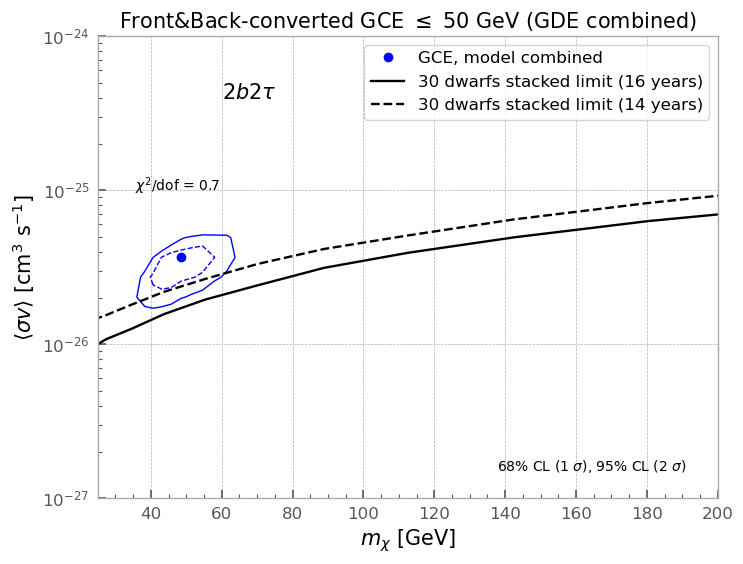

front 17


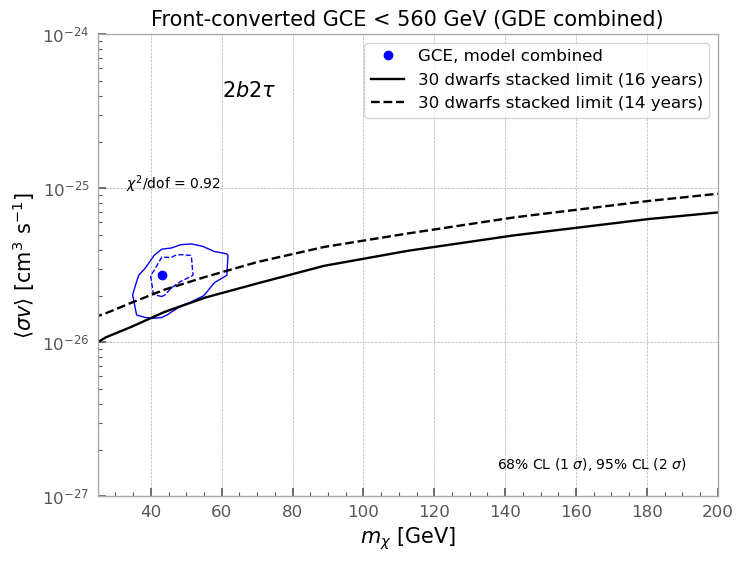

front 14


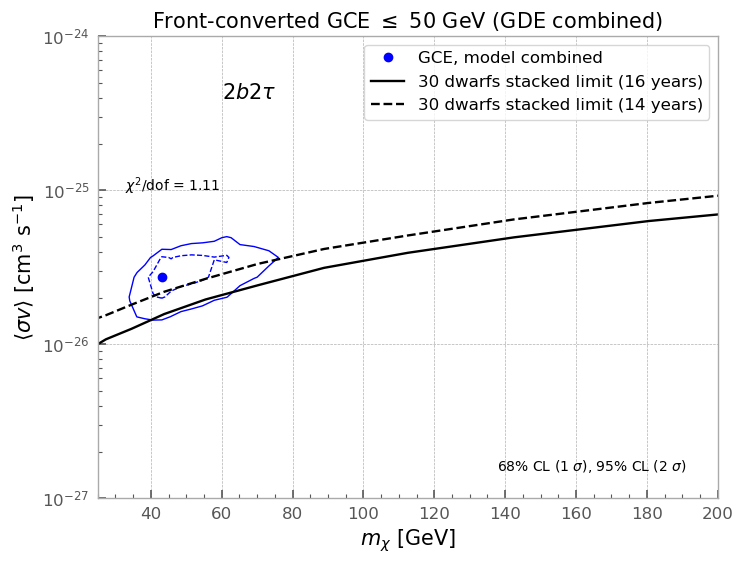

In [158]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            prompt_dat = Interpolator(dm_mass, 'effective_2b2tau').interpolated_table()

            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(20), np.log10(200), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
        
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/2b2tau_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/2b2tau_14yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        
    
        plt.xlim(25, 200)
        plt.ylim(1e-27, 1e-24)
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$2b2\tau$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15) 
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_2b2tau_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


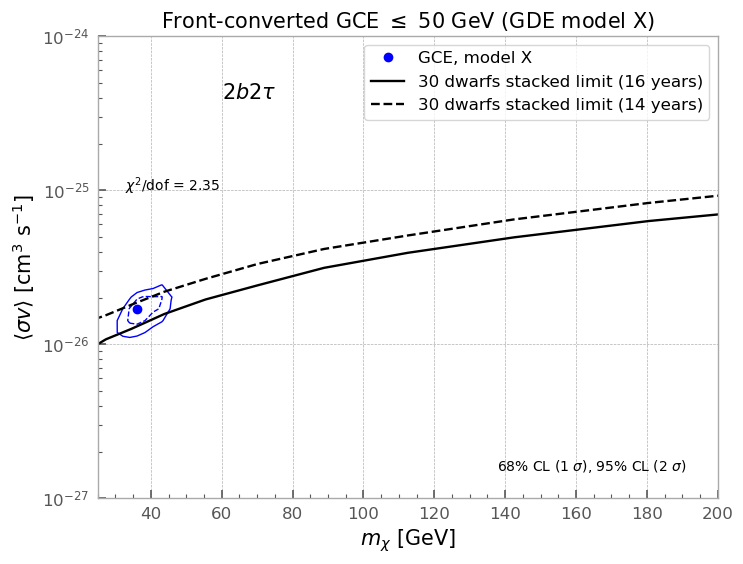

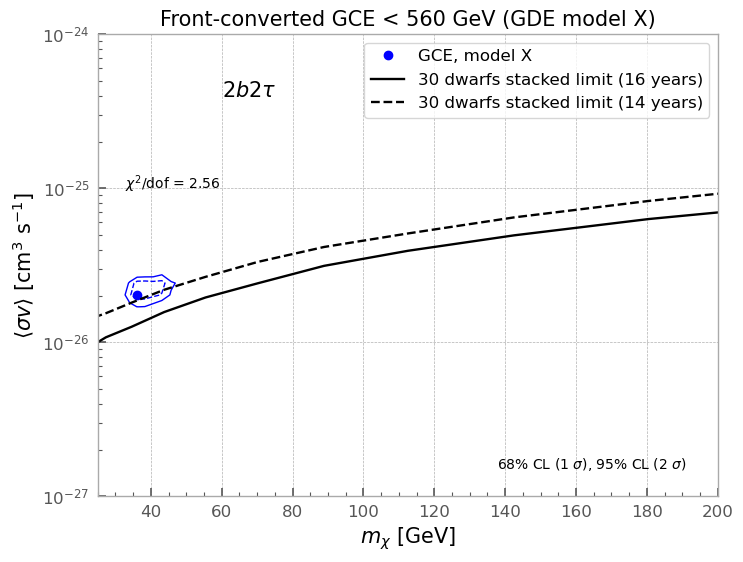

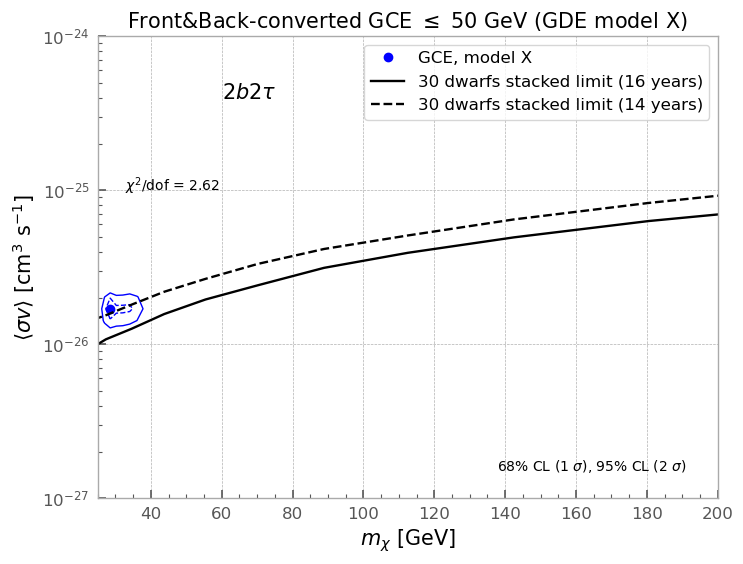

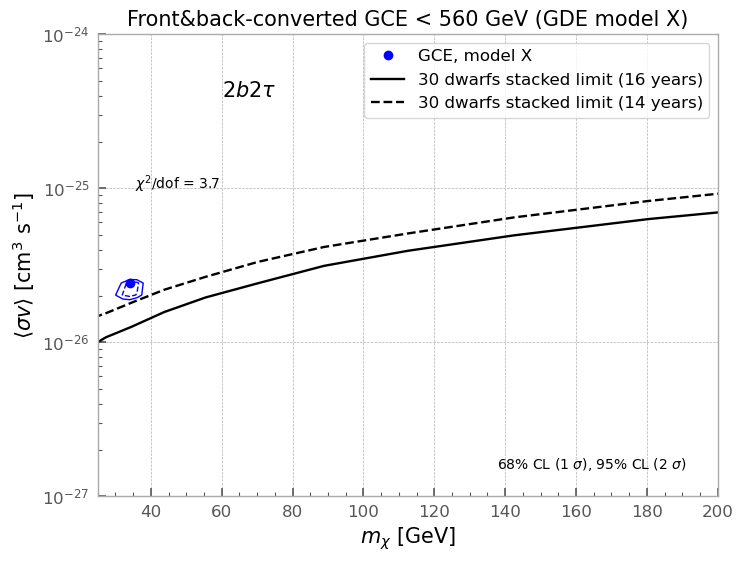

In [159]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                prompt_dat = Interpolator(dm_mass, 'effective_2b2tau').interpolated_table()

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -25, 40)
        
            mass_vec = np.logspace(np.log10(20), np.log10(200), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$2b2\tau$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/2b2tau_16yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/2b2tau_14yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()
            plt.xlim(25, 200)
            plt.ylim(1e-27, 1e-24)
            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_2b2tau_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

# 4 tau

front_back 17


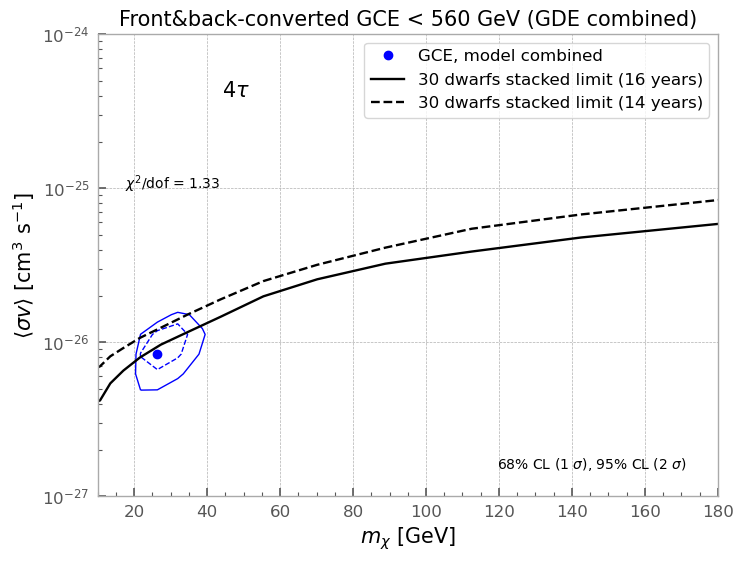

front_back 14


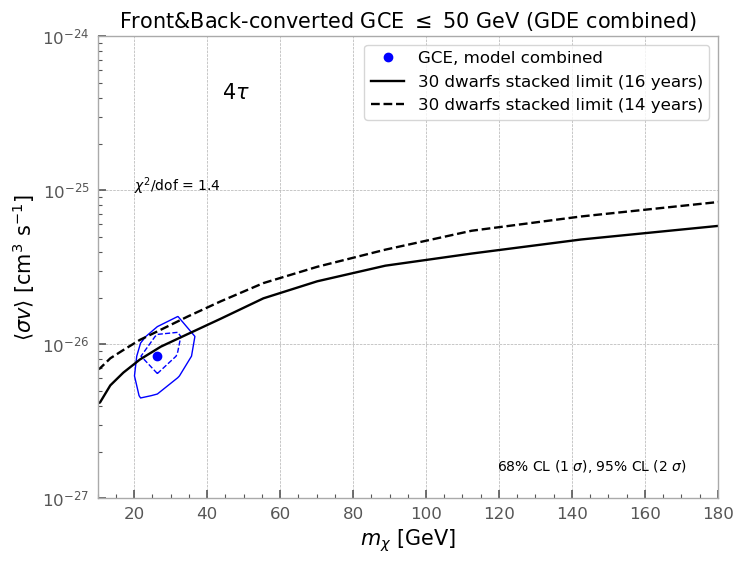

front 17


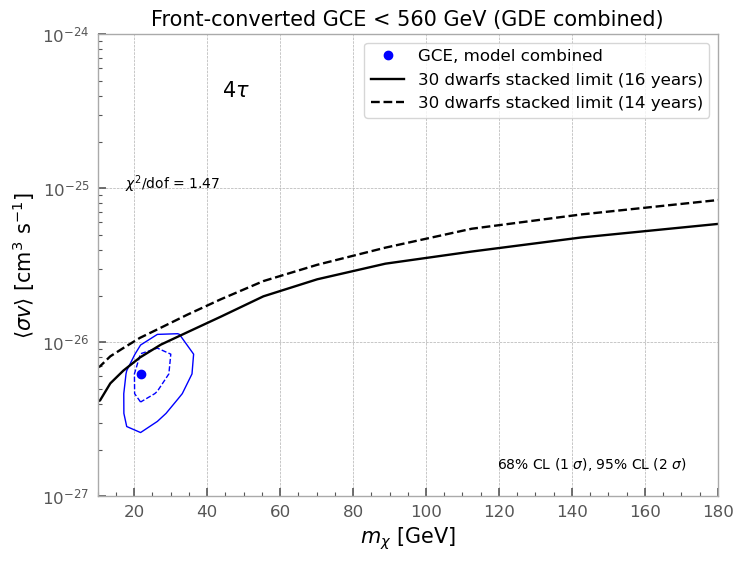

front 14


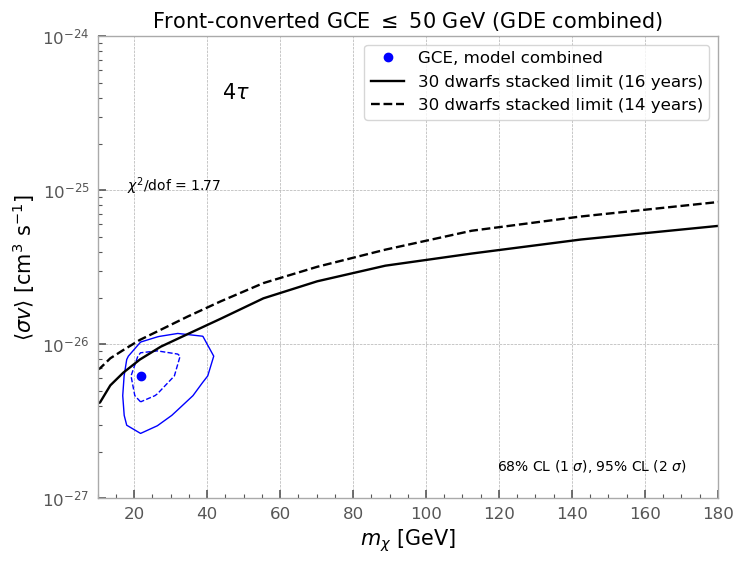

In [160]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()

            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(0.1), np.log10(180), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
       
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/4tau_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/4tau_14yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        
    
        plt.xlim(10, 180)
        plt.ylim(1e-27, 1e-24)
        
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$4\tau$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_4tau_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


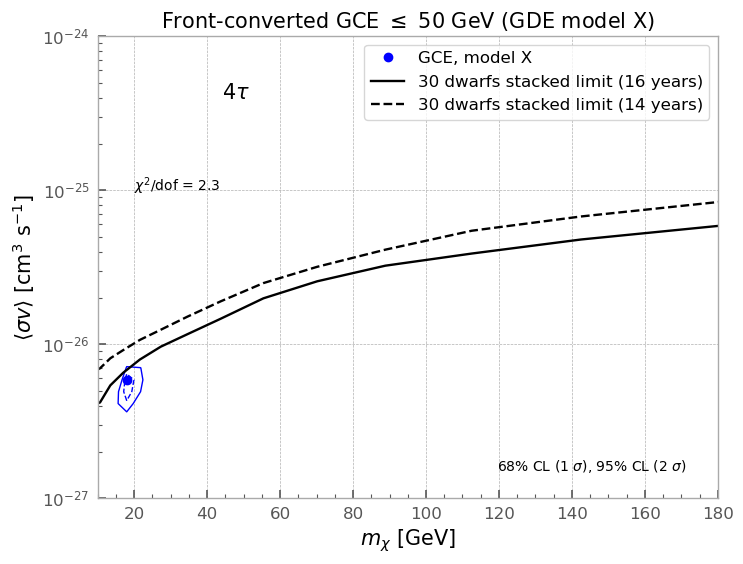

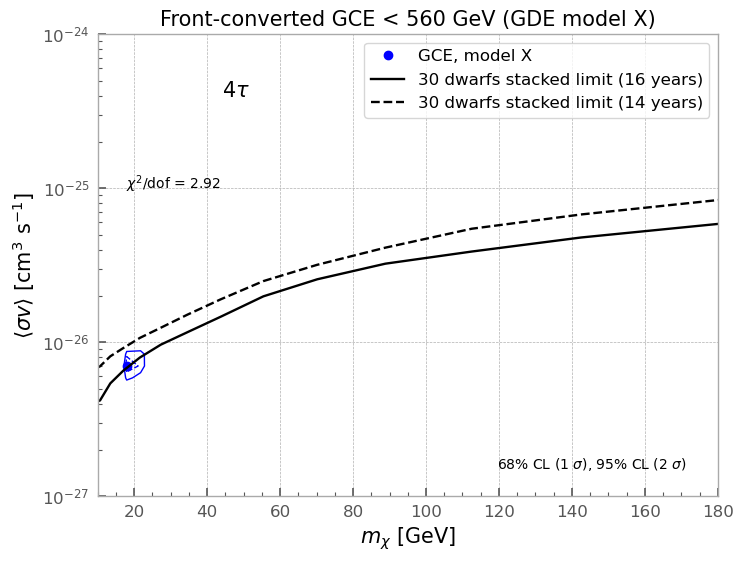

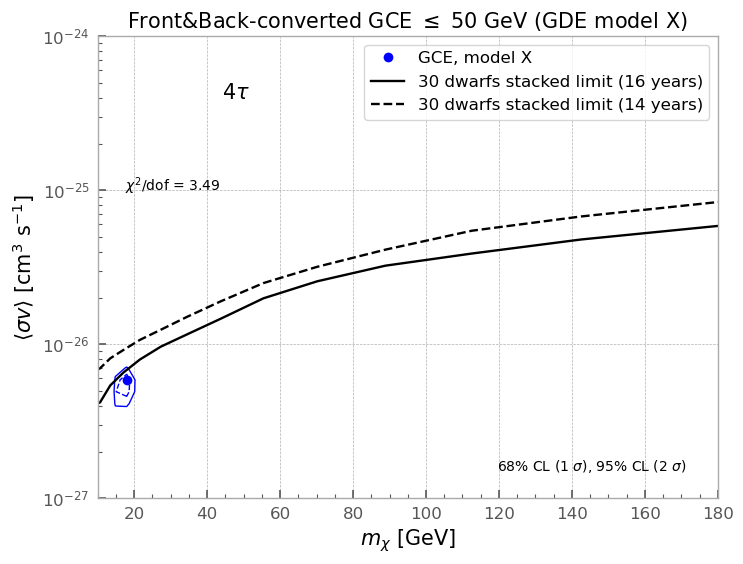

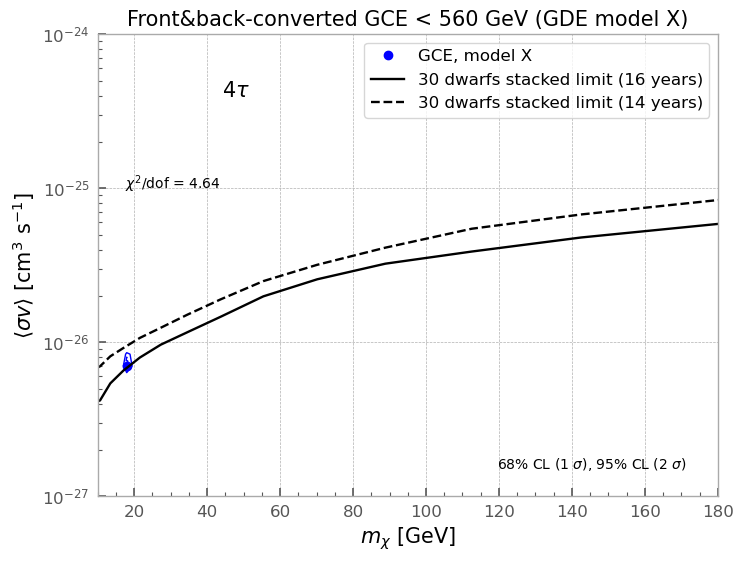

In [161]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -25, 40)
        
            mass_vec = np.logspace(np.log10(0.1), np.log10(180), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            
            plt.xlim(10, 180)
            plt.ylim(1e-27, 1e-24)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$4\tau$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/4tau_16yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/4tau_14yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
 
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()

            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_4tau_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

# 2 Body final state

# bb

front_back 17


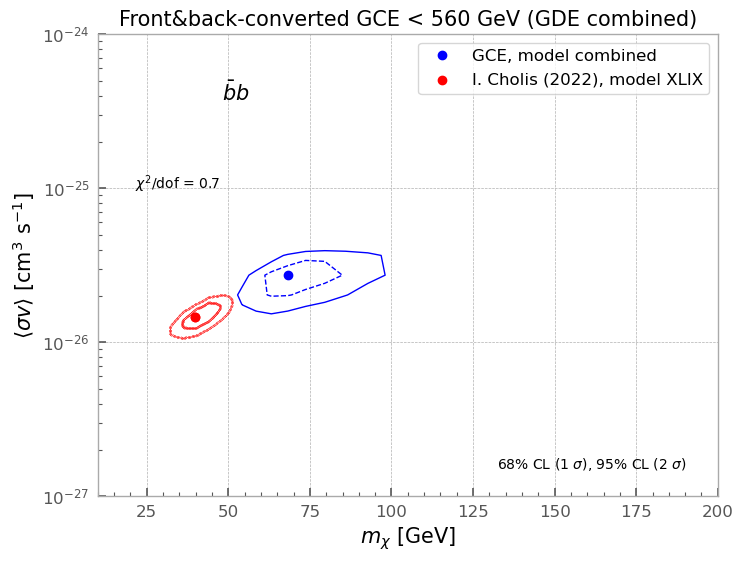

front_back 14


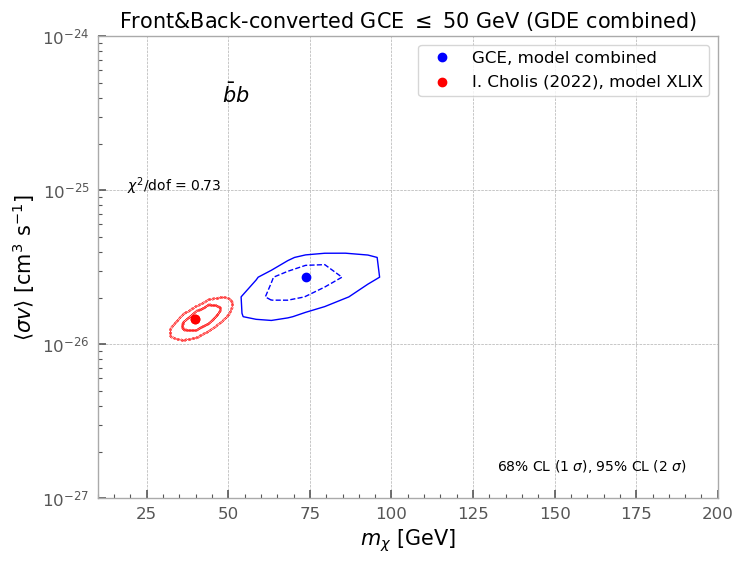

front 17


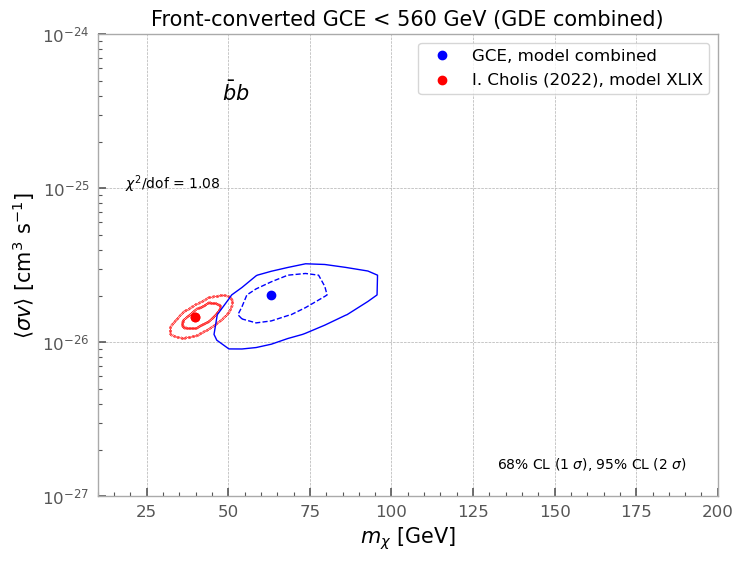

front 14


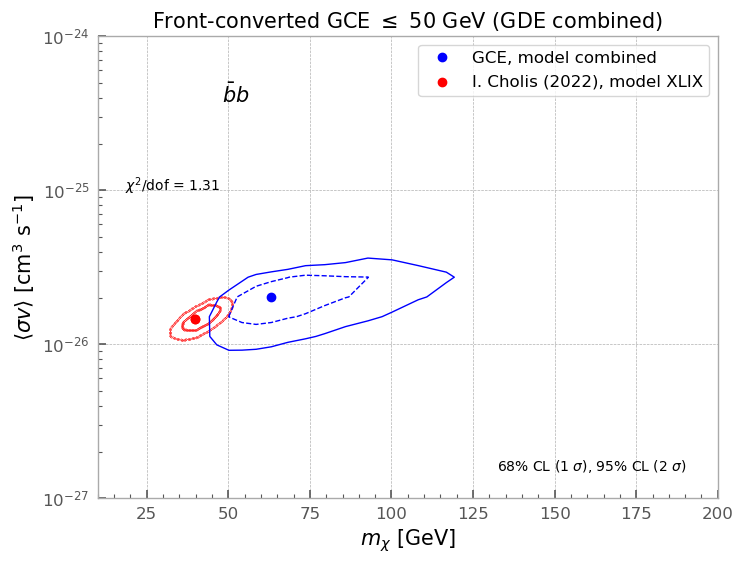

In [20]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'bb').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 13, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(10), np.log10(200), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
     
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(10, 200)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\bar{b}b$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')


        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 1], s=0.01, color='red')
        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 1],  s=0.01, color='red')
        
        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 1], color='red', label='I. Cholis (2022), model XLIX')
        
        
        # plt.loglog(np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/p_bar/bb_limit.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/p_bar/bb_limit.txt')[0:, 1], label=r'AMS02 $\bar{p}$ bounds')

        
        plt.legend()
        # plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_bb_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


front 14


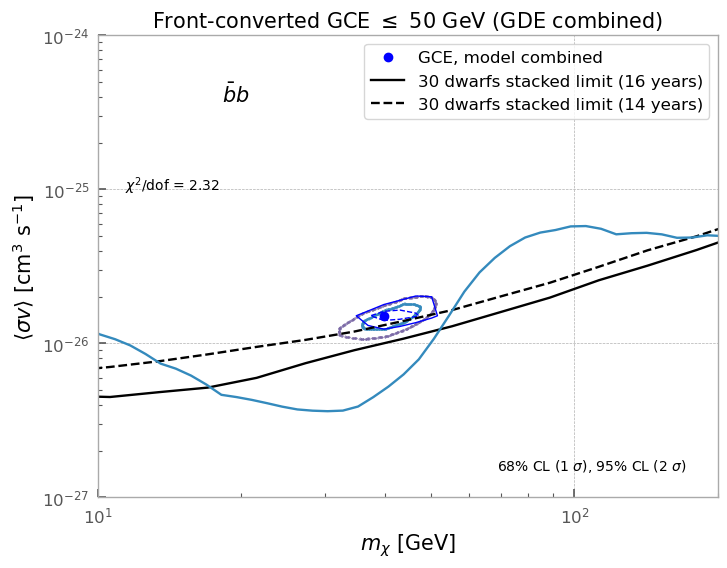

In [17]:
for front in ['front']:
    for energy_bin_length in ['14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            bin_length = int(energy_bin_length)

            g=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_XLIX_12yr_cholis.dat')
        
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_XLIX_12yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'bb').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 13, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            # cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            cov=(np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_12yr.npy")  ))

            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(10), np.log10(200), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
     
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(10, 200)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\bar{b}b$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')


        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 1], s=0.1 )
        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 1], s=0.1 )
        
        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 1], s=0.1 )
        
        
        plt.loglog(np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/p_bar/bb_limit.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/p_bar/bb_limit.txt')[0:, 1])

        
        plt.legend()
        # plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_bb_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


[]

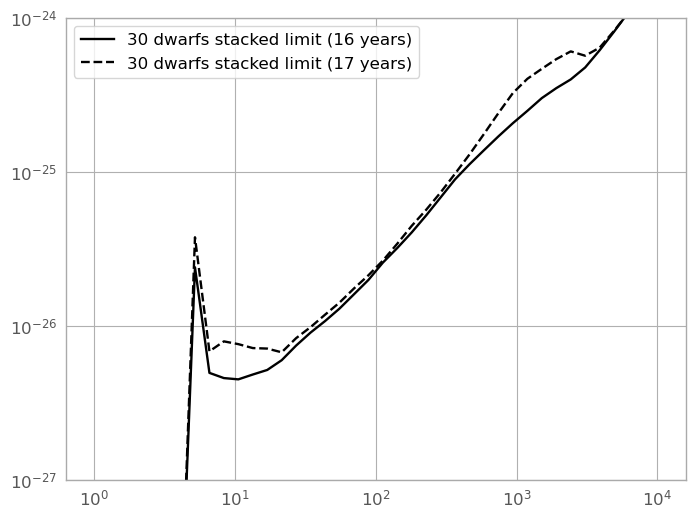

In [3]:
ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
# ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bbbb_14yr_30_dSphs.txt')
# plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_17yr_30_dSphs.txt')
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (17 years)', color='black', linestyle='dashed')

plt.legend()

# plt.xlim(10, 200)
plt.ylim(1e-27, 1e-24)
plt.loglog()




front_back 17


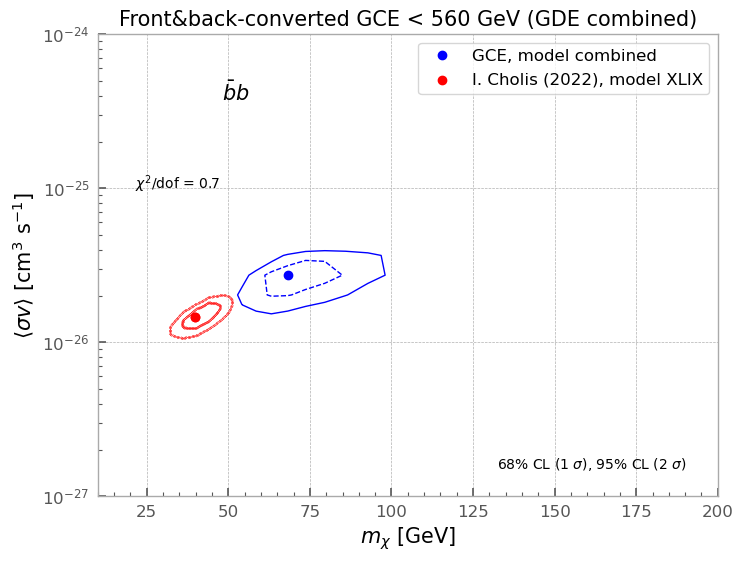

front_back 14


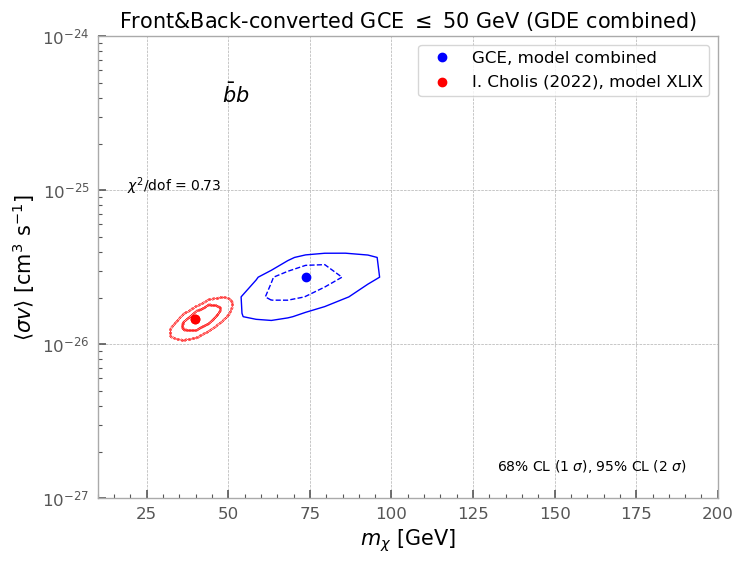

front 17


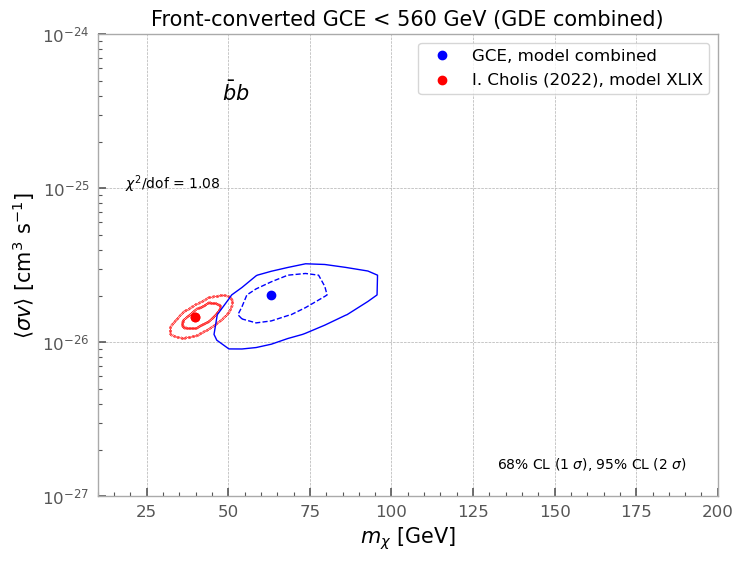

front 14


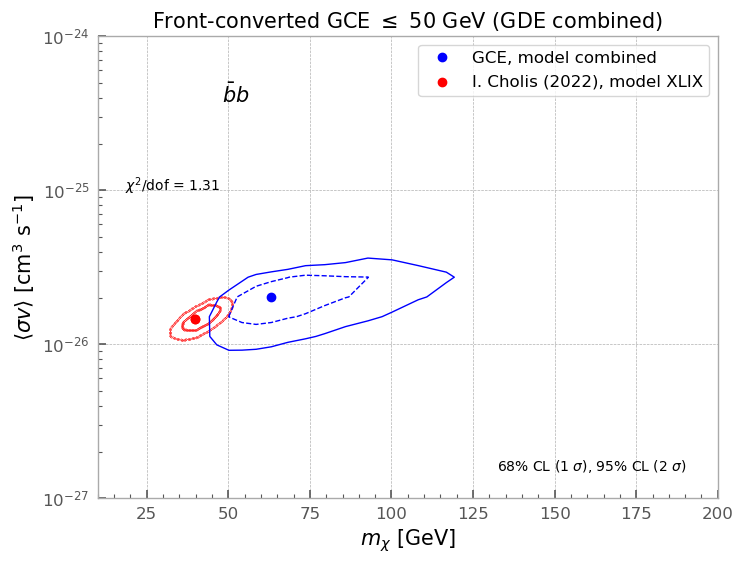

In [28]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'bb').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 13, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(10), np.log10(200), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
     
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(10, 200)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\bar{b}b$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')

        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 1], s=0.01, color='red')
        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 1],  s=0.01, color='red')
        
        plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 1], color='red', label='I. Cholis (2022), model XLIX')
        plt.legend()

        # plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_bb_16yr_GCE_only.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


front_back 17


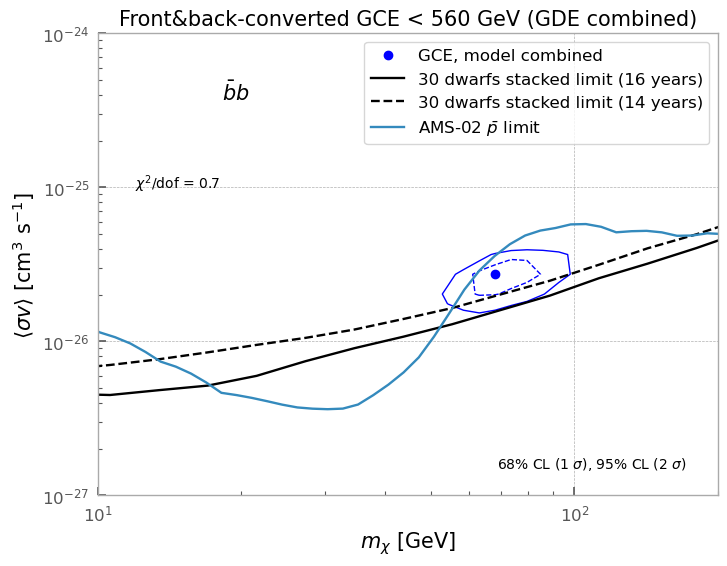

front_back 14


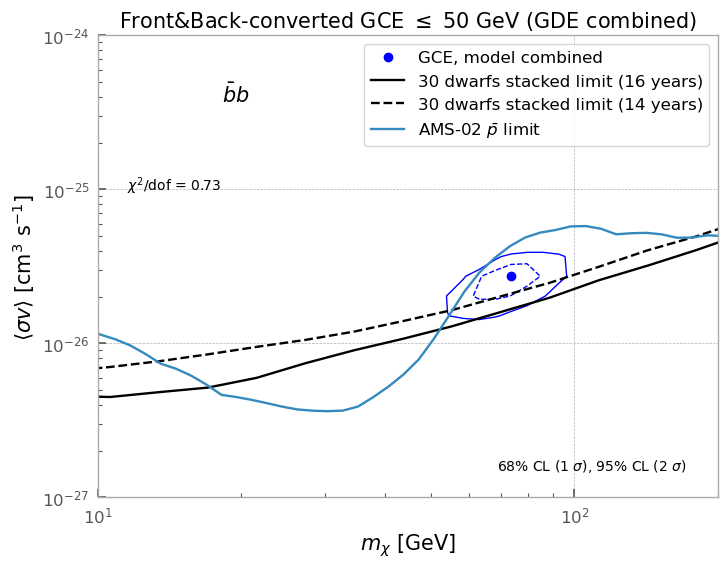

front 17


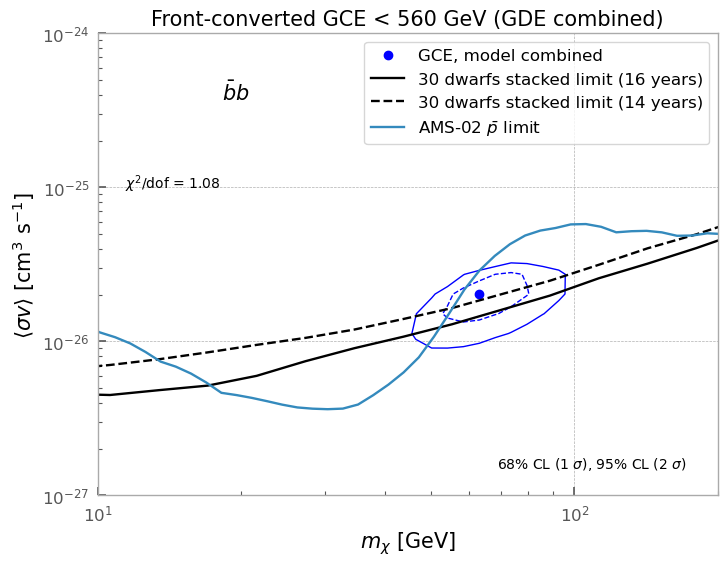

front 14


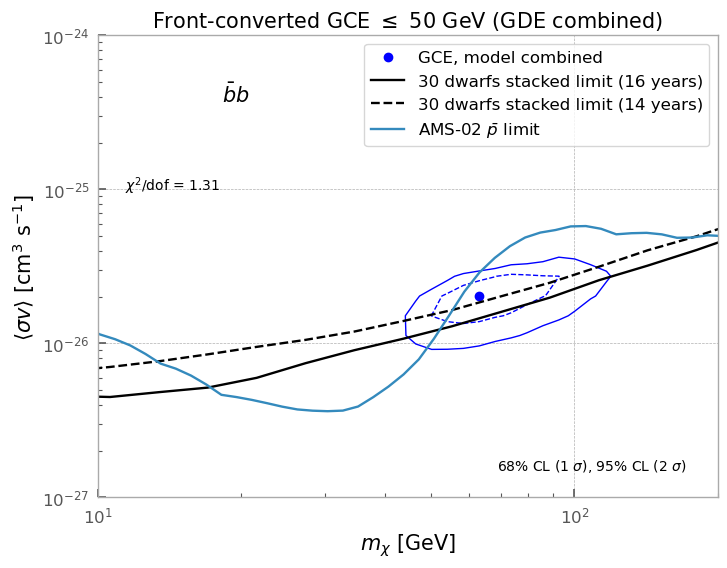

In [27]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'bb').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 13, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(10), np.log10(200), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
     
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(10, 200)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\bar{b}b$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')

        # plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 1], s=0.01, color='red')
        # plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 1],  s=0.01, color='red')
        
        # plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 1], color='red', label='I. Cholis (2022), model XLIX')
        plt.loglog(np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/p_bar/bb_limit.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/p_bar/bb_limit.txt')[0:, 1], label=r'AMS-02 $\bar{p}$ limit')

        # plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_bb_16yr_GCE_only.png', bbox_inches='tight', dpi=300)
        plt.legend()
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


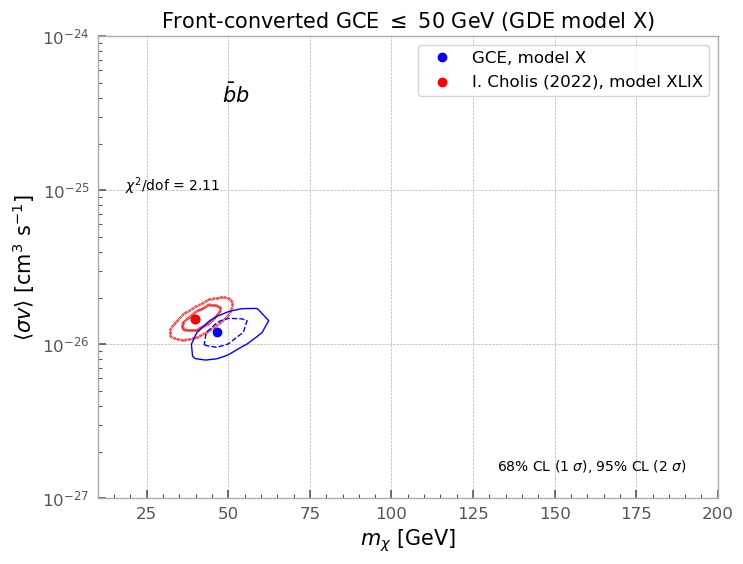

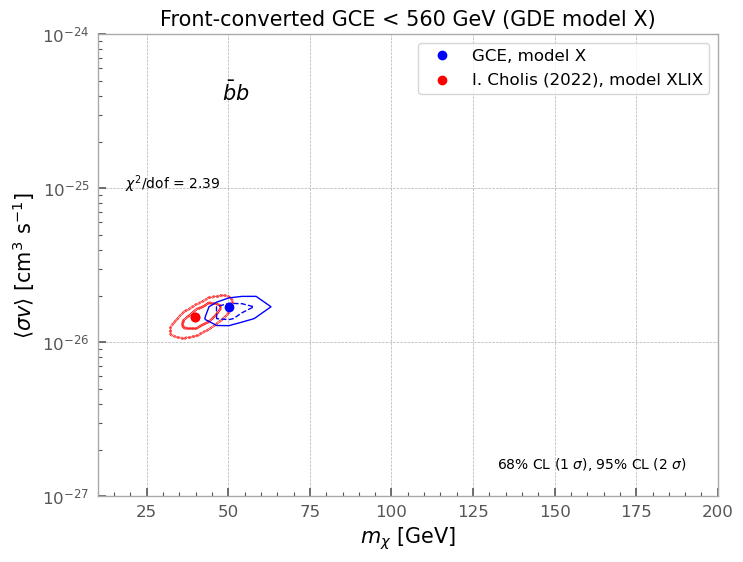

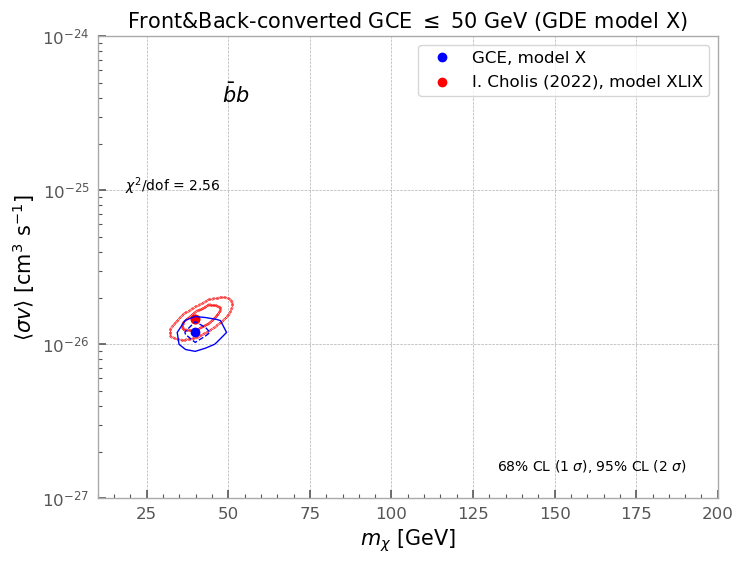

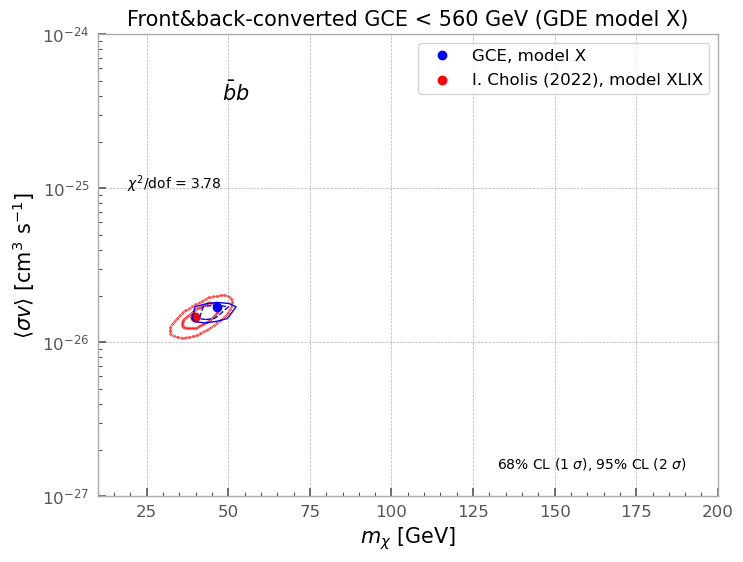

In [23]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
                prompt_dat = exctractcirellitable(dm_mass, 13, 'gammas', 'Yes')

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -25, 40)
        
            mass_vec = np.logspace(np.log10(10), np.log10(200), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(10, 200)
            plt.ylim(1e-27, 1e-24)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$\bar{b}b$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
     
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_1_sigma_contour.txt')[0:, 1], s=0.01, color='red')
            plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_2_sigma_contour.txt')[0:, 1],  s=0.01, color='red')
        
            plt.scatter( np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 0], np.loadtxt('/home/sanghwan/USINE/USINE_V4_PBAR/Notebook/DM_limit/GCE/Cholis_2022/bb_best_fit_contour.txt')[0:, 1], color='red', label='I. Cholis (2022), model XLIX')
        
            
            plt.legend()

            # plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_bb_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

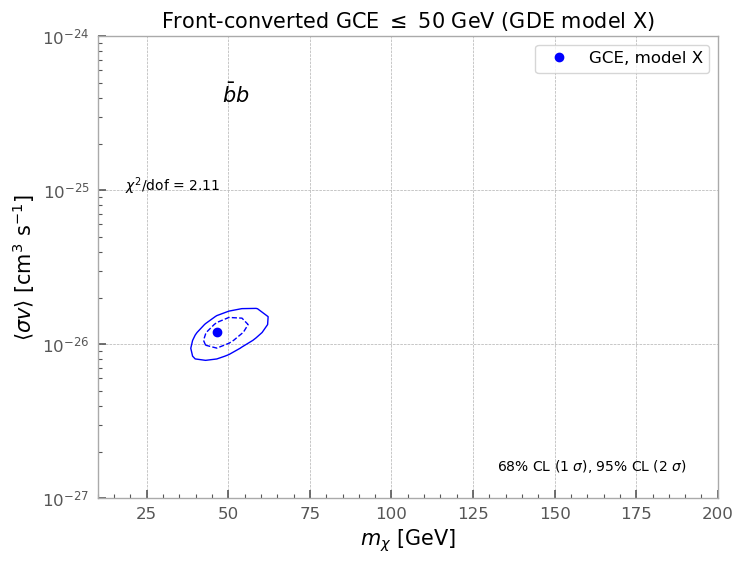

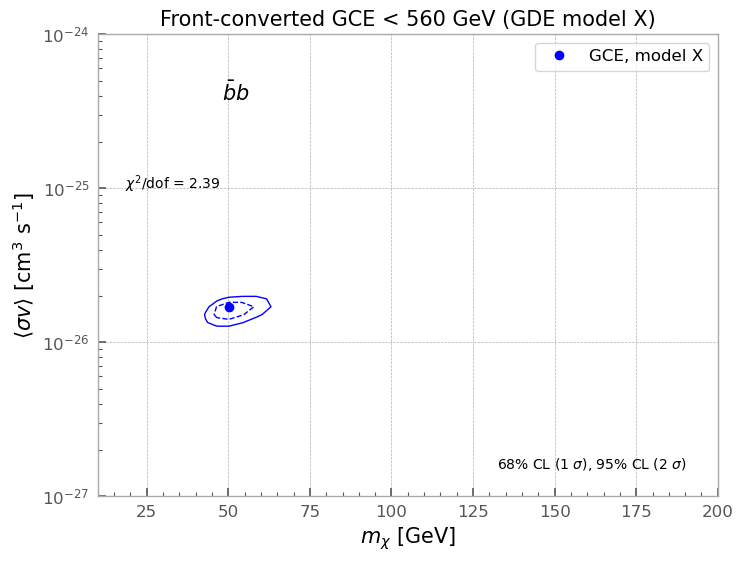

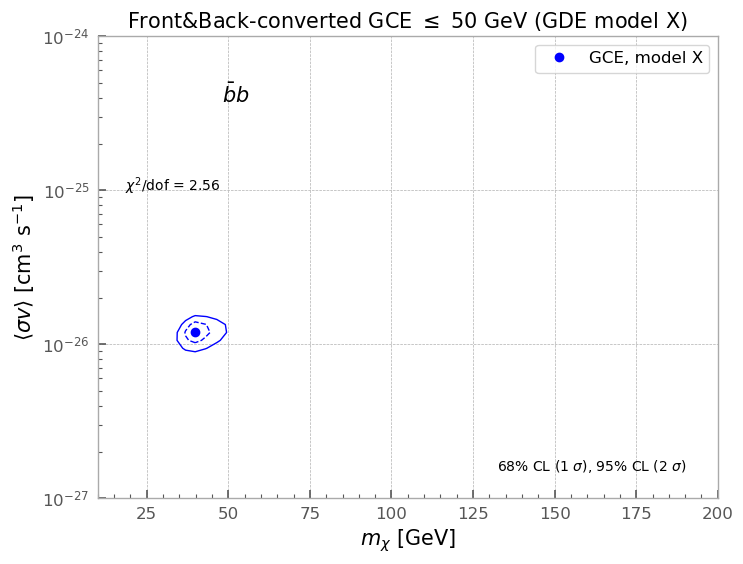

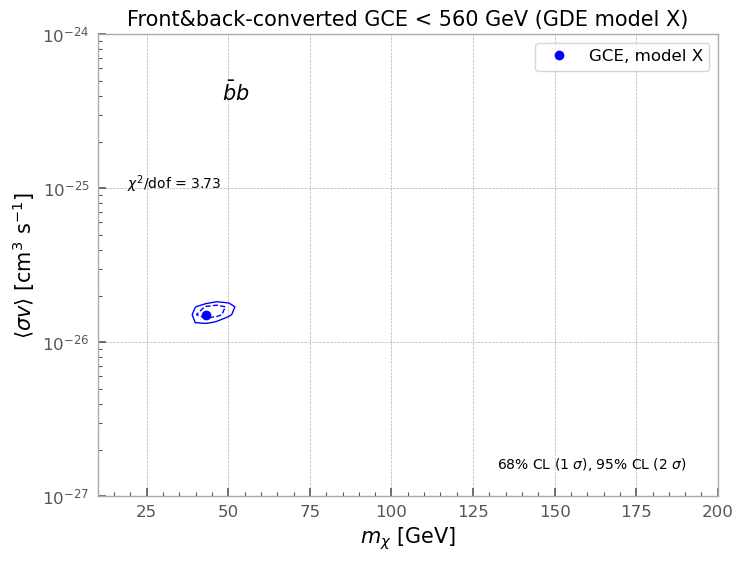

In [165]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
                prompt_dat = exctractcirellitable(dm_mass, 13, 'gammas', 'Yes')

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-27, -25, 40)
        
            mass_vec = np.logspace(np.log10(10), np.log10(200), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(10, 200)
            plt.ylim(1e-27, 1e-24)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$\bar{b}b$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
     
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()

            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_bb_16yr_GCE_only.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

# 2tau

front_back 17


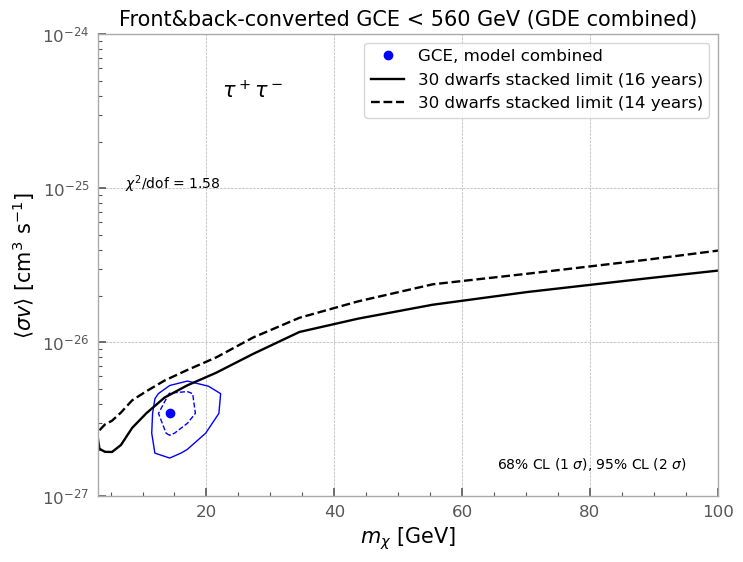

front_back 14


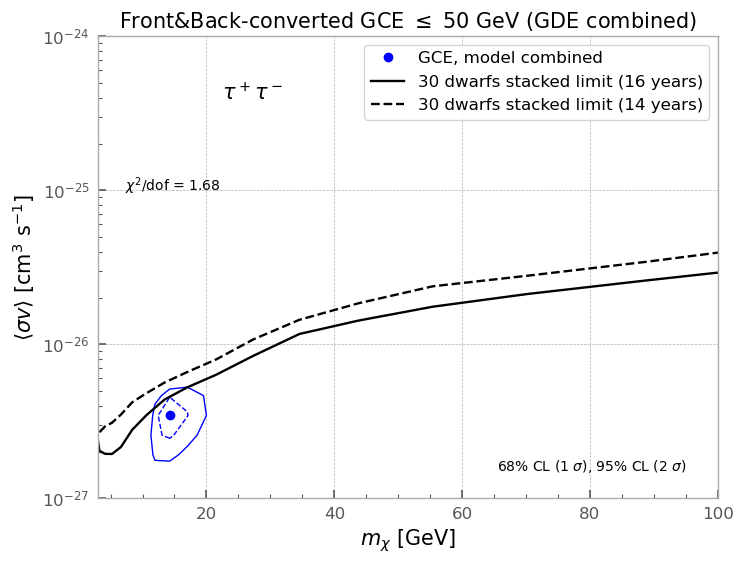

front 17


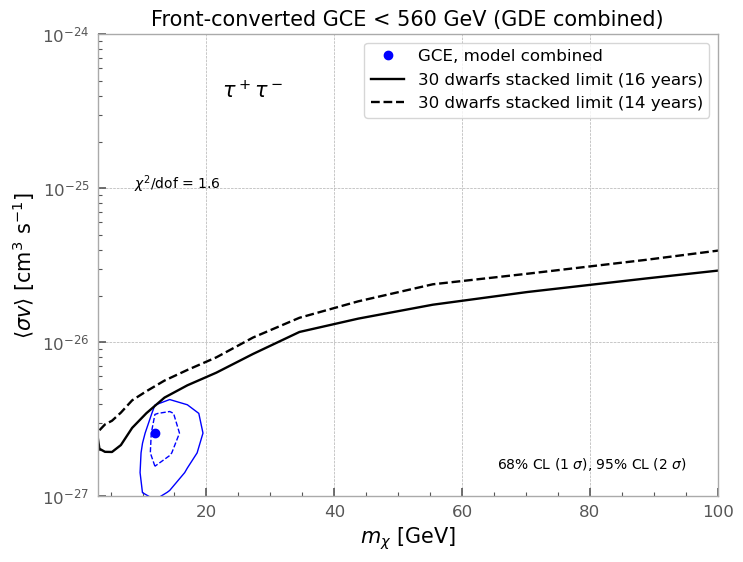

front 14


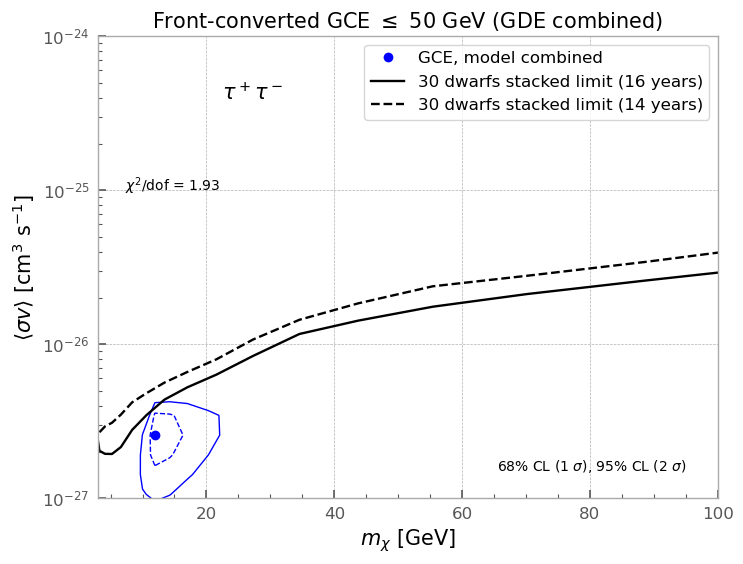

In [166]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 10, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(0.1), np.log10(100), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

     
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
           
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_14yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(3, 100)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_tau_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


front_back 17


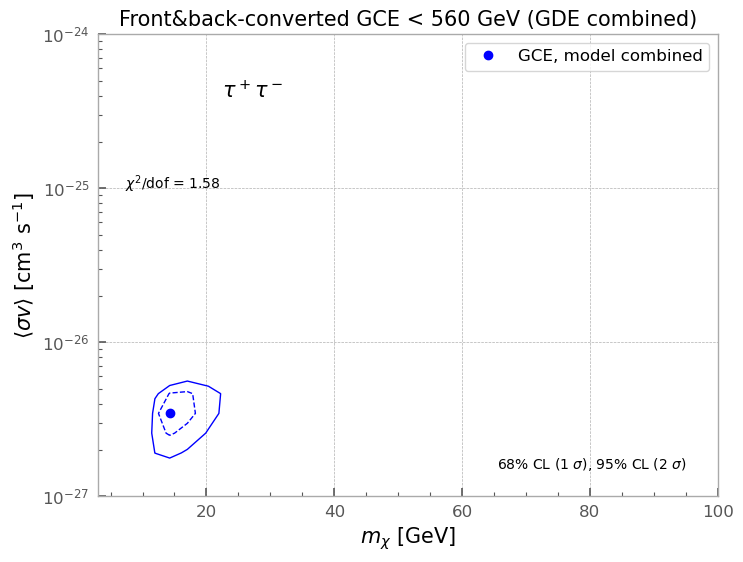

front_back 14


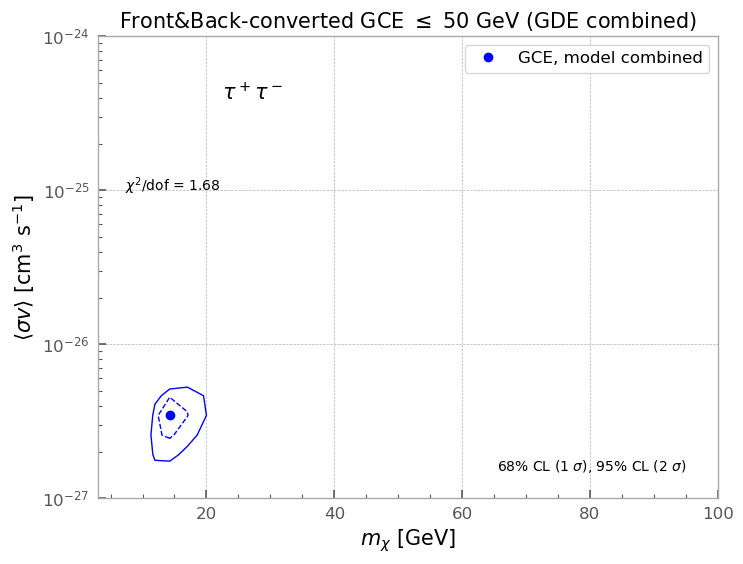

front 17


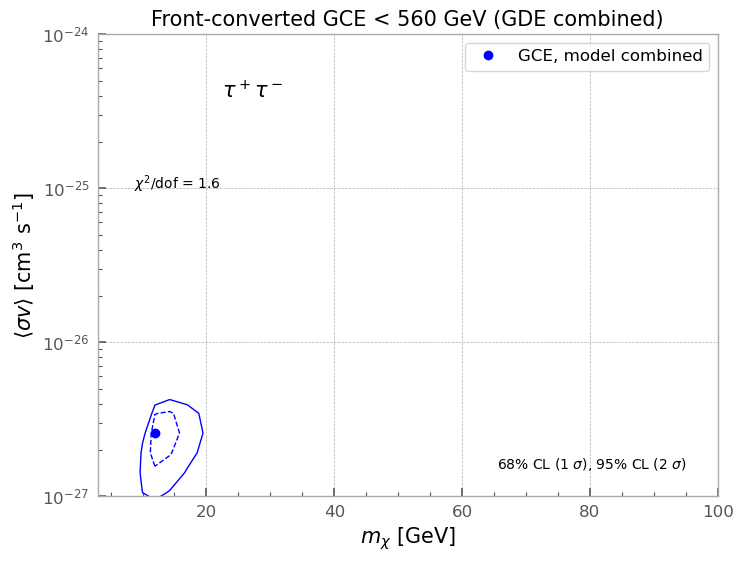

front 14


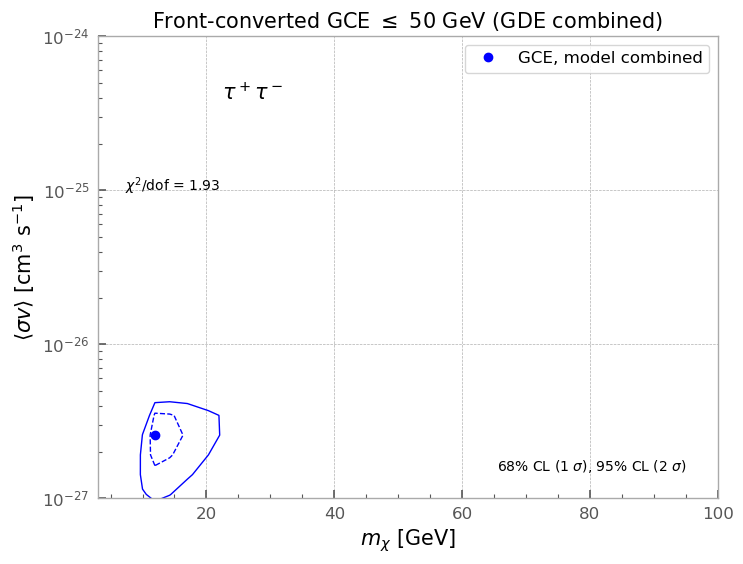

In [167]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 10, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(0.1), np.log10(100), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

     
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
           
        # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_16yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_14yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(3, 100)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_tau_16yr_GCE_only.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


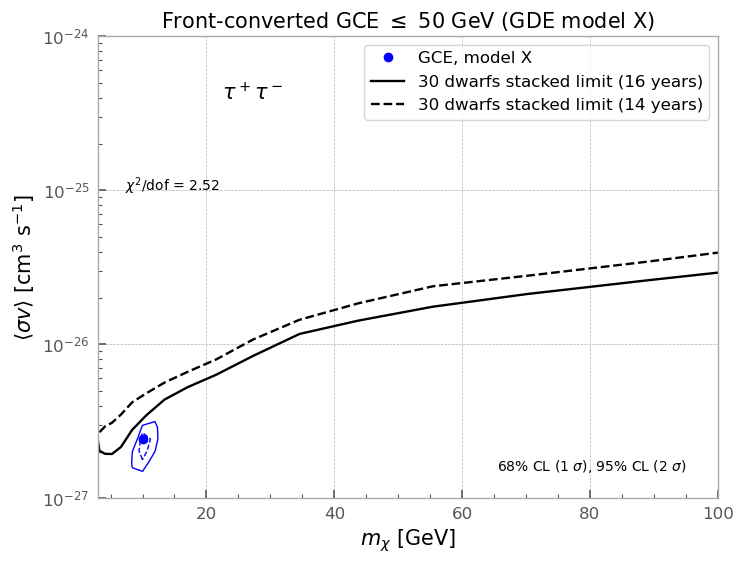

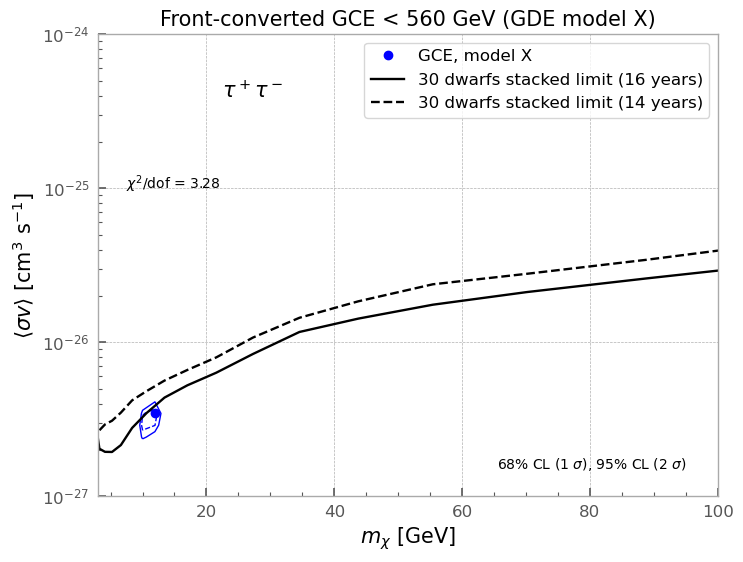

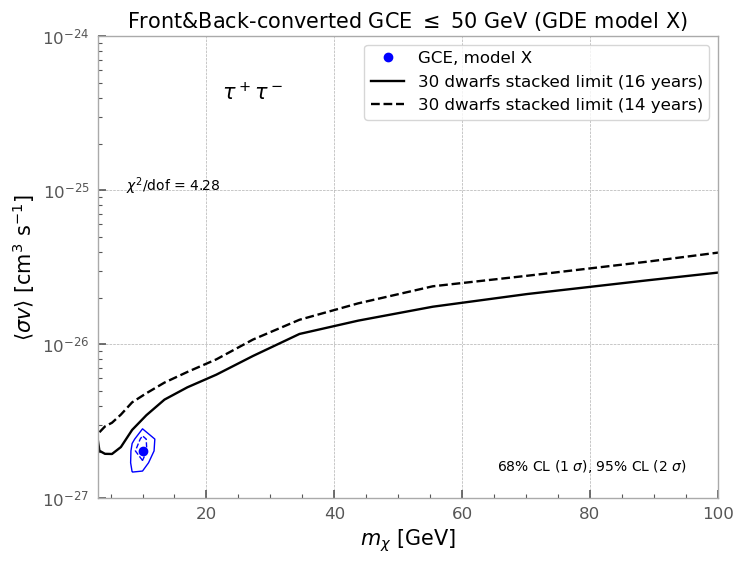

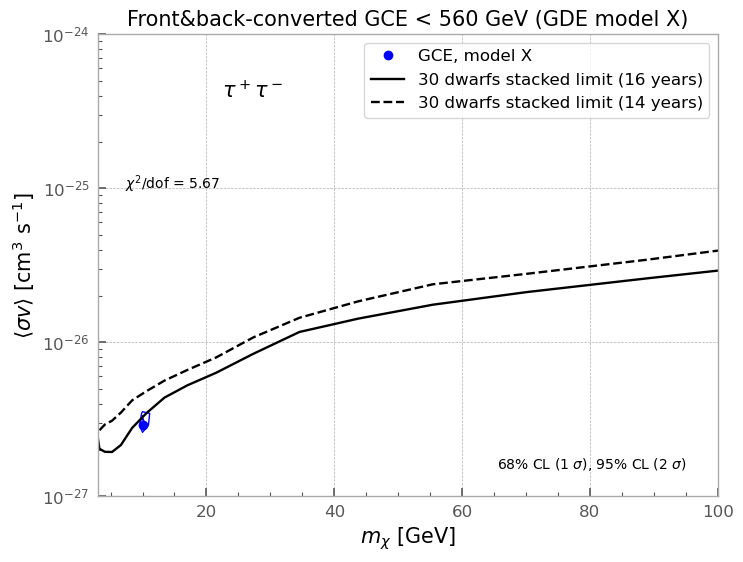

In [168]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
                prompt_dat = exctractcirellitable(dm_mass, 10, 'gammas', 'Yes')

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -25, 40)
        
            mass_vec = np.logspace(np.log10(0.1), np.log10(100), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(3, 100)
            plt.ylim(1e-27, 1e-24)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_16yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_14yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
 
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()

            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_tau_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

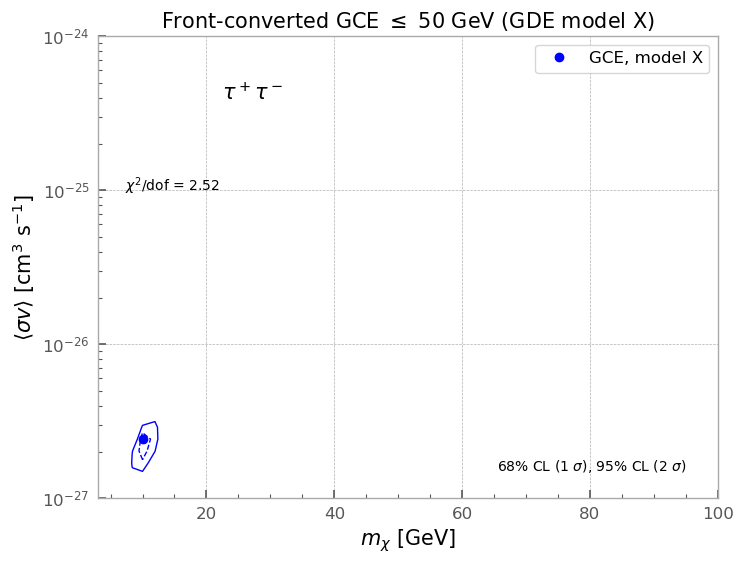

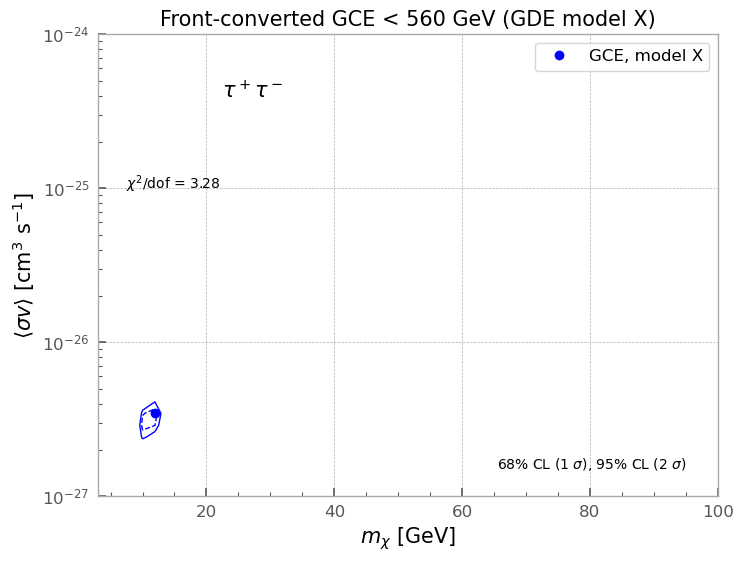

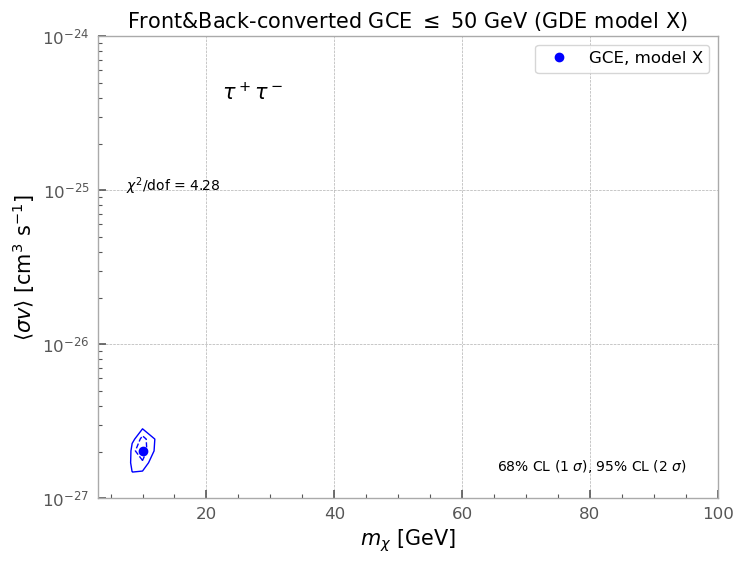

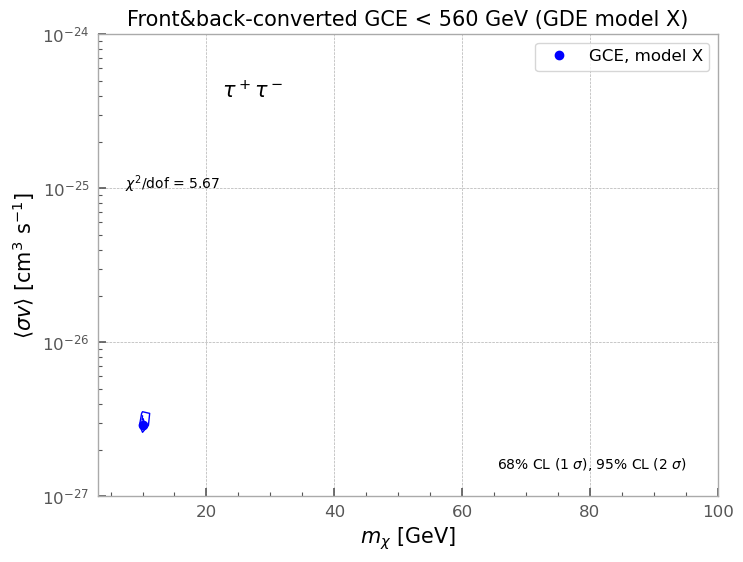

In [169]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
                prompt_dat = exctractcirellitable(dm_mass, 10, 'gammas', 'Yes')

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -25, 40)
        
            mass_vec = np.logspace(np.log10(0.1), np.log10(100), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(3, 100)
            plt.ylim(1e-27, 1e-24)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_16yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_14yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
 
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()

            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_tau_16yr_GCE_only.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

# 2mu

front_back 17


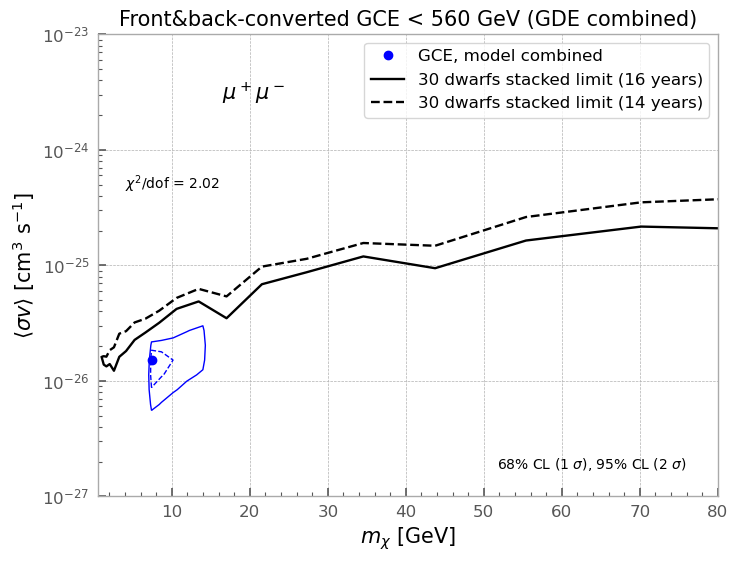

front_back 14


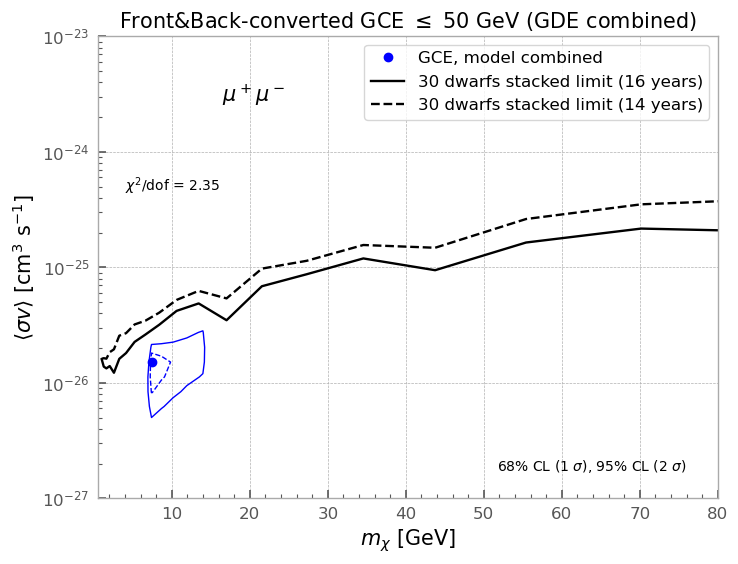

front 17


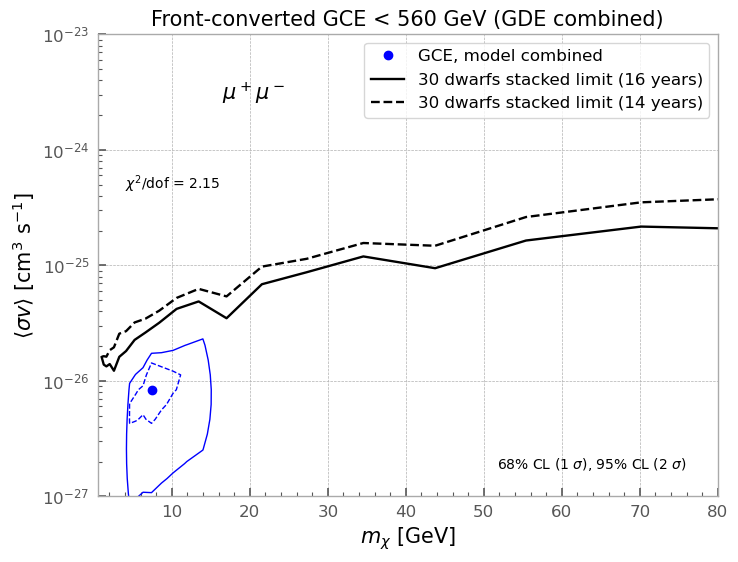

front 14


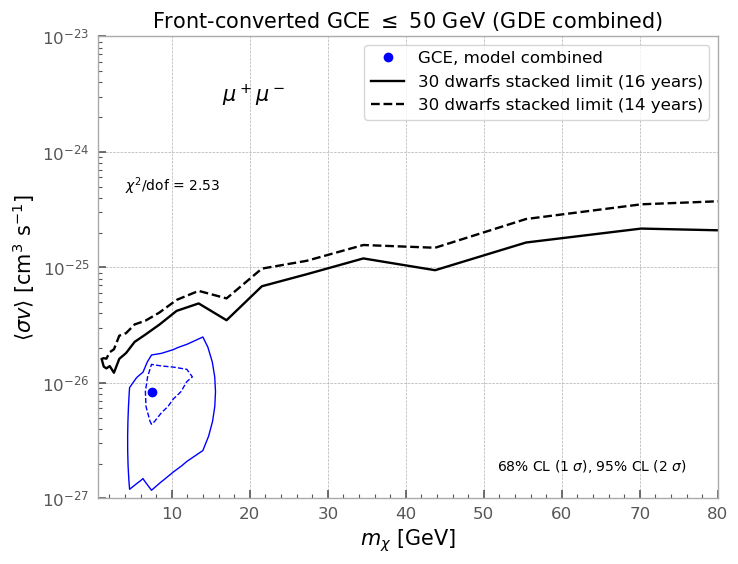

In [170]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 7, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(0.1), np.log10(50), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
        
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_14yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(0.5, 80)
        plt.ylim(1e-27, 1e-23)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\mu^+ \mu^-$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_mu_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


front_back 17


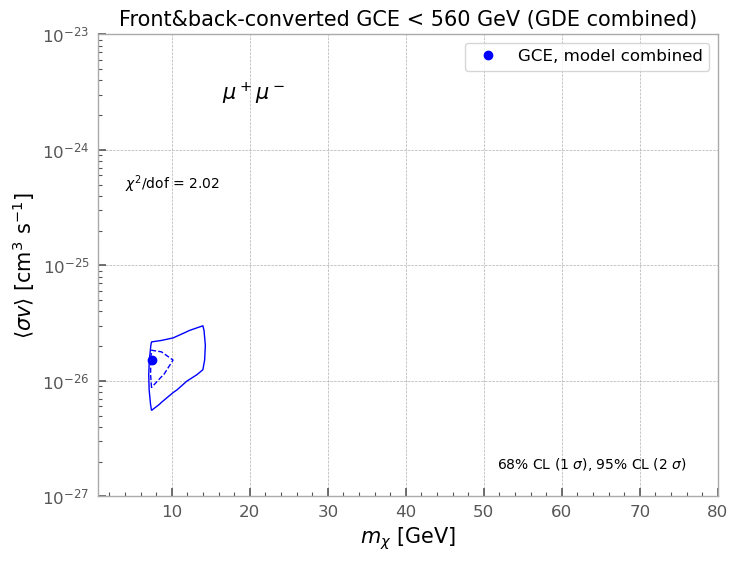

front_back 14


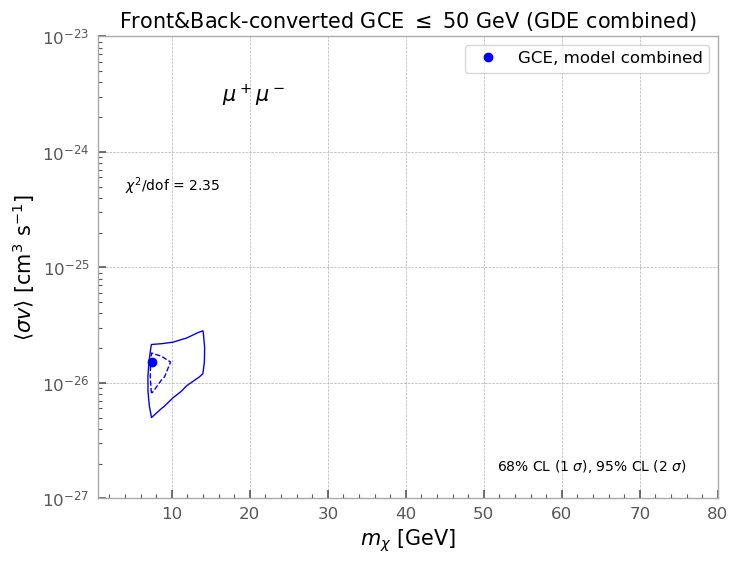

front 17


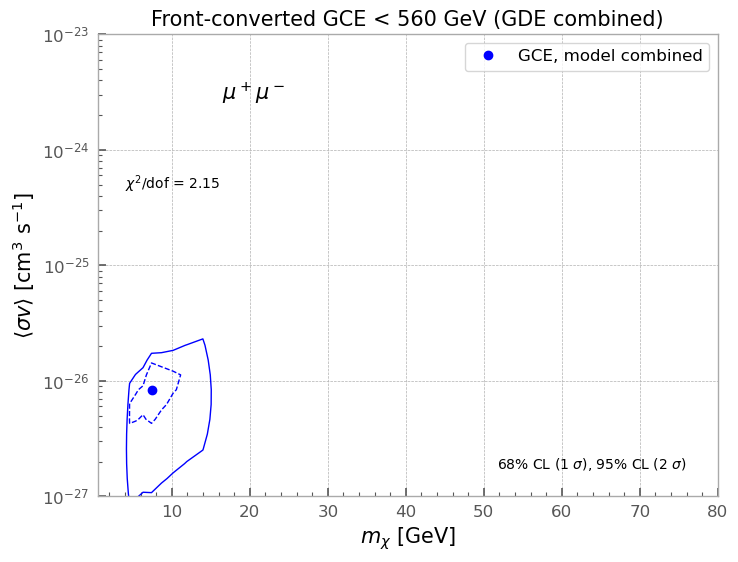

front 14


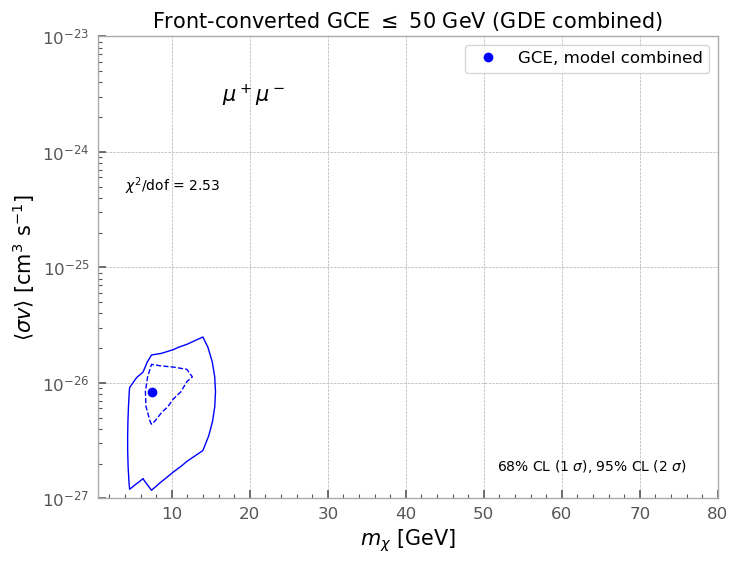

In [171]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 7, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        
        
            data = data(emeans)
            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(0.1), np.log10(50), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

        
        
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
        # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_16yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_14yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(0.5, 80)
        plt.ylim(1e-27, 1e-23)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$\mu^+ \mu^-$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_mu_16yr_GCE_only.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


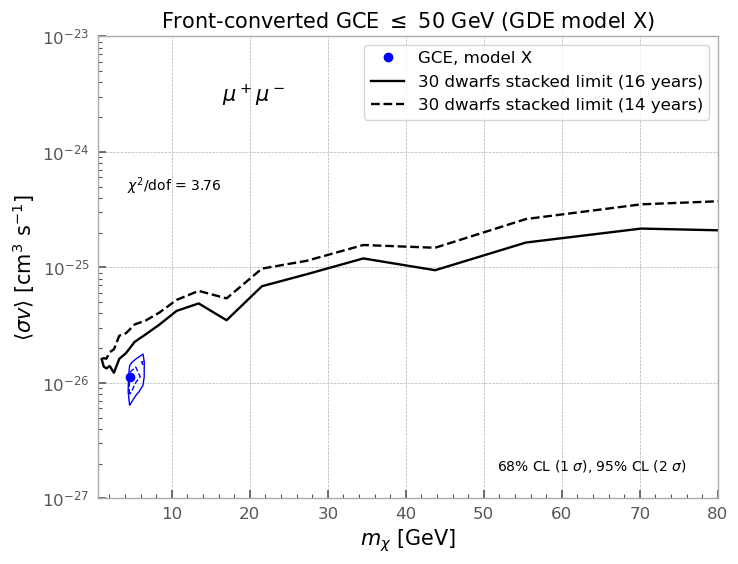

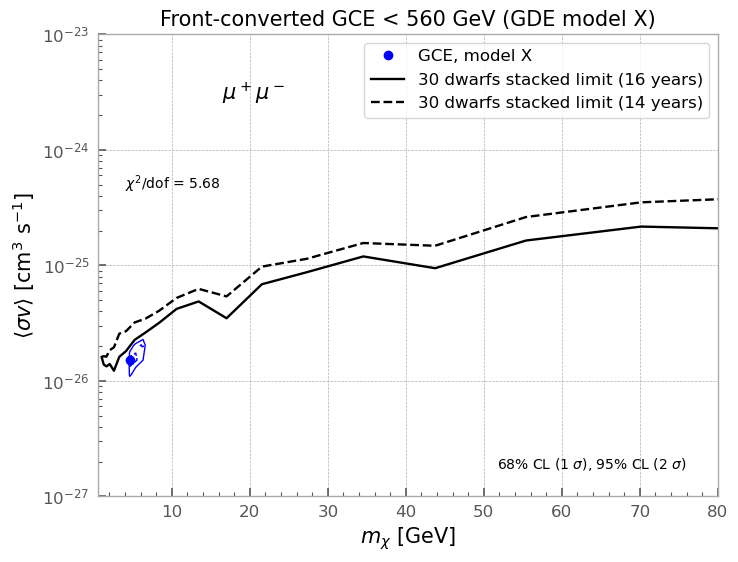

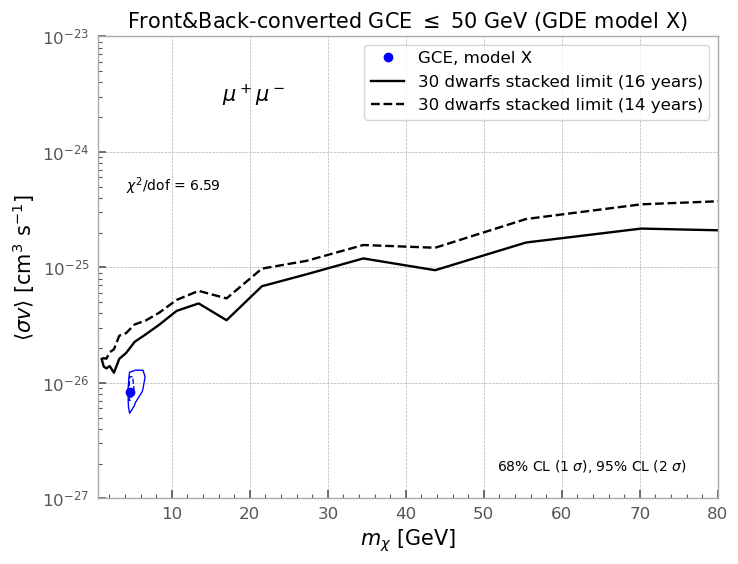

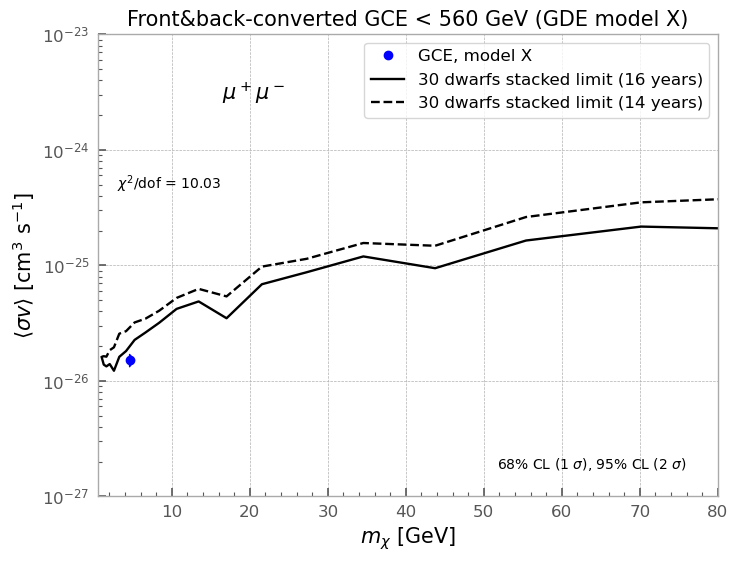

In [172]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
                prompt_dat = exctractcirellitable(dm_mass, 7, 'gammas', 'Yes')

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -23, 40)
            
            mass_vec = np.logspace(np.log10(0.1), np.log10(50), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(0.5, 80)
            plt.ylim(1e-27, 1e-23)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$\mu^+ \mu^-$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_16yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_14yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
 
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()

            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_mu_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

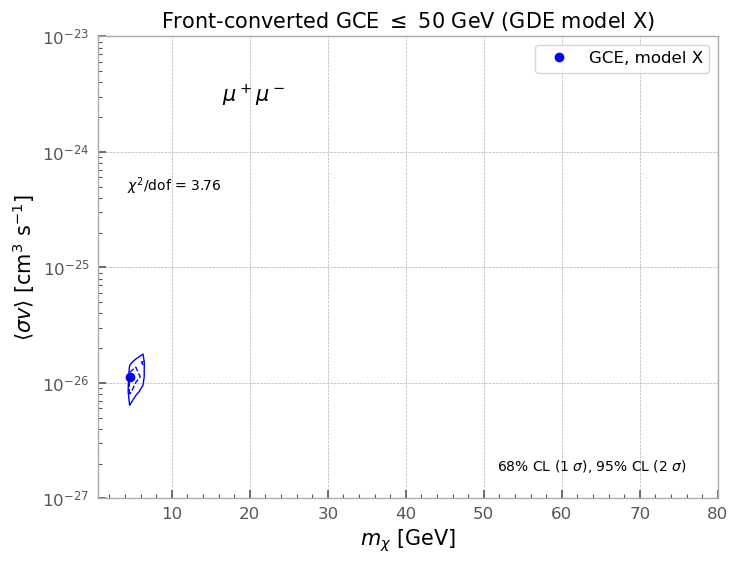

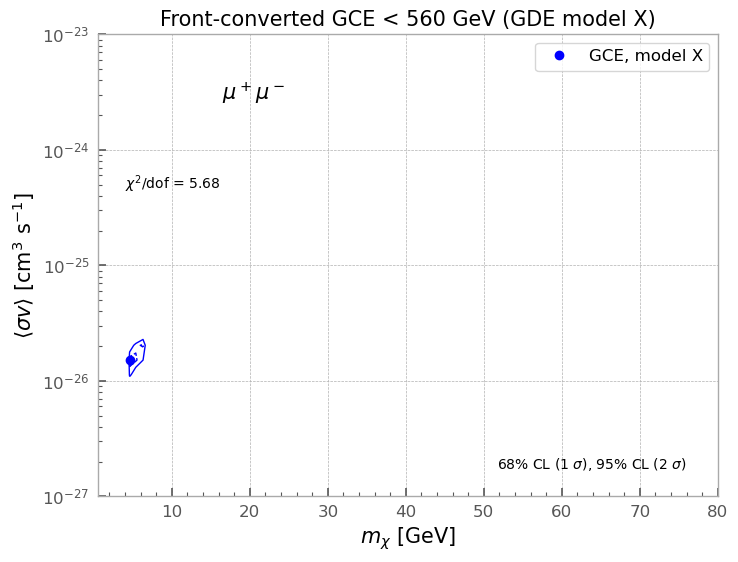

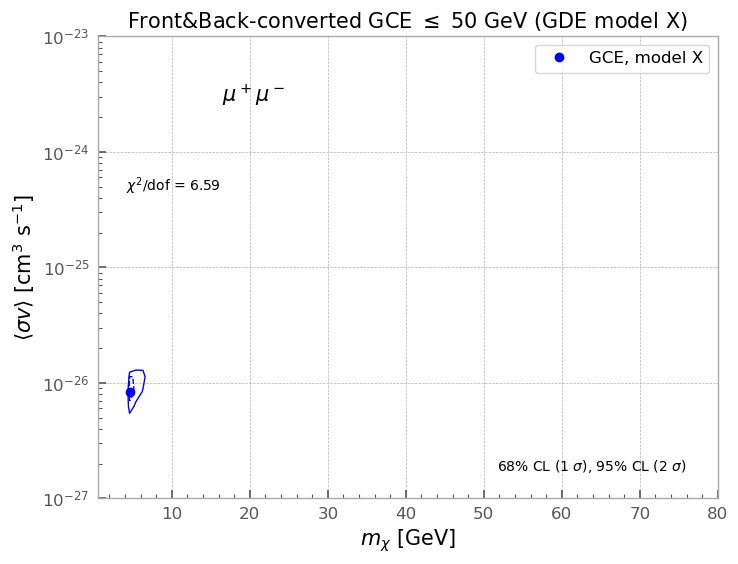

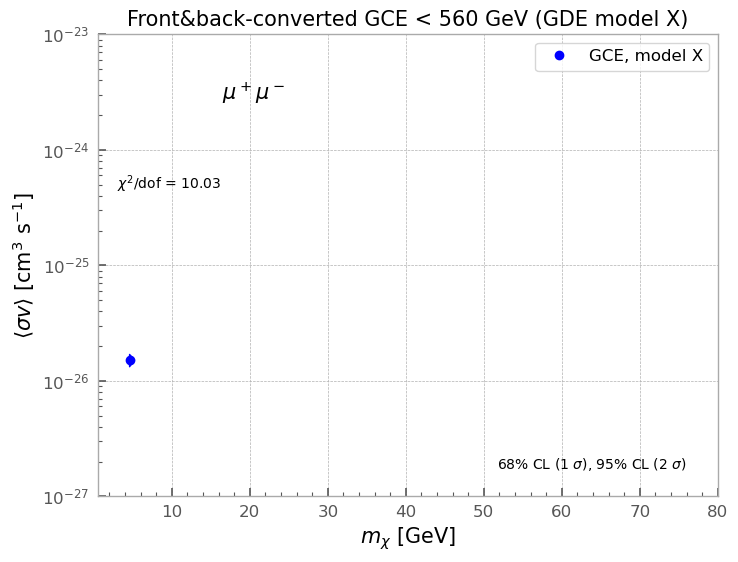

In [173]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
                prompt_dat = exctractcirellitable(dm_mass, 7, 'gammas', 'Yes')

                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -23, 40)
            
            mass_vec = np.logspace(np.log10(0.1), np.log10(50), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(0.5, 80)
            plt.ylim(1e-27, 1e-23)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$\mu^+ \mu^-$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_16yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_14yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
 
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()

            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_mu_16yr_GCE_only.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

# L_mu - L_tau

front_back 17


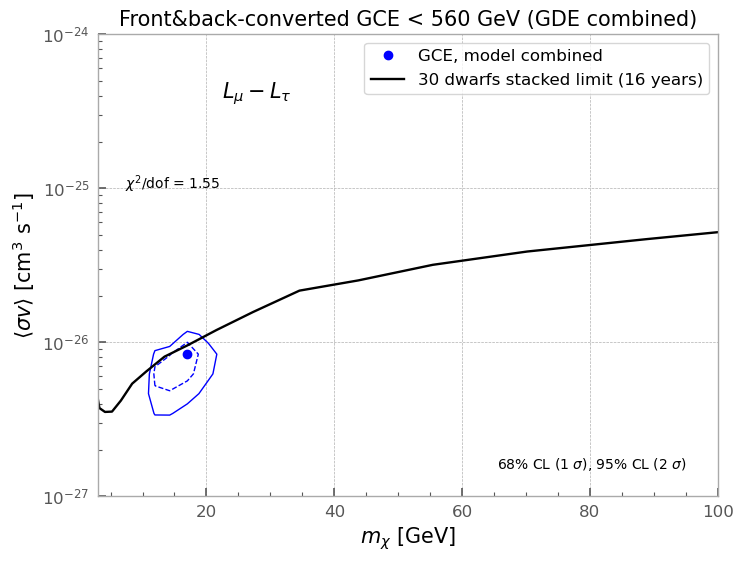

front_back 14


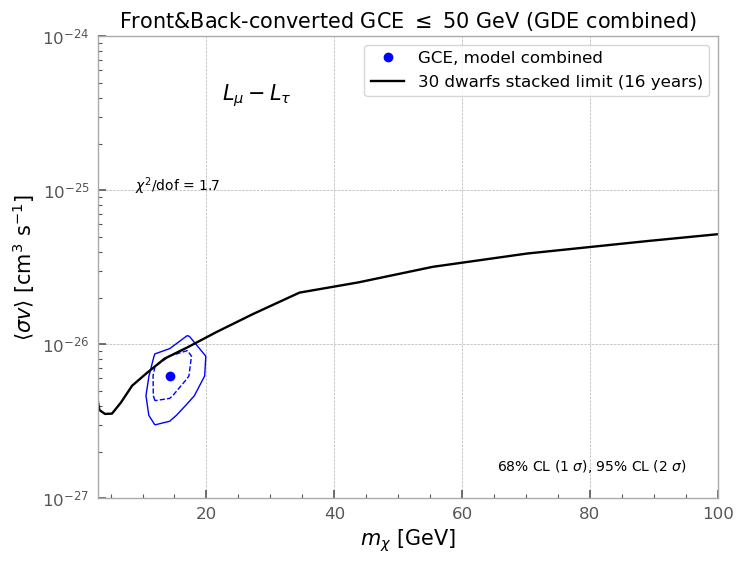

front 17


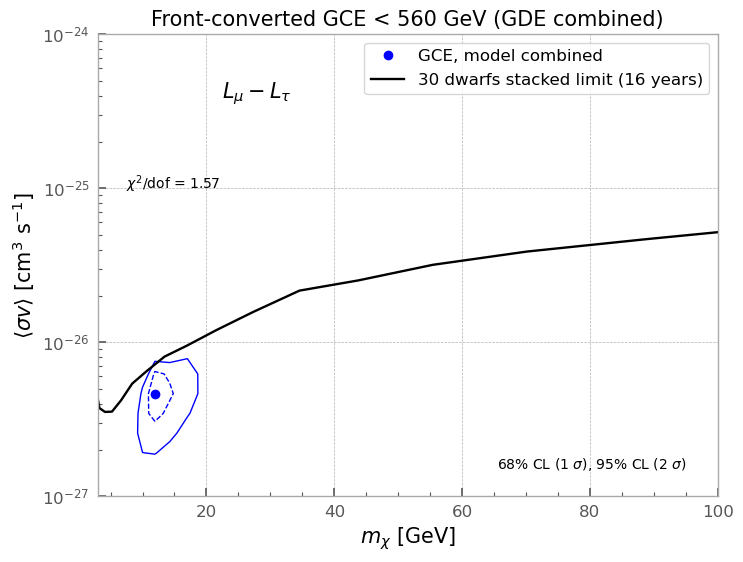

front 14


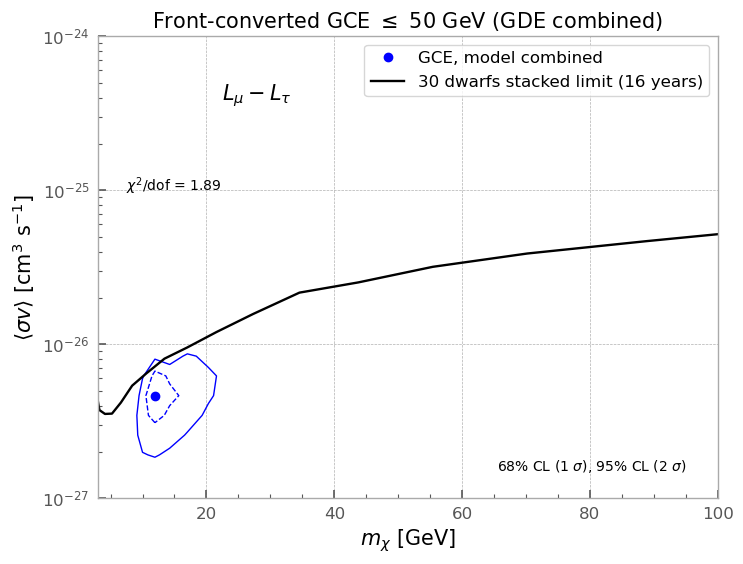

In [174]:
for front in ['front_back', 'front']:
    for energy_bin_length in ['17', '14']:
# for front in ['front']:
# for energy_bin_length in ['17']:
# for front, energy_bin_length in zip(['front_back', 'front'], ['17', '14']):
        print(front, energy_bin_length)
        def chi_square(dm_mass, sigma_v):
            
            warnings.simplefilter("ignore", category=RuntimeWarning)  
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
            
            g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GDEs_combined_results_{front}_16yr.dat')
        
            bin_length = int(energy_bin_length)
            
            emeans=g[0:, 0][0:bin_length]
            GCE_data=g[0:, 1][0:bin_length]
        
            
            systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
            systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
        
            # statistical_uncertainty = g[0:, 4][0:bin_length]
            statistical_uncertainty = np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/GCE_model_X_front_16yr_cholis.dat')[0:, 2][0:bin_length]

            # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
            prompt_dat = exctractcirellitable(dm_mass, 10, 'gammas', 'Yes')
            
            J_factor=3.5251837158376415e+21 #Check needed
            sr=0.4288213187542626
        
            data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

            data = data(emeans)*0.5

            prompt_dat = exctractcirellitable(dm_mass, 7, 'gammas', 'Yes')
            pre_data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
            data += pre_data(emeans)*0.5
            

            data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            
            cov=(np.load(f'/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_{front}_{energy_bin_length}x{energy_bin_length}_16yr.npy') + np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_X'}_16yr.npy")  ))
            inv_cov=np.linalg.inv(cov)
        
            
            delta = data - GCE_data
            return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
        
        sigmav_vec=np.logspace(-28, -23, 40)
        
        mass_vec = np.logspace(np.log10(0.1), np.log10(100), 40)
    
        
        DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
        chi_square_vec=np.vectorize(chi_square)
        
        
        
        chi_square_values = chi_square_vec(DM_mass, Sigmav)
        
        
        min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
        min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
        best_fit_dm=DM_mass[min_index_2d]
        best_fit_sigmav=Sigmav[min_index_2d]
        min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
        
        
        one_sigma_threshold=min_chi2 + 2.30
        two_sigma_threshold=min_chi2 + 6.18
        
        chi_square_results=chi_square_vec(DM_mass, Sigmav)
        
        dof = int(energy_bin_length) - 2

     
        plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
        plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model combined')
        
           
        ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/L_mu-L_tau_16yr_30_dSphs.txt')
        plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
        # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/tau_14yr_30_dSphs.txt')
        # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
        
        plt.yscale('log')
        plt.xscale('linear')
        plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
        plt.tick_params(axis='both', which='minor',
                       direction='in', length=3, width=0.8)      
        ax = plt.gca()                # 현재 Axes 가져오기

        # ── minor tick 생성 ─────────────────────────────────
        ax.xaxis.set_minor_locator(AutoMinorLocator()) 
    
        plt.xlim(3, 100)
        plt.ylim(1e-27, 1e-24)
        
        
        plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
        
        plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                 verticalalignment='top', horizontalalignment='right',
                 transform=plt.gca().transAxes)
        # plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
        # plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
        plt.text(0.2, 0.90, r'$L_\mu - L_\tau$', fontsize=15, color='black',
        
                 verticalalignment='top', horizontalalignment='left',
                 transform=plt.gca().transAxes)
        # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
        if front == 'front':
            if energy_bin_length == '14':
                plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        elif front == 'front_back':
            if energy_bin_length == '14':
                plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE combined)', fontsize=15)
            elif energy_bin_length == '17':
                plt.title(r'Front&back-converted GCE < 560 GeV (GDE combined)', fontsize=15)
        plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
        plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
        # plt.title(f'{front}_E_bins_{energy_bin_length}_GDE_combined')
        plt.legend()
        plt.savefig(f'./GC_analysis/GCE_plots/GDE_combined_{front}_E_{energy_bin_length}_L_mu-L_tau_16yr.png', bbox_inches='tight', dpi=300)
        plt.show()
        
        #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


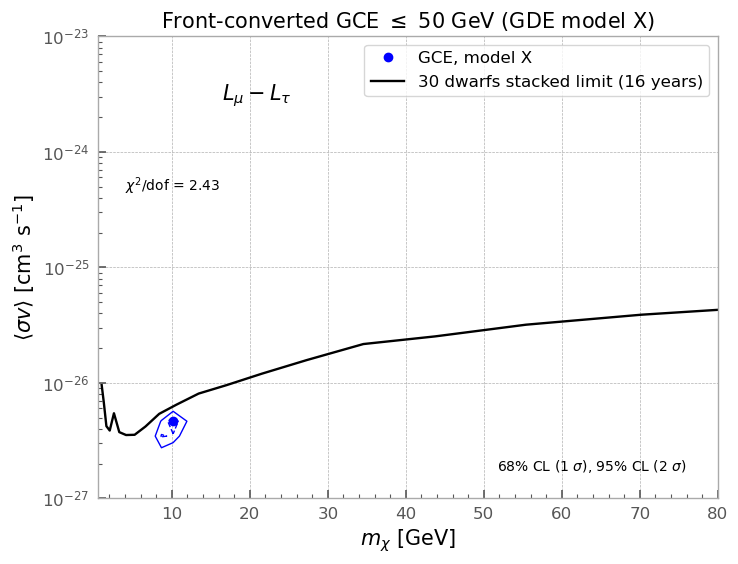

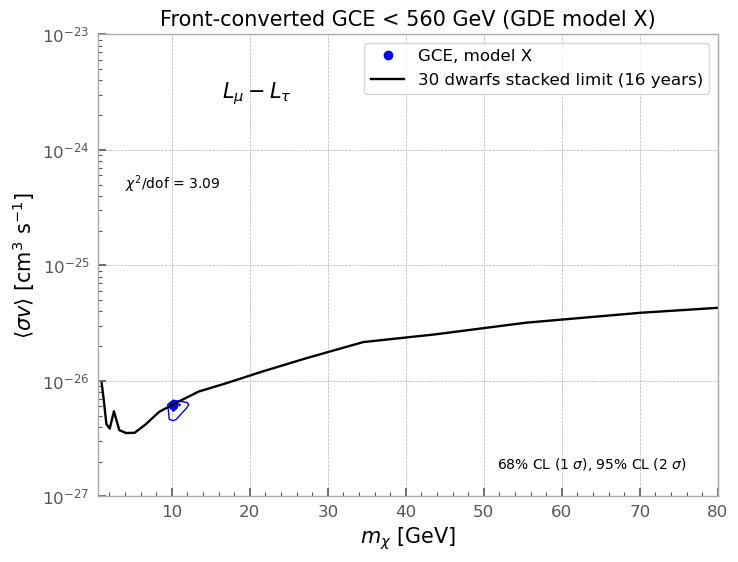

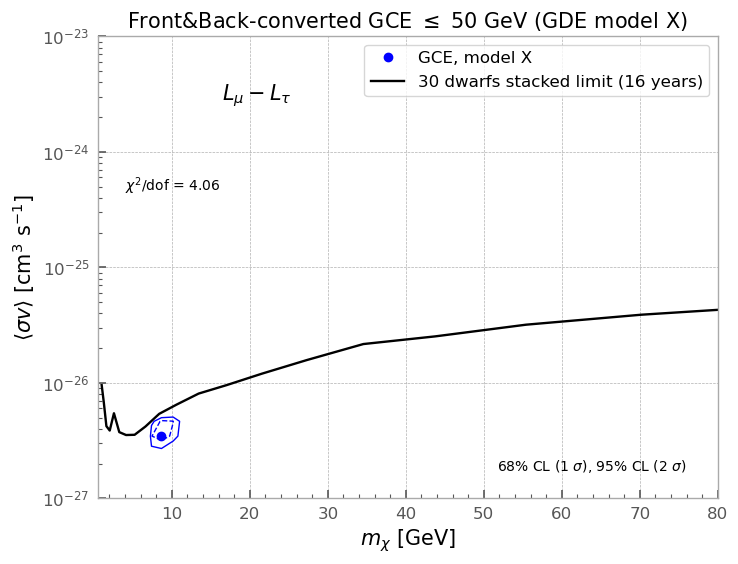

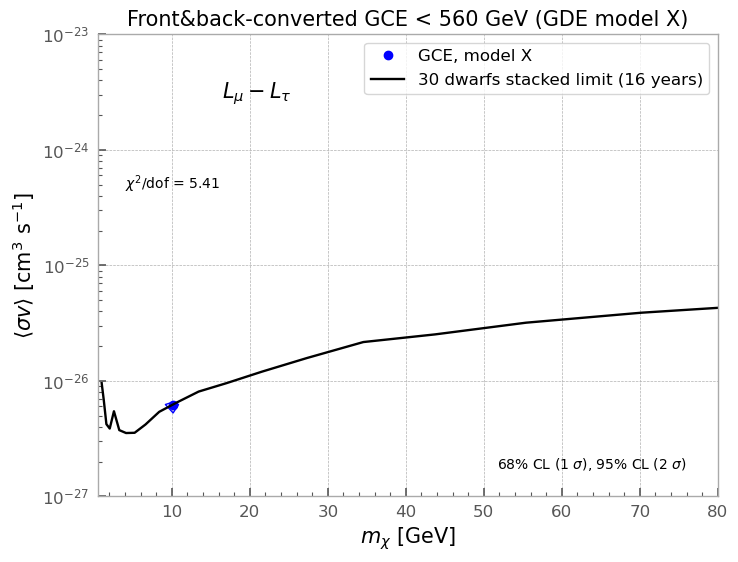

In [175]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        # for model in ['X', 'I', 'XLIX']:
        for model in ['X']:#, 'XLIX']:
            # front='front'
            # energy_bin_length='17'
            dof = int(energy_bin_length) - 2

            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                

                # prompt_dat = Interpolator(dm_mass, 'effective_4tau').interpolated_table()
                prompt_dat = exctractcirellitable(dm_mass, 10, 'gammas', 'Yes')
                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    
                data = data(emeans)*0.5
    
                prompt_dat = exctractcirellitable(dm_mass, 7, 'gammas', 'Yes')
                pre_data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
                data += pre_data(emeans)*0.5
                
    
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
            

            

                
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
 
            sigmav_vec=np.logspace(-28, -23, 40)
            
            mass_vec = np.logspace(np.log10(0.1), np.log10(50), 40)
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='blue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'GCE, model X')

            
            plt.yscale('log')
            plt.xscale('linear')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(0.5, 80)
            plt.ylim(1e-27, 1e-23)
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2$/dof = {} '.format(np.round(min_chi2/dof, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            # plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$L_\mu - L_\tau$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            # plt.scatter(70,  2.26*1e-26, label='SFDM (2016)')
           
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/L_mu-L_tau_16yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            # ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/mu_14yr_30_dSphs.txt')
            # plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
 
            if front == 'front':
                if energy_bin_length == '14':
                    plt.title(r'Front-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            elif front == 'front_back':
                if energy_bin_length == '14':
                    plt.title(r'Front&Back-converted GCE $\leq$ 50 GeV (GDE model X)', fontsize=15)
                elif energy_bin_length == '17':
                    plt.title(r'Front&back-converted GCE < 560 GeV (GDE model X)', fontsize=15)
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            # plt.title(f'{front}_E_bins_{energy_bin_length}_model_{model}')
            plt.legend()

            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}E_L_mu-L_tau_16yr.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            
                
                
                
# 

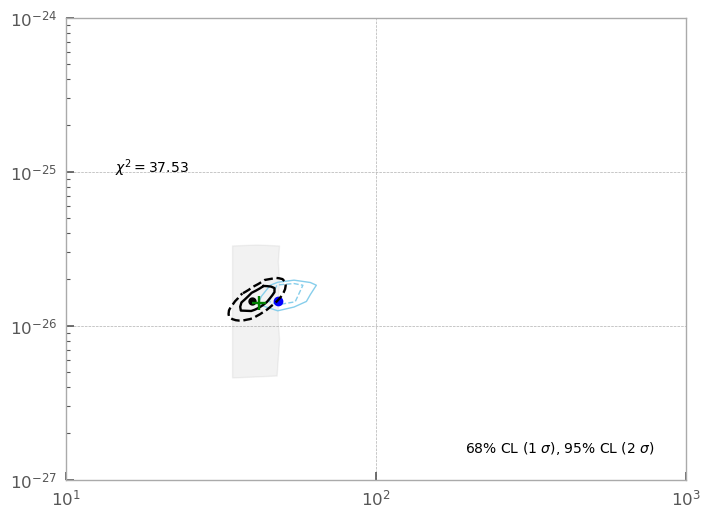

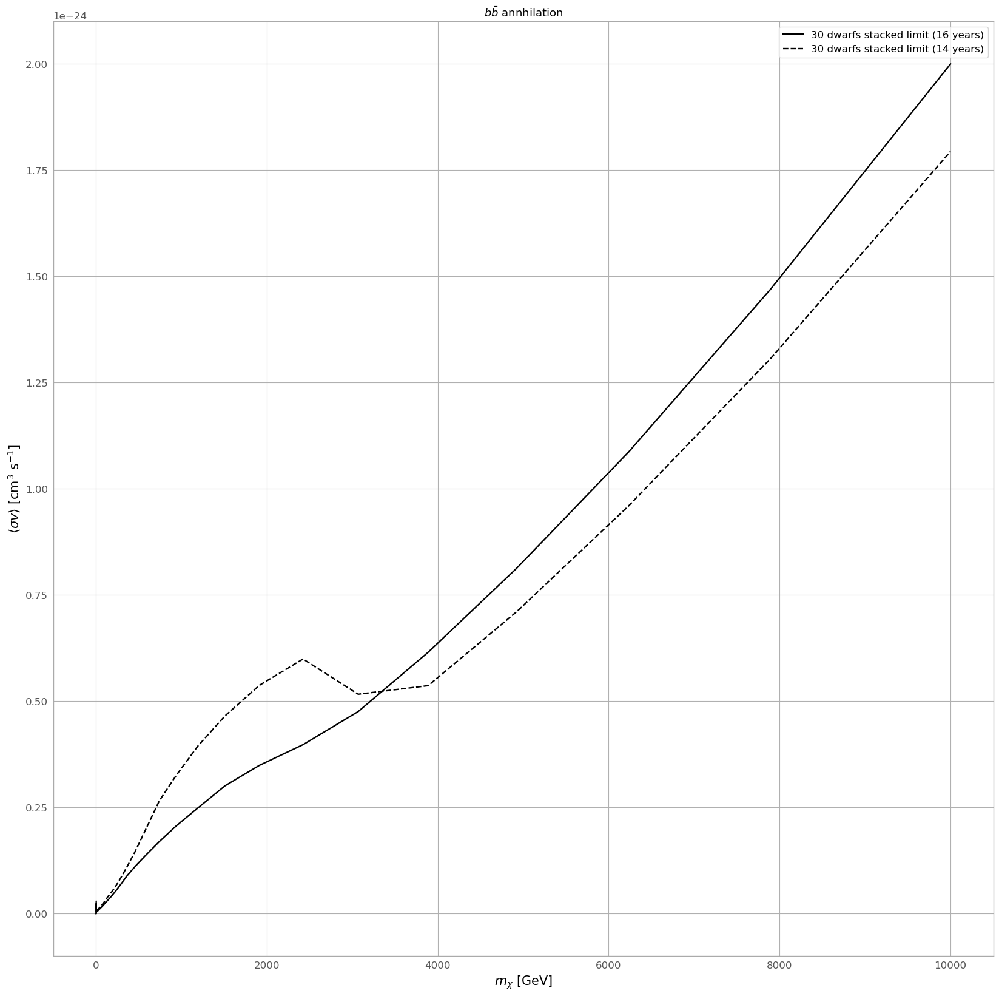

In [176]:
for front in ['front']:
    for energy_bin_length in ['17']:
        for model in ['X']:
            # front='front'
            # energy_bin_length='17'
            
            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
                # systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
                # systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                
                #d_u = (g[0:, 4] - g[0:, 1])#[0:14]
                #d_l = (g[0:, 1] - g[0:, 3])#[0:14]
                
             
                #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
                #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
                #prompt_dat = Interpolator(dm_mass).interpolated_table()
                prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
                #prompt_dat = Interpolator(dm_mass).interpolated_table()
                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value='extrapolate', bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
                #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='cubic')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
            
                #data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)
            
                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                
                #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)
            
                #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
                #for i in range(0, len(emeans), 1):
                    #GCE_data_err[i] = np.max([d_u[i], d_l[i]])
                #data = data[0:bin_length]
                #GCE_data = GCE_data[0:bin_length]
                
                #cov=(np.diag(GCE_data_err[0:17])**2 + np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy"))
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
            sigmav_vec=np.logspace(-27, -25, 20)
            
            mass_vec = np.logspace(np.log10(10), np.log10(100), 20)
            
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            #plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work, model {model} {front} data (16yr data)')

            
            plt.yscale('log')
            plt.xscale('log')
            plt.tick_params(axis='both', which='major',
                       direction='in', length=6, width=1.2)
        
            plt.tick_params(axis='both', which='minor',
                           direction='in', length=3, width=0.8)      
            ax = plt.gca()                # 현재 Axes 가져오기
    
            # ── minor tick 생성 ─────────────────────────────────
            ax.xaxis.set_minor_locator(AutoMinorLocator()) 
            plt.xlim(10, 1000)
            plt.ylim(1e-27, 1e-24)
            
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            
            # plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
            #          verticalalignment='top', horizontalalignment='left',
            #          transform=plt.gca().transAxes)
            
            
            import matplotlib.pyplot as plt
            import pandas as pd
            
            solid_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
            solid_line_x = solid_line_data['x']
            solid_line_y = solid_line_data['y']*(10**-26)
            
            dashed_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
            dashed_line_x = dashed_line_data['x']
            dashed_line_y = dashed_line_data['y']*(10**-26)
            
            point_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
            point_x = point_data['x']
            point_y = point_data['y']*(10**-26)
            
            rectangle_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
            rectangle_x = rectangle_data['x']
            rectangle_y = rectangle_data['y']
            
            point2_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
            point2_x = point2_data['x']
            point2_y = point2_data['y']
            
            errorbar_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
            error_x = errorbar_data['x']
            error_y = errorbar_data['y']
            error_yerr = errorbar_data['yerr']
            
            plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black')
            plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black')
            plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)
            
            plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
            plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')
            plt.figure(figsize=(20, 20))
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_16yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (16 years)', color='black')
            ulm=np.loadtxt('/home/sanghwan/FermiLAT/Sanghwan/Fermipy_dSphs/DM_limit/bb_14yr_30_dSphs.txt')
            plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit (14 years)', color='black', linestyle='dashed')
            plt.legend()

            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            #plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}_tau_16yr.png', bbox_inches='tight', dpi=300)
            plt.title(r"$b \bar{b}$ annhilation", fontsize=13)

            plt.show()
            
            
                
                
                


In [28]:
1e-8, 1e-5, 300

(1e-08, 1e-05, 300)

In [30]:
1e-15, 1e-2, 100

(1e-15, 0.01, 100)

In [29]:
best_fit_dm, best_fit_sigmav

(48.32930238571752, 1.438449888287666e-26)

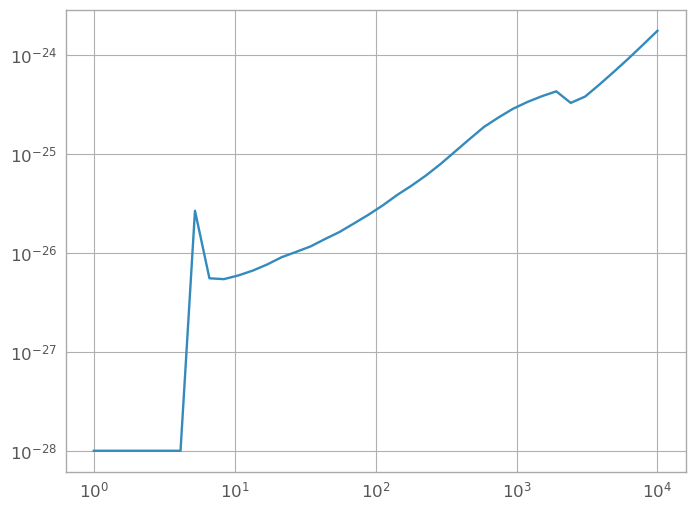

In [19]:
plt.loglog(mauro[0:, 0], mauro[0:, 1], label='Di Mauro (14yr data)')


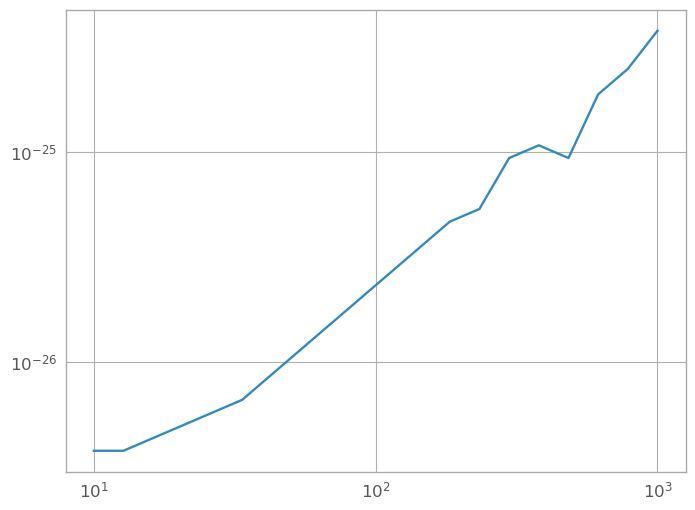

In [12]:
plt.loglog(ulm[0], ulm[1])


In [11]:
ulm[1]

array([3.76493581e-27, 3.76493581e-27, 4.32876128e-27, 4.97702356e-27,
       5.72236766e-27, 6.57933225e-27, 8.69749003e-27, 1.14975700e-26,
       1.51991108e-26, 2.00923300e-26, 2.65608778e-26, 3.51119173e-26,
       4.64158883e-26, 5.33669923e-26, 9.32603347e-26, 1.07226722e-25,
       9.32603347e-26, 1.87381742e-25, 2.47707636e-25, 3.76493581e-25])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


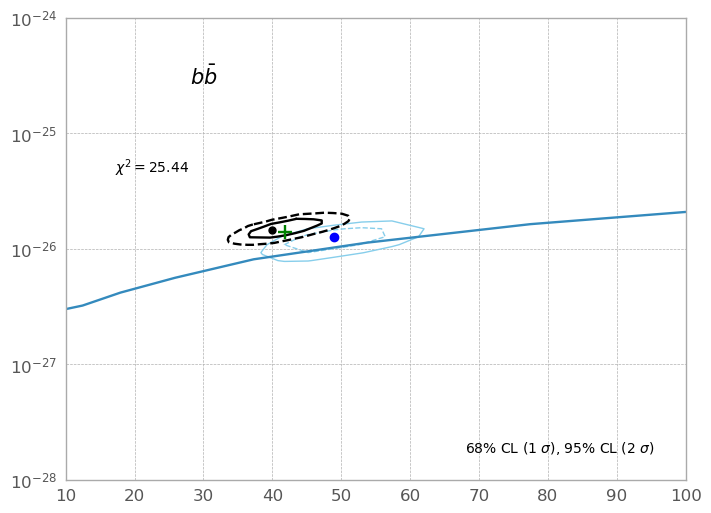

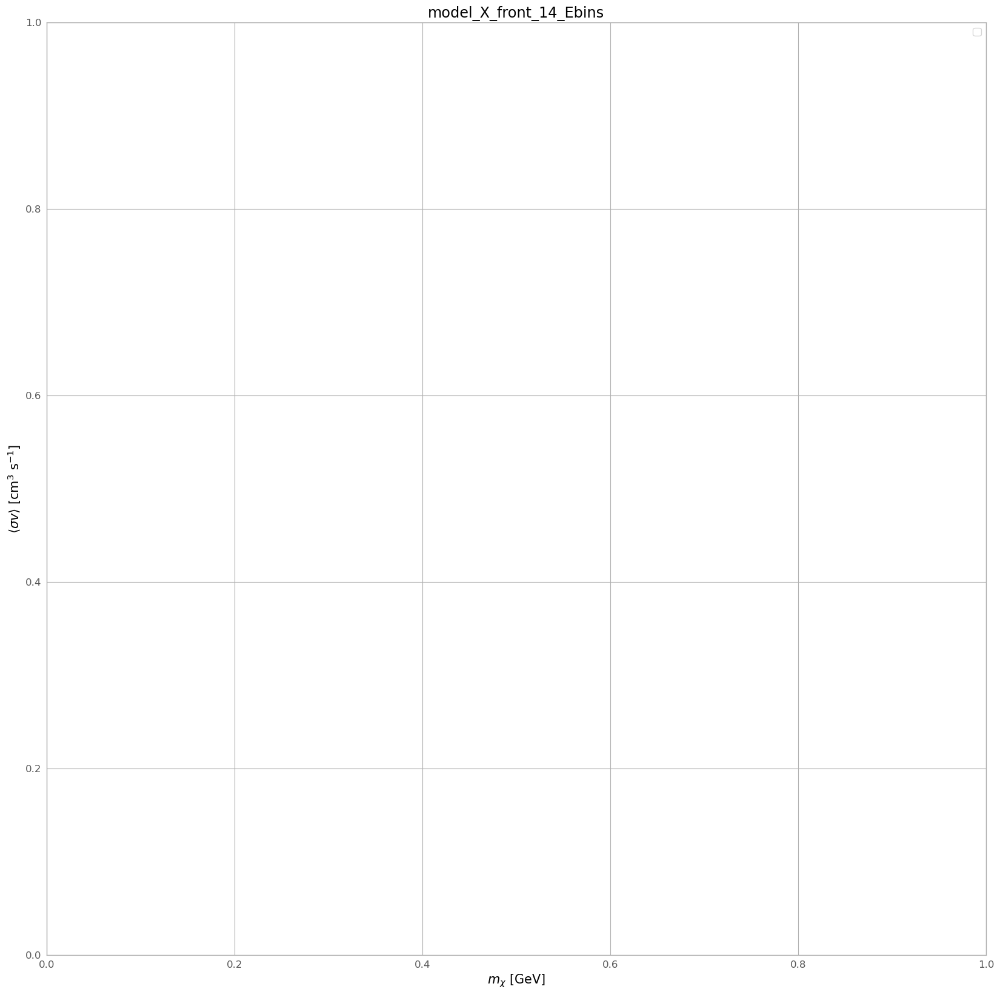

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


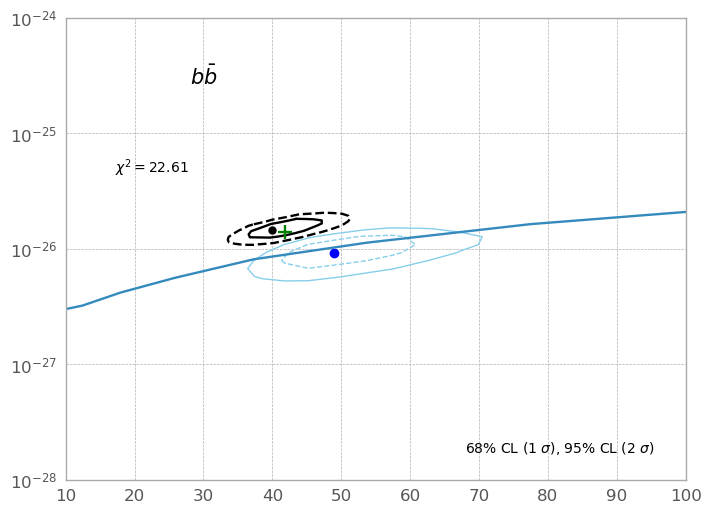

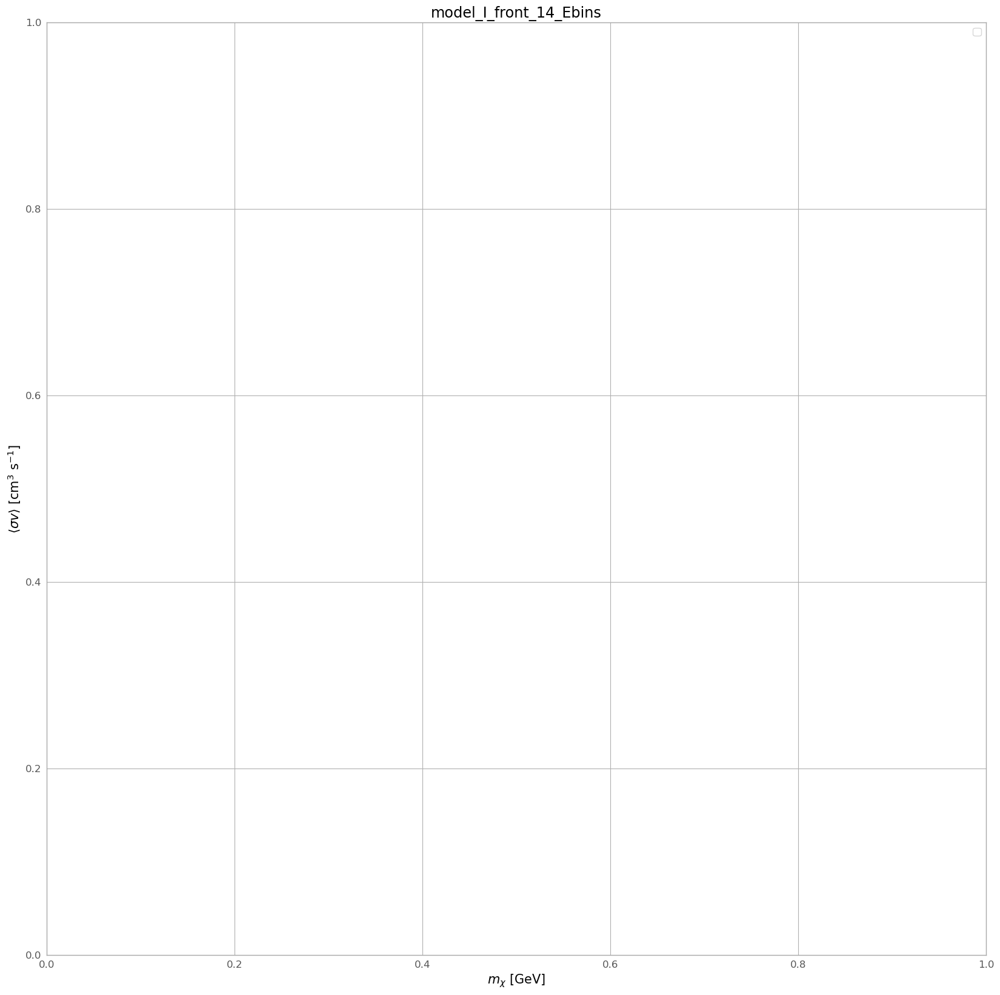

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


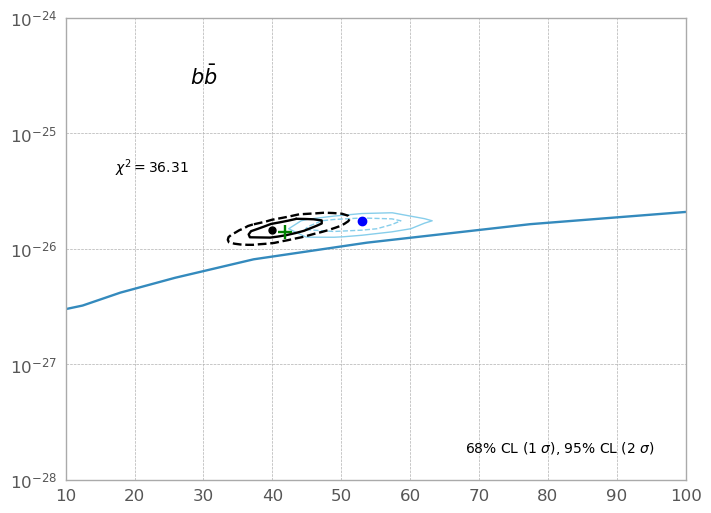

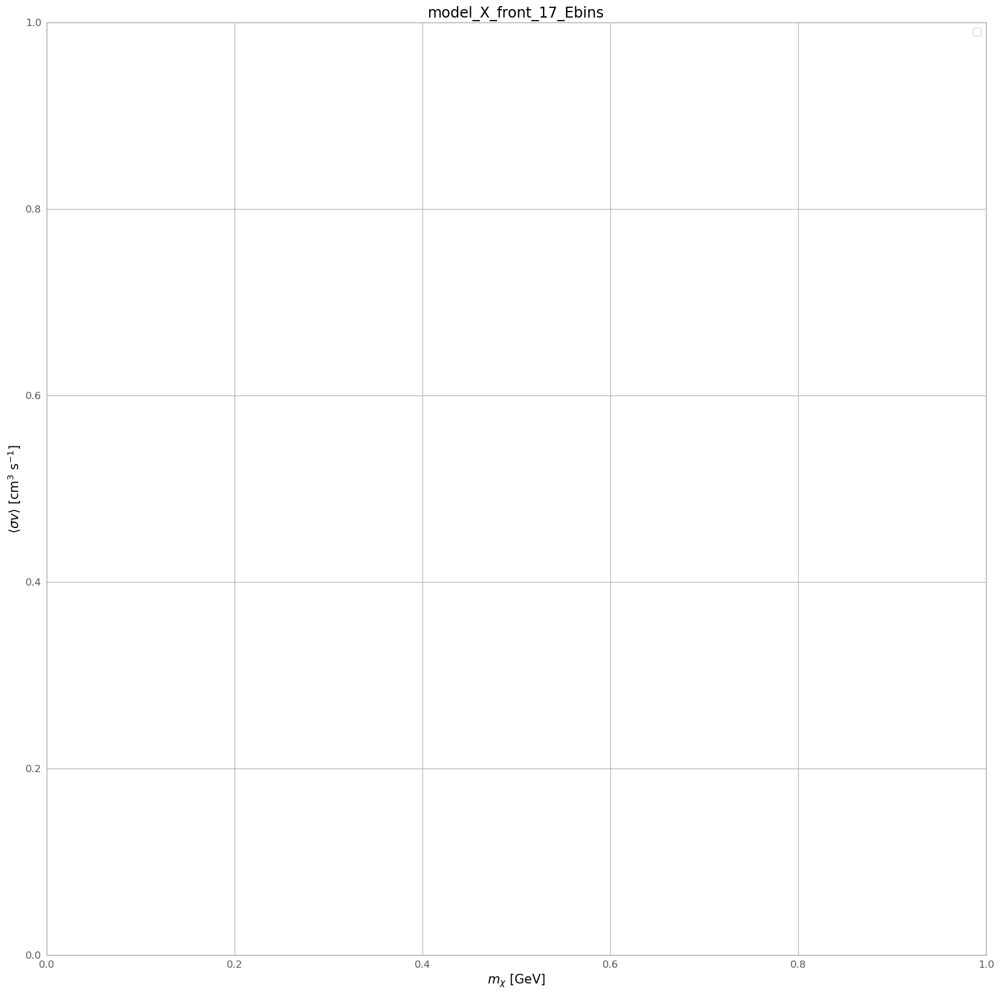

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


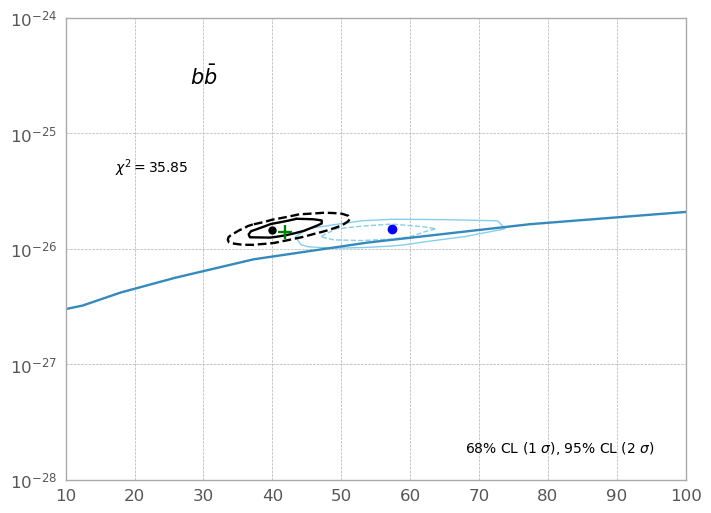

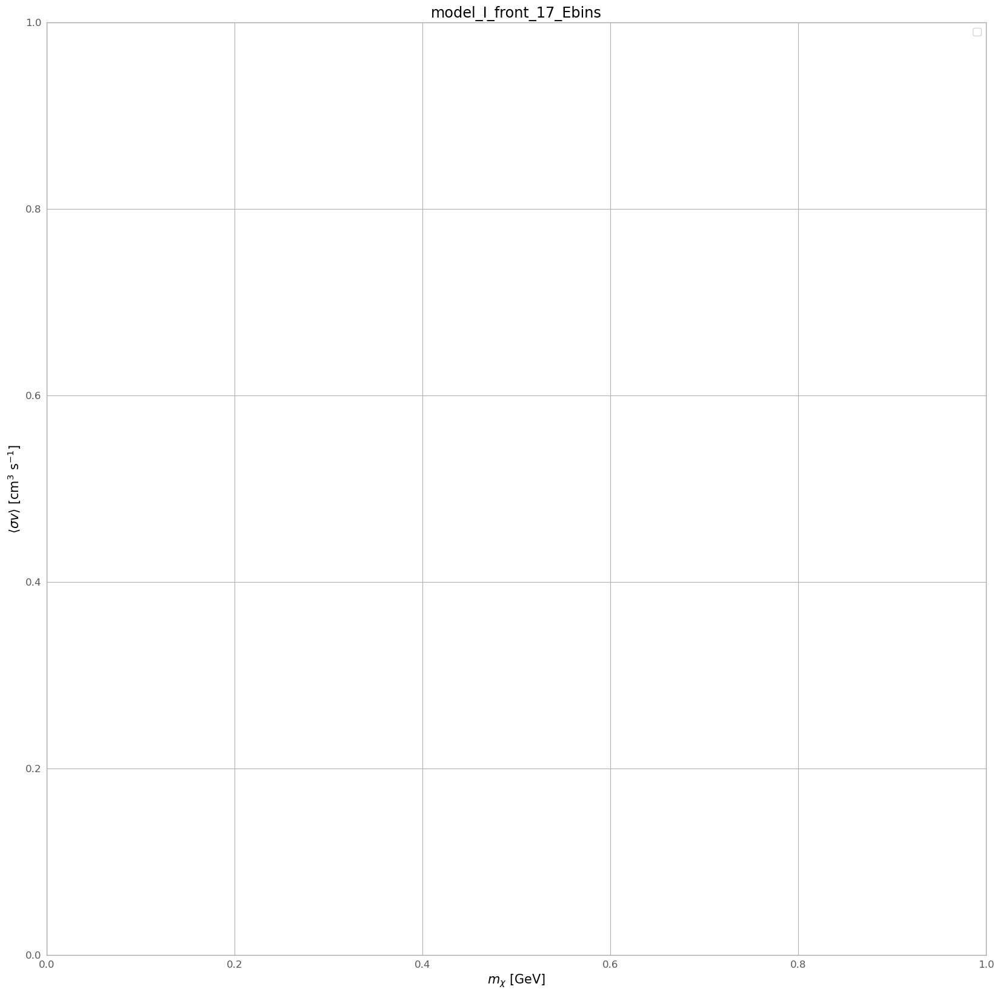

KeyboardInterrupt: 

In [26]:
for front in ['front', 'front_back']:
    for energy_bin_length in ['14', '17']:
        for model in ['X', 'I']:
            # front='front'
            # energy_bin_length='17'
            
            def chi_square_models(dm_mass, sigma_v, model):
                
                warnings.simplefilter("ignore", category=RuntimeWarning)  
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626 #For ROI 40x40 masked innter |b| < 2 degree
                
                g=np.loadtxt(f'/home/sanghwan/FermiLAT/Sanghwan/GCE_model_{model}_{front}_16yr_cholis.dat')
            
                bin_length = int(energy_bin_length)
                
                emeans=g[0:, 0][0:bin_length]
                GCE_data=g[0:, 1][0:bin_length]
            
                
                # systematic_upper = (g[0:, 3] - g[0:, 1])[0:bin_length]
                # systematic_lower = (g[0:, 1] - g[0:, 2])[0:bin_length]
            
                statistical_uncertainty = g[0:, 2][0:bin_length]
                
                #d_u = (g[0:, 4] - g[0:, 1])#[0:14]
                #d_l = (g[0:, 1] - g[0:, 3])#[0:14]
                
             
                #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
                #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
                #prompt_dat = Interpolator(dm_mass).interpolated_table()
                prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
                #prompt_dat = Interpolator(dm_mass).interpolated_table()
                
                J_factor=3.5251837158376415e+21 #Check needed
                sr=0.4288213187542626
            
                #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value='extrapolate', bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
                data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
                #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='cubic')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
            
                #data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)
            
                data = data(emeans)
                data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
                
                #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)
            
                #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
                #for i in range(0, len(emeans), 1):
                    #GCE_data_err[i] = np.max([d_u[i], d_l[i]])
                #data = data[0:bin_length]
                #GCE_data = GCE_data[0:bin_length]
                
                #cov=(np.diag(GCE_data_err[0:17])**2 + np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy"))
                cov=np.diag(statistical_uncertainty[0:bin_length])**2 + (np.load(f"/home/sanghwan/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_{energy_bin_length}x{energy_bin_length}_{front}{'_model_I'}_16yr.npy") )
                #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
                inv_cov=np.linalg.inv(cov)
            
            
                
                delta = data - GCE_data
                return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)
            
            #model='X'
            def chi_square(dm_mass, sigmav):
                return chi_square_models(dm_mass, sigmav, model)
            warnings.filterwarnings("ignore")
            
            sigmav_vec=np.logspace(-27, -25, 30)
            
            mass_vec = np.logspace(np.log10(10), np.log10(100), 30)
            
            
            DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
            chi_square_vec=np.vectorize(chi_square)
            
            
            
            chi_square_values = chi_square_vec(DM_mass, Sigmav)
            
            
            min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
            min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
            best_fit_dm=DM_mass[min_index_2d]
            best_fit_sigmav=Sigmav[min_index_2d]
            min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
            
            
            one_sigma_threshold=min_chi2 + 2.30
            two_sigma_threshold=min_chi2 + 6.18
            
            chi_square_results=chi_square_vec(DM_mass, Sigmav)
            
            
            
            plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
            #plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')
            plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024)')

            ulm_16 = np.loadtxt('./all_sky/Dwarf_galaxy_data/Upper_limit_data/bb_16yr.dat')
            ulm_14 = np.loadtxt('./all_sky/Dwarf_galaxy_data/Upper_limit_data/bb_14yr.dat')
            plt.plot(ulm_16[0], ulm_16[1], label='30 dSphs upper limit (16yr data)')
            plt.yscale('log')
            plt.xscale('linear')
            
            plt.xlim(10, 100)
            plt.ylim(1e-28, 1e-24)
            
            #plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')
            
            plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
            
            plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
                     verticalalignment='bottom', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
                     verticalalignment='top', horizontalalignment='right',
                     transform=plt.gca().transAxes)
            
            #plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
            
            #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
            
                     verticalalignment='top', horizontalalignment='left',
                     transform=plt.gca().transAxes)
            
            
            import matplotlib.pyplot as plt
            import pandas as pd
            
            solid_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
            solid_line_x = solid_line_data['x']
            solid_line_y = solid_line_data['y']*(10**-26)
            
            dashed_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
            dashed_line_x = dashed_line_data['x']
            dashed_line_y = dashed_line_data['y']*(10**-26)
            
            point_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
            point_x = point_data['x']
            point_y = point_data['y']*(10**-26)
            
            rectangle_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
            rectangle_x = rectangle_data['x']
            rectangle_y = rectangle_data['y']
            
            point2_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
            point2_x = point2_data['x']
            point2_y = point2_data['y']
            
            errorbar_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
            error_x = errorbar_data['x']
            error_y = errorbar_data['y']
            error_yerr = errorbar_data['yerr']
            
            plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black')
            plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black')
            plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)
            
            plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
            # plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')
            plt.figure(figsize=(20, 20))
            plt.title(f"model_{model}_{front}_{energy_bin_length}_Ebins")
            plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
            plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
            plt.legend()
            plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}_bb_16yr_comparison.png', bbox_inches='tight', dpi=300)
            plt.show()
            
            #plt.title("DM interpretation of GCE for model I", fontsize=13)
            
                
                
                


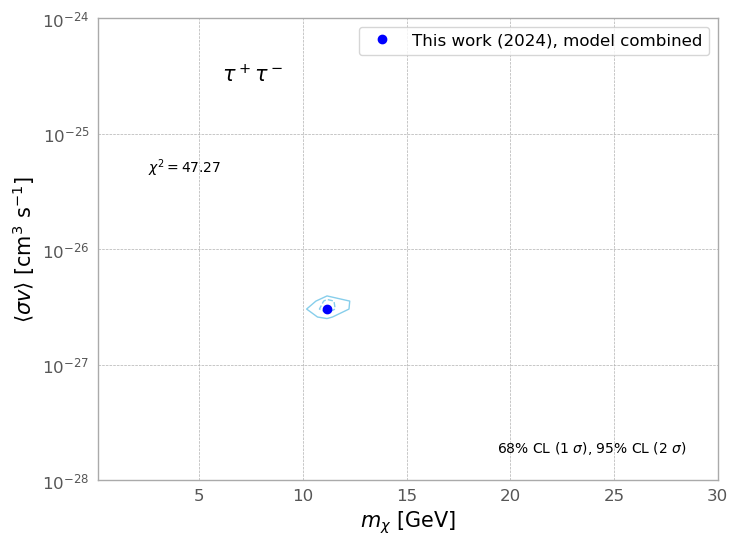

In [76]:
model='X'
def chi_square(dm_mass, sigmav):
    return chi_square_models(dm_mass, sigmav, model)
warnings.filterwarnings("ignore")

sigmav_vec=np.logspace(-27, -25, 30)

mass_vec = np.logspace(np.log10(0.1), np.log10(50), 30)


DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
chi_square_vec=np.vectorize(chi_square)



chi_square_values = chi_square_vec(DM_mass, Sigmav)


min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
best_fit_dm=DM_mass[min_index_2d]
best_fit_sigmav=Sigmav[min_index_2d]
min_chi2=chi_square(best_fit_dm, best_fit_sigmav)


one_sigma_threshold=min_chi2 + 2.30
two_sigma_threshold=min_chi2 + 6.18

chi_square_results=chi_square_vec(DM_mass, Sigmav)



plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')


plt.yscale('log')
plt.xscale('linear')

plt.xlim(0.1, 30)
plt.ylim(1e-28, 1e-24)

#plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

#plt.text(0.2, 0.90, r'$b \bar{b}$', fontsize=15, color='black',
plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',

#plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',

         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)


import matplotlib.pyplot as plt
import pandas as pd

# solid_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
# solid_line_x = solid_line_data['x']
# solid_line_y = solid_line_data['y']*(10**-26)

# dashed_line_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
# dashed_line_x = dashed_line_data['x']
# dashed_line_y = dashed_line_data['y']*(10**-26)

# point_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
# point_x = point_data['x']
# point_y = point_data['y']*(10**-26)

# rectangle_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
# rectangle_x = rectangle_data['x']
# rectangle_y = rectangle_data['y']

# point2_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
# point2_x = point2_data['x']
# point2_y = point2_data['y']

# errorbar_data = pd.read_csv('/home/sanghwan/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
# error_x = errorbar_data['x']
# error_y = errorbar_data['y']
# error_yerr = errorbar_data['yerr']

# plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black')
# plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black')
# plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)

#plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
#plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')
#plt.figure(figsize=(20, 20))
plt.legend()

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}_tau_16yr.png', bbox_inches='tight', dpi=300)
plt.show()

#plt.title("DM interpretation of GCE for model I", fontsize=13)

    
    
    


In [73]:
best_fit_dm, best_fit_sigmav

(11.155639876771923, 3.039195382313195e-27)

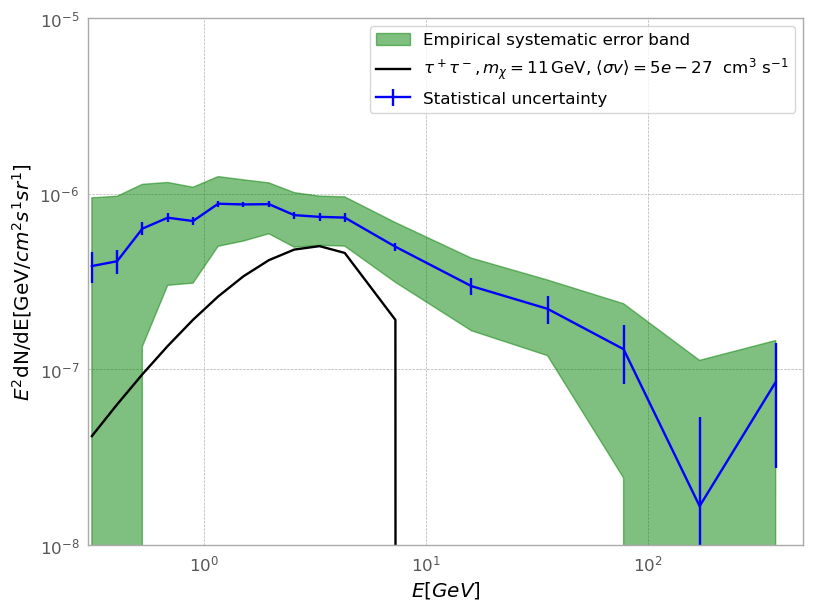

In [121]:
#plt.errorbar(output[0:, 0], output[0:, 1], yerr=[sys_low, sys_upp], label='Max Min envelops', color='blue')
output = np.loadtxt('./GCE_model_X_front_16yr_cholis.dat')

cov = np.load('./GC_analysis/covariance/approx_covariance_17x17_16yr.npy')
plt.fill_between(output[0:, 0], output[0:, 1] - np.sqrt(np.diag(cov)), output[0:, 1] + np.sqrt(np.diag(cov)), color='green', alpha=0.5, label='Empirical systematic error band')

plt.errorbar(output[0:, 0], output[0:, 1], output[0:, 2], label='Statistical uncertainty', color='blue')

#plt.plot(Interpolator(78).interpolated_table()[0], Interpolator(78).interpolated_table()[0]**2*Interpolator(110).interpolated_table()[1]*(5e-26)/78**2 *3*10**21, label=r'4$b$ annihilation')

mass = 11
prompt_dat=exctractcirellitable(mass, 10, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes
#prompt_dat = Interpolator(mass).interpolated_table()
prompt_dat_interp = interp1d(prompt_dat[0], prompt_dat[1], bounds_error=False, fill_value=0)



plt.plot(output[0:, 0], output[0:, 0]**2*( prompt_dat_interp(output[0:, 0])/mass**2 )* 3*10**21 * 5e-27/0.4288213187542626, color='black',label=r'$ \tau^+ \tau^-, m_\chi = 11 \,$GeV, $\langle \sigma v \rangle = 5e-27$  cm$^3$ s$^{-1}$')

#plt.title("GCE fluxes with different GDE models", fontsize=14)
plt.xscale("log")  # Log-scale for Energy
plt.yscale("log")  # Log-scale for Flux
#plt.legend(fontsize=10)
plt.grid(True, which="major", linestyle="--", linewidth=0.5)
plt.ylim(1e-8, 1e-5)
plt.xlim(0.3, 500)
# Show the plot
plt.tight_layout()
plt.legend()

plt.ylabel(f'$E^2$dN/dE[GeV/$cm^2 s^1 sr^1$]')
plt.xlabel(f'$E[GeV$]')

plt.show()



In [7]:
chi_square_models(45, 1e-26, 'X')

115.13975577964753

In [14]:
front='front_back'
energy_bin_length='14' #'17'

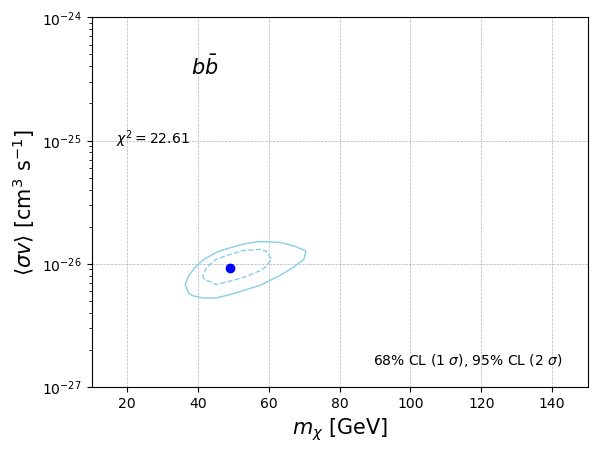

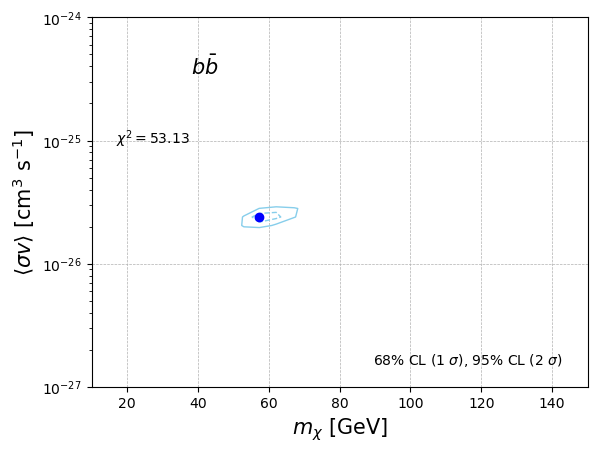

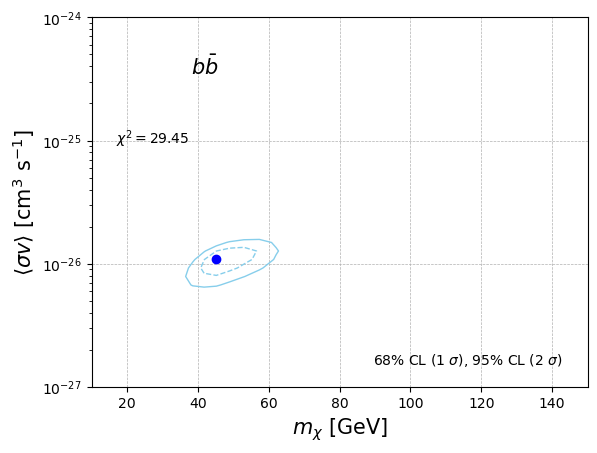

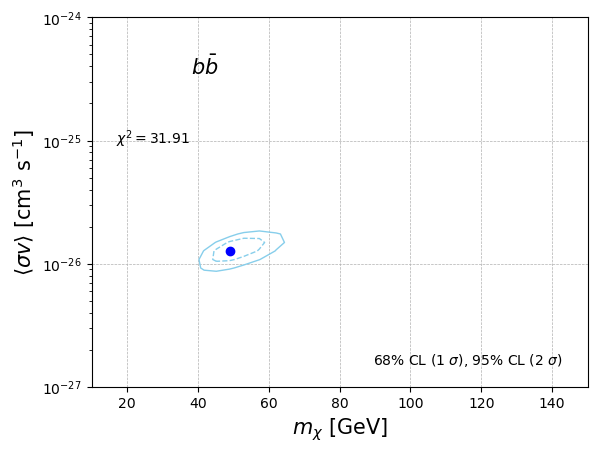

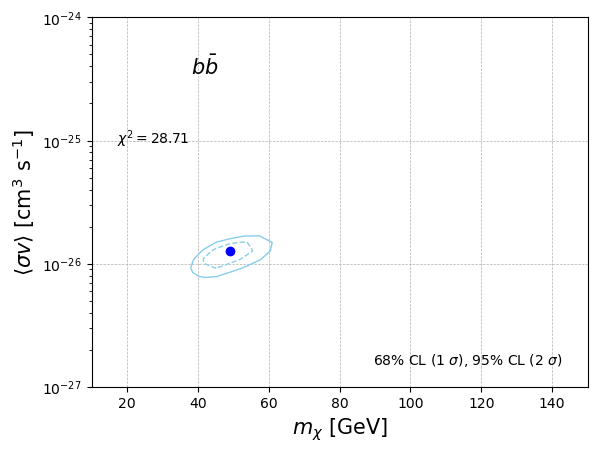

...

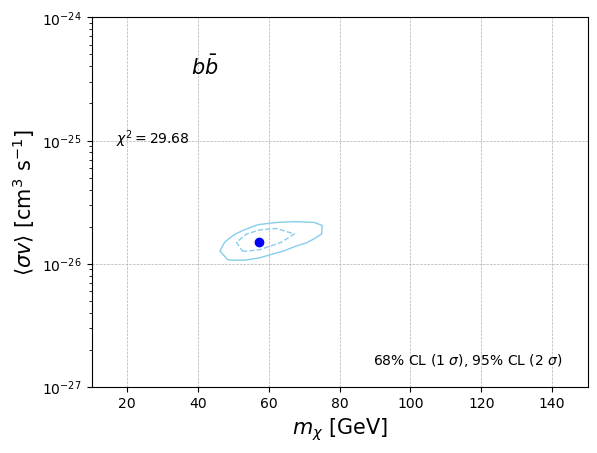

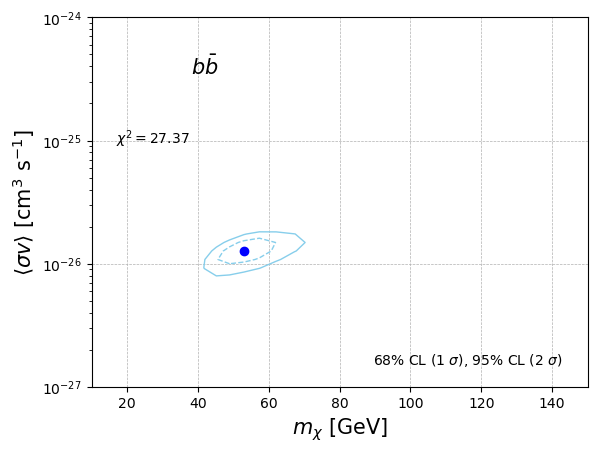

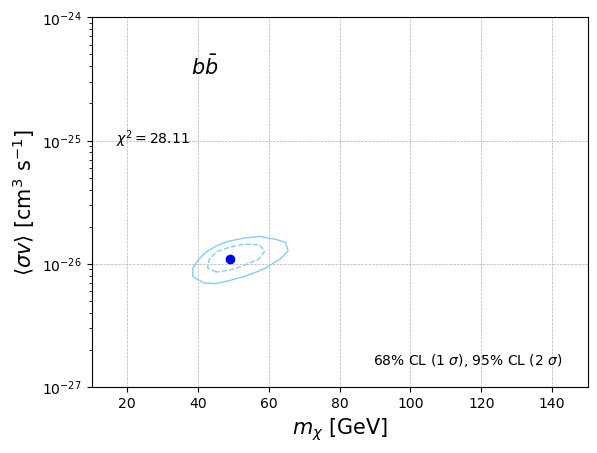

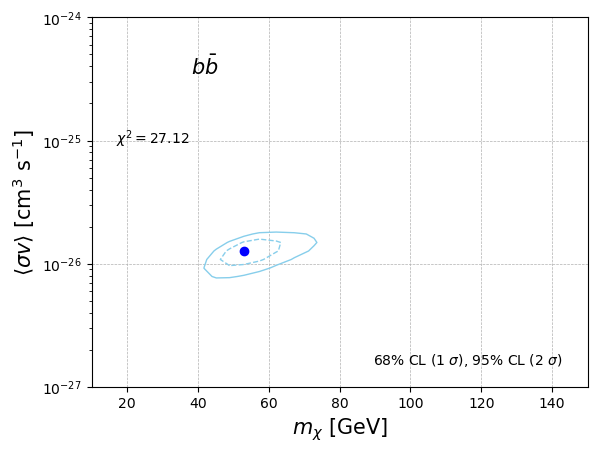

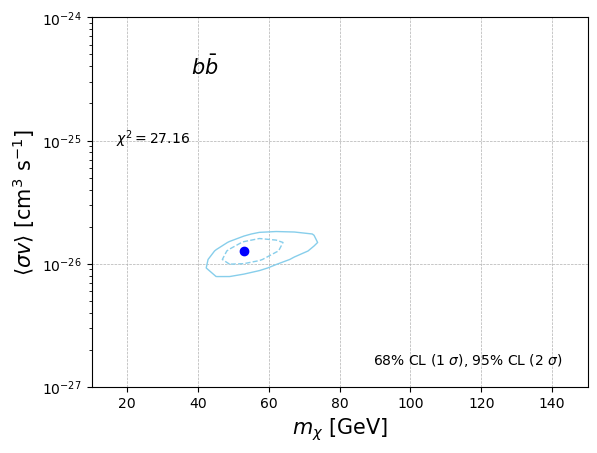

In [531]:
for model in existing_list:
    
    def chi_square(dm_mass, sigmav):
        return chi_square_models(dm_mass, sigmav, model)
    
    sigmav_vec=np.logspace(-27, -25, 30)
    
    mass_vec = np.logspace(np.log10(10), np.log10(100), 30)
    
    
    DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
    chi_square_vec=np.vectorize(chi_square)
    
    
    
    chi_square_values = chi_square_vec(DM_mass, Sigmav)
    
    
    min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
    min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
    best_fit_dm=DM_mass[min_index_2d]
    best_fit_sigmav=Sigmav[min_index_2d]
    min_chi2=chi_square(best_fit_dm, best_fit_sigmav)
    
    
    one_sigma_threshold=min_chi2 + 2.30
    two_sigma_threshold=min_chi2 + 6.18
    
    chi_square_results=chi_square_vec(DM_mass, Sigmav)
    
    
    
    #ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
    #ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')
    
    
    plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')
    
    
    plt.yscale('log')
    plt.xscale('linear')
    
    plt.xlim(10, 150)
    plt.ylim(1e-27, 1e-24)
    
    #plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')
    
    plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid
    
    plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
             verticalalignment='bottom', horizontalalignment='right',
             transform=plt.gca().transAxes)
    plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
             verticalalignment='top', horizontalalignment='right',
             transform=plt.gca().transAxes)
    
    plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
    #plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
    
             verticalalignment='top', horizontalalignment='left',
             transform=plt.gca().transAxes)
    
    plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
    plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
    plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}_16yr.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    #plt.title("DM interpretation of GCE for model I", fontsize=13)
    


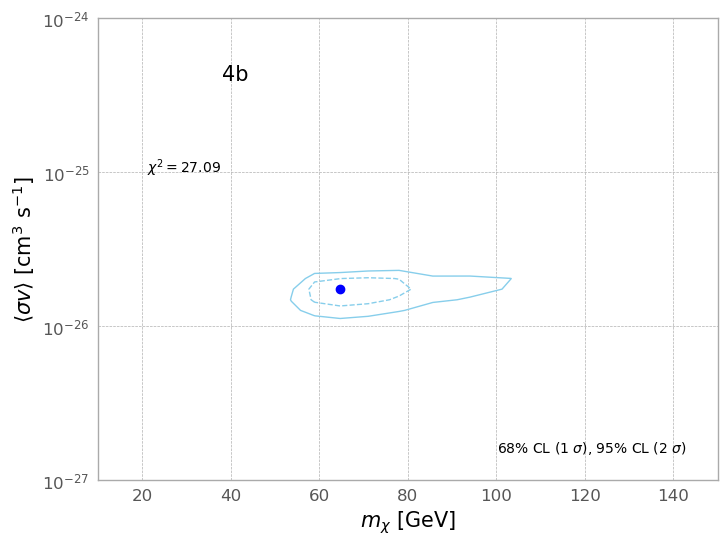

In [15]:
model='I'
def chi_square(dm_mass, sigmav):
    return chi_square_models(dm_mass, sigmav, model)

sigmav_vec=np.logspace(-27, -25, 30)

mass_vec = np.logspace(np.log10(10), np.log10(150), 30)


DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
chi_square_vec=np.vectorize(chi_square)



chi_square_values = chi_square_vec(DM_mass, Sigmav)


min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
best_fit_dm=DM_mass[min_index_2d]
best_fit_sigmav=Sigmav[min_index_2d]
min_chi2=chi_square(best_fit_dm, best_fit_sigmav)


one_sigma_threshold=min_chi2 + 2.30
two_sigma_threshold=min_chi2 + 6.18

chi_square_results=chi_square_vec(DM_mass, Sigmav)



plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')


plt.yscale('log')
plt.xscale('linear')

plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)

#plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'4b', fontsize=15, color='black',
#plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',

         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}_4b_16yr.png', bbox_inches='tight', dpi=300)
plt.show()

#plt.title("DM interpretation of GCE for model I", fontsize=13)



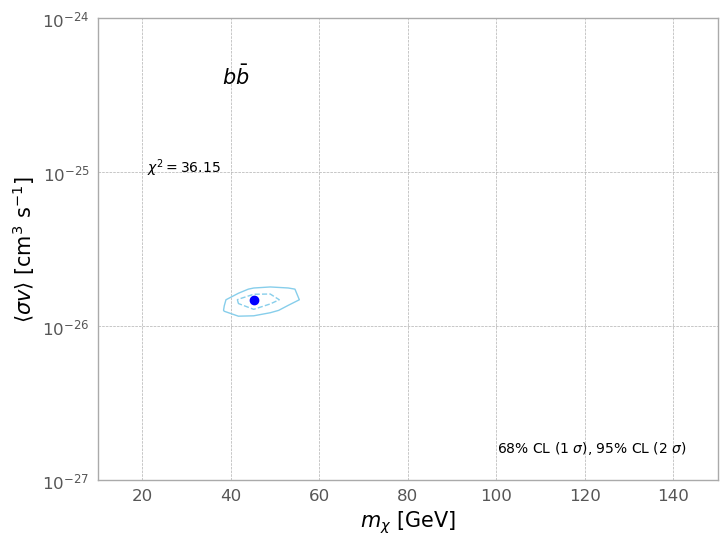

In [3]:
model='X'
def chi_square(dm_mass, sigmav):
    return chi_square_models(dm_mass, sigmav, model)

import warnings
warnings.filterwarnings("ignore")

sigmav_vec=np.logspace(-27, -25, 30)

mass_vec = np.logspace(np.log10(10), np.log10(100), 30)


DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
chi_square_vec=np.vectorize(chi_square)



chi_square_values = chi_square_vec(DM_mass, Sigmav)


min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
best_fit_dm=DM_mass[min_index_2d]
best_fit_sigmav=Sigmav[min_index_2d]
min_chi2=chi_square(best_fit_dm, best_fit_sigmav)


one_sigma_threshold=min_chi2 + 2.30
two_sigma_threshold=min_chi2 + 6.18

chi_square_results=chi_square_vec(DM_mass, Sigmav)



plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')


plt.yscale('log')
plt.xscale('linear')

plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)

#plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
#plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',

         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
#plt.savefig(f'./GC_analysis/GCE_plots/GDE_model_{model}_{front}_E_{energy_bin_length}_16yr.png', bbox_inches='tight', dpi=300)
plt.show()

#plt.title("DM interpretation of GCE for model I", fontsize=13)



In [475]:
best_fit_dm, best_fit_sigmav

(48.93900918477494, 1.4873521072935116e-26)

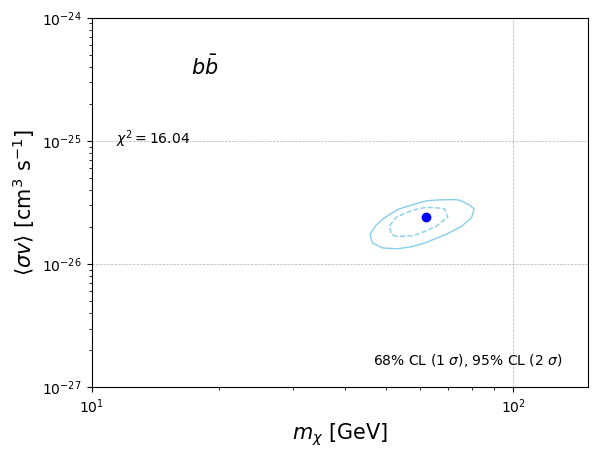

In [422]:
sigmav_vec=np.logspace(-27, -25, 30)

mass_vec = np.logspace(np.log10(10), np.log10(100), 30)


DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
chi_square_vec=np.vectorize(chi_square)



chi_square_values = chi_square_vec(DM_mass, Sigmav)


min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
best_fit_dm=DM_mass[min_index_2d]
best_fit_sigmav=Sigmav[min_index_2d]
min_chi2=chi_square(best_fit_dm, best_fit_sigmav)


one_sigma_threshold=min_chi2 + 2.30
two_sigma_threshold=min_chi2 + 6.18

chi_square_results=chi_square_vec(DM_mass, Sigmav)



#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')


plt.yscale('log')
plt.xscale('log')

plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)

#plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
#plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',

         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

plt.show()

#plt.title("DM interpretation of GCE for model I", fontsize=13)



In [423]:
best_fit_dm, best_fit_sigmav

(62.10169418915616, 2.395026619987491e-26)

In [761]:
def chi_square_I(dm_mass, sigma_v):
    warnings.simplefilter("ignore", category=RuntimeWarning)
    #prompt_dat=exctractcirellitable(dm_mass, 23, 'gammas', 'Yes') #EW yes and channel 10 is for tau
    #prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 13 is for b
    #prompt_dat=exctractcirellitable(dm_mass, 10, 'gammas', 'Yes') #EW no and channel 4 is for tau
    #prompt_dat=exctractcirellitable(dm_mass, 6, 'gammas', 'No') #EW no and channel 6 is for c
    #prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'No') #EW no and channel 13 is for h
    #prompt_dat=exctractcirellitable(dm_mass, 7, 'gammas', 'No') #EW no and channel 7 is for b
    #prompt_dat=prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
    #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
    #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
    
    #prompt_dat = Interpolator(dm_mass).interpolated_table()

    
    
    

    #v=np.loadtxt('/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_ModelI_flux_Inner40x40_masked_disk.dat')
    v=np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Model{"I"}_flux_Inner40x40_masked_disk.dat')
    #v=np.loadtxt(f'/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Model{"I"}_flux_Inner40x40_masked_disk.dat')
    #v=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_15yr_cholis.dat')
    emeans=v[0:, 0]
    GCE_data = v[0:, 1]
    #d=np.loadtxt('/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Statistical_errors.dat')[0:, 1]
    #d=(v[0:, 3] - v[0:, 2])#/2
    d_u = v[0:, 3] - v[0:, 1] 
    d_l = v[0:, 1] - v[0:, 2]
    
    
    #d=np.diag(d**2)
    
    
        
    #J_factor=5.068061692242978e+21 #Check needed
    
    #sr=0.9741042162268921
    
    J_factor=3.5251837158376415e+21 #Check needed
    sr=0.4288213187542626
    
    #data = interp1d(prompt_dat[0], prompt_dat[1]*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    #data = interp1d(prompt_dat[0], prompt_dat[1]*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    #data = interp1d(prompt_dat[0], prompt_dat[1], fill_value=0, bounds_error=False, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    
    #data = interp1d(np.log(prompt_dat[0]), np.log(prompt_dat[1]), fill_value=0, bounds_error=False)#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    #data = interp1d(prompt_dat[0], prompt_dat[1], fill_value=0, bounds_error=False)#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    #data = interp1d(prompt_dat[0], prompt_dat[1], fill_value='extrapolate', kind='linear')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    #data = prompt_dat
    #data = interp1d(prompt_dat[0:, 0], prompt_dat[0:, 1]*(sigma_v/(dm_mass**2))*J_factor/(2*sr), fill_value='extrapolate')
    #data = np.exp(data(np.log(emeans)))
    #data = data(emeans)
    #data[data<0] = 0
    #data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
    
    
    
    #prompt_dat = Interpolator(dm_mass).interpolated_table()
    prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes

    
    J_factor=3.5251837158376415e+21 #Check needed
    sr=0.4288213187542626

    #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    #data = (emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr))[0:14]
    
    data = prompt_dat[0:14]
    data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
    #data = data[0:14]
    
    
    
    #err = np.where(data > GCE_data, d_u, d_l)
    err = np.where(data > GCE_data, d_u, d_l)
    #err = (d_u + d_l)/2
    for i in range(0, len(err), 1):
        err[i] = np.max([d_u[i], d_l[i]])

    
    d = np.diag(err**2)
    #d=np.diag(np.loadtxt('/home/FermiLAT/Sanghwan/GC_14yr/data/GCE_Statistical_errors.dat')[0:, 1])**2


    corr_cov = np.load("/home/FermiLAT/Sanghwan/GC_14yr/data/cov_mat_21Dec02.npy")#load the full systematic errors covariance matrix
    corr_covsvd = np.linalg.svd(corr_cov)

    cov_PCs = np.array([corr_covsvd[1][i]*np.outer(corr_covsvd[0].T[i], corr_covsvd[2][i]) for i in range(14)])

    def approxcovmatrix(p):
        out = np.zeros((14,14))
        if ((type(p)==int) & (p>0)):
            out += np.sum([cov_PCs[i] for i in range(p)], axis=0)
        return out
    
    cov_matrix=d + approxcovmatrix(4)
    
    inv_GCE_data_err_matrix=np.linalg.inv( cov_matrix )

    
    delta = data - GCE_data
    #return cov_matrix
    return delta.T@inv_GCE_data_err_matrix@delta
    #return np.sum(a*b*inv_GCE_data_err_matrix)
    #return (a.T@inv_GCE_data_err_matrix@b)

In [21]:
target_model="XLIX"
def chi_square(dm_mass, sigma_v):
    
    warnings.simplefilter("ignore", category=RuntimeWarning)  
    J_factor=3.5251837158376415e+21 #Check needed
    sr=0.4288213187542626
    
    extended_bin=True
    if extended_bin:
        bin_edge=17
    else:
        bin_edge=14
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_cholis.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_front_back_16yr_cholis.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_15yr_cholis.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_12yr_positive.dat')
    #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_positive_test.dat')

    g=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_{target_model}_front_back_16yr_cholis.dat')


    emeans=g[0:, 0][0:bin_edge]
    GCE_data=g[0:, 1][0:bin_edge]
    stat_uncertainty = g[0:, 2][0:bin_edge]
    
    #systematic_upper = g[0:, 3] - g[0:, 1]
    #systematic_lower = g[0:, 1] - g[0:, 2]
    
    d_u = (g[0:, 4] - g[0:, 1])[0:bin_edge]
    d_l = (g[0:, 1] - g[0:, 3])[0:bin_edge]
    
 
    #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
    #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
    #prompt_dat = Interpolator(dm_mass).interpolated_table()
    prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes

    
    J_factor=3.5251837158376415e+21 #Check needed
    sr=0.4288213187542626

    #data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
    #data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)

    data = prompt_dat[0:bin_edge]
    data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)
    
    #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)

    #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
    #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
    #GCE_data_err = (d_u + d_l)/2
    GCE_data_err = stat_uncertainty
    #for i in range(0, len(emeans), 1):
    #    GCE_data_err[i] = np.max([d_u[i], d_l[i]])
    data = data[0:bin_edge]
    GCE_data = GCE_data[0:bin_edge]

    #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2)
    if extended_bin:
        empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_front_back_16yr.npy')
        #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_16yr.npy')
        #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy')
        #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_12yr.npy')

    else:
        empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_12yr.npy')
        #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14.npy')
    cov=(empirical_cov + np.diag(GCE_data_err)**2)

    
    #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + (np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy")))
    #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
    inv_cov=np.linalg.inv(cov)


    
    
    delta = data - GCE_data
    return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)

In [22]:
chi_square(45, 1e-26)

166.3844714234913

In [764]:
chi_square_I(45, 1e-26)

17.389139866752554

In [6]:
chi_square(50, 1e-26)

24.29138372849277

In [199]:
med_mass=15
def chi_square_w(dm_mass, sigma_v):
    
    J_factor=3.5251837158376415e+21 #Check needed
    sr=0.4288213187542626
    
    data = np.loadtxt('/home/sanghwan/C.Weniger/covariance.dat')
    ebins = data[:,0:2]  # Energy bins [GeV]
    emeans = ebins.prod(axis=1)**0.5  # Geometric mean energy [GeV]
    de = ebins[:,1] - ebins[:,0]  # Energy bin width [GeV]
    flux = data[:,2]  # (Average flux)*E^2 in energy bin [GeV/cm2/s/sr]
    flux_err = data[:,3]  # Flux error [GeV/cm2/s/sr]
    empirical_variance = data[:,4:28]  # Only empirical component [(GeV/cm2/s/sr)^2]
    full_variance = data[:,28:]  # Variance as it enters the spectral fit [(GeV/cm2/s/sr)^2]
    empirical_sigma = np.sqrt(np.diagonal(empirical_variance))  # Diagonal elements
    inv_GCE_data_err_matrix=np.linalg.inv(empirical_variance + np.diag(flux_err**2))


    
    #prompt_dat=prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
    prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau
    #prompt_dat = Interpolator(dm_mass).interpolated_table()

    
    
    J_factor=3.5251837158376415e+21 #Check needed
    sr=0.4288213187542626
    
    #data = interp1d(prompt_dat[0:, 0], prompt_dat[0:, 1]*(sigma_v/(dm_mass**2))*J_factor/(2*sr), fill_value='extrapolate')
    data = interp1d(prompt_dat[0], prompt_dat[1]*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')

    data = data(emeans)*emeans**2
    
    
    data[data<=0] = 0
    
    a, b = np.meshgrid(data - flux, data - flux)
        
    
    return np.sum(a*b*inv_GCE_data_err_matrix) 
    #return np.sum((flux - data)**2/flux_err**2)

In [39]:
for target_model in ['X']:#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']:

    def chi_square(dm_mass, sigma_v):

        warnings.simplefilter("ignore", category=RuntimeWarning)  
        J_factor=3.5251837158376415e+21 #Check needed
        sr=0.4288213187542626

        extended_bin=False
        if extended_bin:
            bin_edge=17
        else:
            bin_edge=14
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_front_back_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_15yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_12yr_positive.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_positive_test.dat')

        g=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_{target_model}_front_back_16yr_cholis.dat')


        emeans=g[0:, 0][0:bin_edge]
        GCE_data=g[0:, 1][0:bin_edge]
        stat_uncertainty = g[0:, 2][0:bin_edge]

        #systematic_upper = g[0:, 3] - g[0:, 1]
        #systematic_lower = g[0:, 1] - g[0:, 2]

        d_u = (g[0:, 4] - g[0:, 1])[0:bin_edge]
        d_l = (g[0:, 1] - g[0:, 3])[0:bin_edge]


        #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
        #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
        prompt_dat = Interpolator(dm_mass).interpolated_table()
        #prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes


        J_factor=3.5251837158376415e+21 #Check needed
        sr=0.4288213187542626

        data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)

        #data = prompt_dat[0:bin_edge]
        #data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)

        #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)

        #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
        #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
        #GCE_data_err = (d_u + d_l)/2
        GCE_data_err = stat_uncertainty
        #for i in range(0, len(emeans), 1):
        #    GCE_data_err[i] = np.max([d_u[i], d_l[i]])
        data = data[0:bin_edge]
        GCE_data = GCE_data[0:bin_edge]

        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2)
        if extended_bin:
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_front_back_model_X_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_12yr.npy')

        else:
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_12yr.npy')
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_front_back_model_X_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14.npy')
        cov=(empirical_cov + np.diag(GCE_data_err)**2)


        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + (np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy")))
        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
        inv_cov=np.linalg.inv(cov)




        delta = data - GCE_data
        return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)





    #sigmav_vec=np.logspace(-28, -26, 120)
    sigmav_vec=np.logspace(-27, -25, 30)
    #sigmav_vec = np.logspace(-26, -23, 120)
    #sigmav_vec=np.logspace(-28, -26, 30)

    #mass_vec=np.loadtxt('/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/SFDM_h2h2_dm_mass.txt')
    #mass_vec=mass_vec[mass_vec>=med_mass]
    mass_vec = np.logspace(np.log10(10), np.log10(80), 30)
    #mass_vec = np.logspace(np.log10(30), np.log10(120), 120)
    #mass_vec = np.logspace(np.log10(1), np.log10(50), 30)
    #mass_vec = np.logspace(np.log10(125), np.log10(150), 120)

    #mass_vec = np.linspace(20, 50, 30)

    #mass_vec=np.logspace(np.log10(1), np.log10(30), 30)
    #mass_vec=np.logspace(np.log10(1), np.log10(30), 120)
    #mass_vec=np.logspace(np.log10(1), np.log10(10), 120)
    #mass_vec=np.logspace(np.log10(2), np.log10(5), 30)
    #mass_vec=np.logspace(np.log10(120), np.log10(180), 60)

    DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
    chi_square_vec=np.vectorize(chi_square)

    #chi_square_vec_w=np.vectorize(chi_square_w)

    #chi_square_vec_I=np.vectorize(chi_square_I)

    chi_square_values = chi_square_vec(DM_mass, Sigmav)

    #chi_square_values_w = chi_square_vec_w(DM_mass, Sigmav)

    #chi_square_values_I = chi_square_vec_I(DM_mass, Sigmav)

    min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
    min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
    best_fit_dm=DM_mass[min_index_2d]
    best_fit_sigmav=Sigmav[min_index_2d]
    min_chi2=chi_square(best_fit_dm, best_fit_sigmav)


    """
    min_index_w=np.argmin(chi_square_vec_w(DM_mass, Sigmav))
    min_index_2d_w = np.unravel_index(min_index_w, chi_square_values_w.shape)
    best_fit_dm_w=DM_mass[min_index_2d_w]
    best_fit_sigmav_w=Sigmav[min_index_2d_w]
    min_chi2_w=chi_square_w(best_fit_dm_w, best_fit_sigmav_w)
    """

    #min_index_I=np.argmin(chi_square_vec_I(DM_mass, Sigmav))
    #min_index_2d_I = np.unravel_index(min_index_I, chi_square_values_I.shape)
    #best_fit_dm_I=DM_mass[min_index_2d_I]
    #best_fit_sigmav_I=Sigmav[min_index_2d_I]
    #min_chi2_I=chi_square_I(best_fit_dm_I, best_fit_sigmav_I)



    one_sigma_threshold=min_chi2 + 2.30
    two_sigma_threshold=min_chi2 + 6.18

    chi_square_results=chi_square_vec(DM_mass, Sigmav)


    """
    one_sigma_threshold_w=min_chi2_w + 2.30
    two_sigma_threshold_w=min_chi2_w + 6.18

    chi_square_w_results=chi_square_vec_w(DM_mass, Sigmav)
    """

    #one_sigma_threshold_I=min_chi2_I + 2.30
    #two_sigma_threshold_I=min_chi2_I + 6.18

    #chi_square_I_results=chi_square_vec_I(DM_mass, Sigmav)


    ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')



    #plt.pcolormesh(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
    #plt.pcolormesh(mass_vec, sigmav_vec, chi_square_results, vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
    #plt.colorbar()
    plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model {target_model}')
    #plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([one_sigma_threshold_w ,two_sigma_threshold_w]), colors='limegreen', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'go', label='F.Calore et al (2015)')

    #plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I ,two_sigma_threshold_I]), colors='limegreen', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)')


    plt.yscale('log')
    plt.xscale('log')
    #ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
    #plt.plot(ulm[0:, 0], ulm[0:, 1])
    #plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
    #plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
    #plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
    #plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
    #plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
    #plt.xlim(0, 200)
    #plt.ylim(1e-30, 1e-24)
    #plt.xlim(10, 150)
    #plt.ylim(1e-27, 1e-24)
    #plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')


    #plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


    plt.xlim(10, 150)
    plt.ylim(1e-27, 1e-24)
    plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

    plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

    plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
             verticalalignment='bottom', horizontalalignment='right',
             transform=plt.gca().transAxes)
    plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
             verticalalignment='top', horizontalalignment='right',
             transform=plt.gca().transAxes)

    plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
             verticalalignment='top', horizontalalignment='left',
             transform=plt.gca().transAxes)

    plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
    plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
    
    
    #plt.title("DM interpretation of GCE for model I", fontsize=13)



    import matplotlib.pyplot as plt
    import pandas as pd

    solid_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
    solid_line_x = solid_line_data['x']
    solid_line_y = solid_line_data['y']*(10**-26)

    dashed_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
    dashed_line_x = dashed_line_data['x']
    dashed_line_y = dashed_line_data['y']*(10**-26)

    point_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
    point_x = point_data['x']
    point_y = point_data['y']*(10**-26)

    rectangle_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
    rectangle_x = rectangle_data['x']
    rectangle_y = rectangle_data['y']

    point2_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
    point2_x = point2_data['x']
    point2_y = point2_data['y']

    errorbar_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
    error_x = errorbar_data['x']
    error_y = errorbar_data['y']
    error_yerr = errorbar_data['yerr']

    plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black', label='Solid Line')
    plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black', label='Dashed Line')
    plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)
    plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
    plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')
    #plt.figure(figsize=(20, 20))
    plt.legend()

    plt.savefig(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_{target_model}_front_back_16yr_bb_fit_results_14x14.png')
    plt.clf()

KeyboardInterrupt: 

In [63]:
for target_model in ['X']:#['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']:

    def chi_square(dm_mass, sigma_v):

        warnings.simplefilter("ignore", category=RuntimeWarning)  
        J_factor=3.5251837158376415e+21 #Check needed
        sr=0.4288213187542626

        extended_bin=True
        if extended_bin:
            bin_edge=17
        else:
            bin_edge=14
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_front_back_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_15yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_12yr_positive.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_positive_test.dat')

        g=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_{target_model}_front_back_16yr_cholis.dat')
        stat_uncertainty = g[0:, 2][0:bin_edge]

        g=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GDE_combined_results_front_back_16yr.dat')

        emeans=g[0:, 0][0:bin_edge]
        GCE_data=g[0:, 1][0:bin_edge]

        #systematic_upper = g[0:, 3] - g[0:, 1]
        #systematic_lower = g[0:, 1] - g[0:, 2]

        #d_u = (g[0:, 4] - g[0:, 1])[0:bin_edge]
        #d_l = (g[0:, 1] - g[0:, 3])[0:bin_edge]


        #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
        #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
        prompt_dat = Interpolator(dm_mass).interpolated_table()
        #prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes


        J_factor=3.5251837158376415e+21 #Check needed
        sr=0.4288213187542626

        data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)

        #data = prompt_dat[0:bin_edge]
        #data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)

        #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)

        #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
        #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
        #GCE_data_err = (d_u + d_l)/2
        GCE_data_err = stat_uncertainty
        #for i in range(0, len(emeans), 1):
        #    GCE_data_err[i] = np.max([d_u[i], d_l[i]])
        data = data[0:bin_edge]
        GCE_data = GCE_data[0:bin_edge]
        GCE_data_err = GCE_data_err[0:bin_edge]

        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2)
        if extended_bin:
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_front_back_model_X_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_12yr.npy')
            cov=(empirical_cov + np.diag(GCE_data_err)**2 + np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_front_back_16yr.npy'))

        else:
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_12yr.npy')
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_front_back_model_X_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14.npy')
            cov=(empirical_cov + np.diag(GCE_data_err)**2 + np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_front_back_16yr_14x14.npy'))
        #cov=(empirical_cov + np.diag(GCE_data_err)**2)



        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + (np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy")))
        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
        inv_cov=np.linalg.inv(cov)




        delta = data - GCE_data
        return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)





    #sigmav_vec=np.logspace(-28, -26, 120)
    sigmav_vec=np.logspace(-27, -25, 30)
    #sigmav_vec = np.logspace(-26, -23, 120)
    #sigmav_vec=np.logspace(-28, -26, 30)

    #mass_vec=np.loadtxt('/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/SFDM_h2h2_dm_mass.txt')
    #mass_vec=mass_vec[mass_vec>=med_mass]
    mass_vec = np.logspace(np.log10(10), np.log10(150), 30)
    #mass_vec = np.logspace(np.log10(30), np.log10(120), 120)
    #mass_vec = np.logspace(np.log10(1), np.log10(50), 30)
    #mass_vec = np.logspace(np.log10(125), np.log10(150), 120)

    #mass_vec = np.linspace(20, 50, 30)

    #mass_vec=np.logspace(np.log10(1), np.log10(30), 30)
    #mass_vec=np.logspace(np.log10(1), np.log10(30), 120)
    #mass_vec=np.logspace(np.log10(1), np.log10(10), 120)
    #mass_vec=np.logspace(np.log10(2), np.log10(5), 30)
    #mass_vec=np.logspace(np.log10(120), np.log10(180), 60)

    DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
    chi_square_vec=np.vectorize(chi_square)

    #chi_square_vec_w=np.vectorize(chi_square_w)

    #chi_square_vec_I=np.vectorize(chi_square_I)

    chi_square_values = chi_square_vec(DM_mass, Sigmav)

    #chi_square_values_w = chi_square_vec_w(DM_mass, Sigmav)

    #chi_square_values_I = chi_square_vec_I(DM_mass, Sigmav)

    min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
    min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
    best_fit_dm=DM_mass[min_index_2d]
    best_fit_sigmav=Sigmav[min_index_2d]
    min_chi2=chi_square(best_fit_dm, best_fit_sigmav)


    """
    min_index_w=np.argmin(chi_square_vec_w(DM_mass, Sigmav))
    min_index_2d_w = np.unravel_index(min_index_w, chi_square_values_w.shape)
    best_fit_dm_w=DM_mass[min_index_2d_w]
    best_fit_sigmav_w=Sigmav[min_index_2d_w]
    min_chi2_w=chi_square_w(best_fit_dm_w, best_fit_sigmav_w)
    """

    #min_index_I=np.argmin(chi_square_vec_I(DM_mass, Sigmav))
    #min_index_2d_I = np.unravel_index(min_index_I, chi_square_values_I.shape)
    #best_fit_dm_I=DM_mass[min_index_2d_I]
    #best_fit_sigmav_I=Sigmav[min_index_2d_I]
    #min_chi2_I=chi_square_I(best_fit_dm_I, best_fit_sigmav_I)



    one_sigma_threshold=min_chi2 + 2.30
    two_sigma_threshold=min_chi2 + 6.18

    chi_square_results=chi_square_vec(DM_mass, Sigmav)


    """
    one_sigma_threshold_w=min_chi2_w + 2.30
    two_sigma_threshold_w=min_chi2_w + 6.18

    chi_square_w_results=chi_square_vec_w(DM_mass, Sigmav)
    """

    #one_sigma_threshold_I=min_chi2_I + 2.30
    #two_sigma_threshold_I=min_chi2_I + 6.18

    #chi_square_I_results=chi_square_vec_I(DM_mass, Sigmav)


    ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
    ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')



    #plt.pcolormesh(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
    #plt.pcolormesh(mass_vec, sigmav_vec, chi_square_results, vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
    #plt.colorbar()
    plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model {target_model}')
    plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model combined')

    #plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([one_sigma_threshold_w ,two_sigma_threshold_w]), colors='limegreen', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'go', label='F.Calore et al (2015)')

    #plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I ,two_sigma_threshold_I]), colors='limegreen', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)')


    plt.yscale('log')
    plt.xscale('log')
    #ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
    #plt.plot(ulm[0:, 0], ulm[0:, 1])
    #plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
    #plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
    #plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
    #plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
    #plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
    #plt.xlim(0, 200)
    #plt.ylim(1e-30, 1e-24)
    #plt.xlim(10, 150)
    #plt.ylim(1e-27, 1e-24)
    #plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')


    #plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


    plt.xlim(10, 150)
    plt.ylim(1e-27, 1e-24)
    plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

    plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

    plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
             verticalalignment='bottom', horizontalalignment='right',
             transform=plt.gca().transAxes)
    plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
             verticalalignment='top', horizontalalignment='right',
             transform=plt.gca().transAxes)

    #plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
    plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',

             verticalalignment='top', horizontalalignment='left',
             transform=plt.gca().transAxes)

    plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
    plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
    
    
    #plt.title("DM interpretation of GCE for model I", fontsize=13)



#     import matplotlib.pyplot as plt
#     import pandas as pd

#     solid_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
#     solid_line_x = solid_line_data['x']
#     solid_line_y = solid_line_data['y']*(10**-26)

#     dashed_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
#     dashed_line_x = dashed_line_data['x']
#     dashed_line_y = dashed_line_data['y']*(10**-26)

#     point_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
#     point_x = point_data['x']
#     point_y = point_data['y']*(10**-26)

#     rectangle_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
#     rectangle_x = rectangle_data['x']
#     rectangle_y = rectangle_data['y']

#     point2_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
#     point2_x = point2_data['x']
#     point2_y = point2_data['y']

#     errorbar_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
#     error_x = errorbar_data['x']
#     error_y = errorbar_data['y']
#     error_yerr = errorbar_data['yerr']

#     plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black', label='Solid Line')
#     plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black', label='Dashed Line')
#     plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)
#     plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
#     plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')
#     #plt.figure(figsize=(20, 20))
#     plt.legend()

    #plt.savefig(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_{target_model}_front_back_16yr_bb_fit_results_14x14.png')
    #plt.savefig(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_GDE_combined_front_back_16yr_4b_fit_results_17x17.png')
    plt.savefig(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_GDE_combined_front_back_16yr_4b_fit_results_17x17.png')

    plt.clf()

<Figure size 640x480 with 0 Axes>

In [48]:
for target_model in ['I', 'IV', 'V', 'VI', 'VII', 'IX', 'X', 'XLI', 'XLVII', 'XLVIII', 'XLIX', 'L', 'LII']:

    def chi_square(dm_mass, sigma_v):

        warnings.simplefilter("ignore", category=RuntimeWarning)  
        J_factor=3.5251837158376415e+21 #Check needed
        sr=0.4288213187542626

        extended_bin=True
        if extended_bin:
            bin_edge=17
        else:
            bin_edge=14
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_front_back_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_XLIX_15yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_model_I_12yr.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_X_16yr_cholis.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_12yr_positive.dat')
        #g=np.loadtxt('/home/FermiLAT/Sanghwan/GCE_data/GCE_model_I_15yr_positive_test.dat')

        g=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_{target_model}_front_back_16yr_cholis.dat')
        stat_uncertainty = g[0:, 2][0:bin_edge]

        #g=np.loadtxt(f'/home/FermiLAT/Sanghwan/GCE_data/GDE_combined_results_front_back_16yr.dat')

        emeans=g[0:, 0][0:bin_edge]
        GCE_data=g[0:, 1][0:bin_edge]

        #systematic_upper = g[0:, 3] - g[0:, 1]
        #systematic_lower = g[0:, 1] - g[0:, 2]

        #d_u = (g[0:, 4] - g[0:, 1])[0:bin_edge]
        #d_l = (g[0:, 1] - g[0:, 3])[0:bin_edge]


        #prompt_dat=np.loadtxt(f'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/Events/DM{dm_mass}GeV_Med{med_mass}GeV_decayed_1/DM{dm_mass}GeV_Med{med_mass}GeV.dat')
        #prompt_dat = Interpolator(med_mass, dm_mass).interpolated_table()
        prompt_dat = Interpolator(dm_mass).interpolated_table()
        #prompt_dat=exctractcirellitable(dm_mass, 13, 'gammas', 'Yes') #EW yes and channel 10 is for tau, 13 for bb ew yes


        J_factor=3.5251837158376415e+21 #Check needed
        sr=0.4288213187542626

        data = interp1d((prompt_dat[0]), (prompt_dat[1]), fill_value=0, bounds_error=False, kind='linear')#, kind='nearest')#*(sigma_v/(dm_mass**2))*J_factor/(sr), fill_value='extrapolate')
        data = emeans**2*data(emeans)*(sigma_v/(dm_mass**2))*J_factor/(2*sr)

        #data = prompt_dat[0:bin_edge]
        #data = emeans**2*data*(sigma_v/(dm_mass**2))*J_factor/(sr)

        #GCE_data_err = np.where(data > GCE_data, systematic_upper, systematic_lower)

        #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
        #GCE_data_err = np.where(data > GCE_data, d_u, d_l)
        #GCE_data_err = (d_u + d_l)/2
        GCE_data_err = stat_uncertainty
        #for i in range(0, len(emeans), 1):
        #    GCE_data_err[i] = np.max([d_u[i], d_l[i]])
        data = data[0:bin_edge]
        GCE_data = GCE_data[0:bin_edge]

        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2)
        if extended_bin:
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_front_back_model_X_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_12yr.npy')

        else:
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_12yr.npy')
            empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14_front_back_model_X_16yr.npy')
            #empirical_cov=np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_14x14.npy')
        cov=(empirical_cov + np.diag(GCE_data_err)**2)
        #cov=(empirical_cov + np.diag(GCE_data_err)**2 + np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix_front_back_16yr.npy'))



        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + (np.load("/home/FermiLAT/Sanghwan/GC_analysis/covariance/GDE_covariance_matrix.npy")))
        #cov=(np.load('/home/FermiLAT/Sanghwan/GC_analysis/covariance/approx_covariance_17x17_15yr.npy') + np.diag(stat_uncertainty[0:17])**2 + np.diag(variances_direct))
        inv_cov=np.linalg.inv(cov)




        delta = data - GCE_data
        return delta.T@inv_cov@delta    #return np.sum(((GCE_data - data)/(GCE_data_err))**2)





    #sigmav_vec=np.logspace(-28, -26, 120)
    sigmav_vec=np.logspace(-27, -25, 30)
    #sigmav_vec = np.logspace(-26, -23, 120)
    #sigmav_vec=np.logspace(-28, -26, 30)

    #mass_vec=np.loadtxt('/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/SFDM_h2h2/SFDM_h2h2_dm_mass.txt')
    #mass_vec=mass_vec[mass_vec>=med_mass]
    mass_vec = np.logspace(np.log10(10), np.log10(150), 30)
    #mass_vec = np.logspace(np.log10(30), np.log10(120), 120)
    #mass_vec = np.logspace(np.log10(1), np.log10(50), 30)
    #mass_vec = np.logspace(np.log10(125), np.log10(150), 120)

    #mass_vec = np.linspace(20, 50, 30)

    #mass_vec=np.logspace(np.log10(1), np.log10(30), 30)
    #mass_vec=np.logspace(np.log10(1), np.log10(30), 120)
    #mass_vec=np.logspace(np.log10(1), np.log10(10), 120)
    #mass_vec=np.logspace(np.log10(2), np.log10(5), 30)
    #mass_vec=np.logspace(np.log10(120), np.log10(180), 60)

    DM_mass, Sigmav = np.meshgrid(mass_vec, sigmav_vec)
    chi_square_vec=np.vectorize(chi_square)

    #chi_square_vec_w=np.vectorize(chi_square_w)

    #chi_square_vec_I=np.vectorize(chi_square_I)

    chi_square_values = chi_square_vec(DM_mass, Sigmav)

    #chi_square_values_w = chi_square_vec_w(DM_mass, Sigmav)

    #chi_square_values_I = chi_square_vec_I(DM_mass, Sigmav)

    min_index=np.argmin(chi_square_vec(DM_mass, Sigmav))
    min_index_2d = np.unravel_index(min_index, chi_square_values.shape)
    best_fit_dm=DM_mass[min_index_2d]
    best_fit_sigmav=Sigmav[min_index_2d]
    min_chi2=chi_square(best_fit_dm, best_fit_sigmav)


    """
    min_index_w=np.argmin(chi_square_vec_w(DM_mass, Sigmav))
    min_index_2d_w = np.unravel_index(min_index_w, chi_square_values_w.shape)
    best_fit_dm_w=DM_mass[min_index_2d_w]
    best_fit_sigmav_w=Sigmav[min_index_2d_w]
    min_chi2_w=chi_square_w(best_fit_dm_w, best_fit_sigmav_w)
    """

    #min_index_I=np.argmin(chi_square_vec_I(DM_mass, Sigmav))
    #min_index_2d_I = np.unravel_index(min_index_I, chi_square_values_I.shape)
    #best_fit_dm_I=DM_mass[min_index_2d_I]
    #best_fit_sigmav_I=Sigmav[min_index_2d_I]
    #min_chi2_I=chi_square_I(best_fit_dm_I, best_fit_sigmav_I)



    one_sigma_threshold=min_chi2 + 2.30
    two_sigma_threshold=min_chi2 + 6.18

    chi_square_results=chi_square_vec(DM_mass, Sigmav)


    """
    one_sigma_threshold_w=min_chi2_w + 2.30
    two_sigma_threshold_w=min_chi2_w + 6.18

    chi_square_w_results=chi_square_vec_w(DM_mass, Sigmav)
    """

    #one_sigma_threshold_I=min_chi2_I + 2.30
    #two_sigma_threshold_I=min_chi2_I + 6.18

    #chi_square_I_results=chi_square_vec_I(DM_mass, Sigmav)


    ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
    ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')



    #plt.pcolormesh(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
    #plt.pcolormesh(mass_vec, sigmav_vec, chi_square_results, vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
    #plt.colorbar()
    plt.contour(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), levels=np.array([one_sigma_threshold ,two_sigma_threshold]), colors='skyblue', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model {target_model}')
    plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label=f'This work (2024), model {target_model}')

    #plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([one_sigma_threshold_w ,two_sigma_threshold_w]), colors='limegreen', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'go', label='F.Calore et al (2015)')

    #plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I ,two_sigma_threshold_I]), colors='limegreen', linestyles=['--','-'], linewidths=3*[1],alpha=1)
    #plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)')


    plt.yscale('log')
    plt.xscale('log')
    #ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
    #plt.plot(ulm[0:, 0], ulm[0:, 1])
    #plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
    #plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
    #plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
    #plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
    #plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
    #plt.xlim(0, 200)
    #plt.ylim(1e-30, 1e-24)
    #plt.xlim(10, 150)
    #plt.ylim(1e-27, 1e-24)
    #plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')


    #plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


    plt.xlim(10, 150)
    plt.ylim(1e-27, 1e-24)
    plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

    plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

    plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
             verticalalignment='bottom', horizontalalignment='right',
             transform=plt.gca().transAxes)
    plt.text(0.2, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
             verticalalignment='top', horizontalalignment='right',
             transform=plt.gca().transAxes)

    plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
             verticalalignment='top', horizontalalignment='left',
             transform=plt.gca().transAxes)

    plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
    plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)
    
    
    #plt.title("DM interpretation of GCE for model I", fontsize=13)



#     import matplotlib.pyplot as plt
#     import pandas as pd

#     solid_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
#     solid_line_x = solid_line_data['x']
#     solid_line_y = solid_line_data['y']*(10**-26)

#     dashed_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
#     dashed_line_x = dashed_line_data['x']
#     dashed_line_y = dashed_line_data['y']*(10**-26)

#     point_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
#     point_x = point_data['x']
#     point_y = point_data['y']*(10**-26)

#     rectangle_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
#     rectangle_x = rectangle_data['x']
#     rectangle_y = rectangle_data['y']

#     point2_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
#     point2_x = point2_data['x']
#     point2_y = point2_data['y']

#     errorbar_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
#     error_x = errorbar_data['x']
#     error_y = errorbar_data['y']
#     error_yerr = errorbar_data['yerr']

#     plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black', label='Solid Line')
#     plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black', label='Dashed Line')
#     plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)
#     plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
#     plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')
#     #plt.figure(figsize=(20, 20))
    plt.legend()

    plt.savefig(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_{target_model}_front_back_16yr_4b_fit_results_17x17.png')
    #plt.savefig(f'/home/FermiLAT/Sanghwan/GCE_data/GCE_model_GDE_combined_front_back_16yr_4b_fit_results_17x17.png')

    plt.clf()

<Figure size 640x480 with 0 Axes>

In [202]:
best_fit_dm, best_fit_dm_I

(70.00000000000001, 70.00000000000001)

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

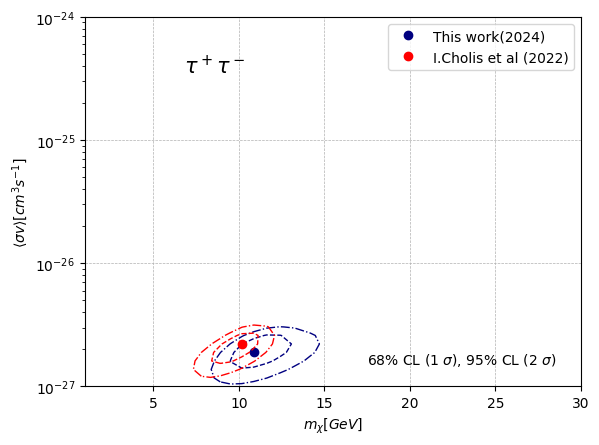

In [121]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/tau.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(1, 30)
plt.ylim(1e-27, 1e-24)
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

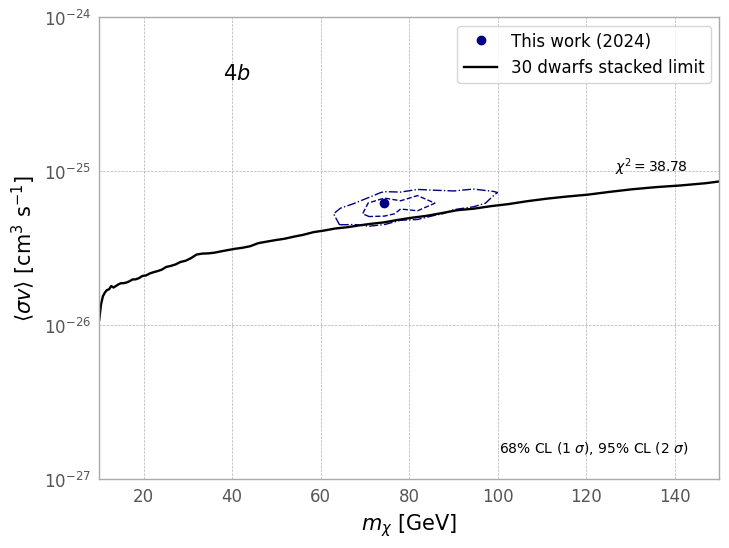

In [10]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

#plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

#plt.title("DM interpretation of GCE for model I", fontsize=13)



Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

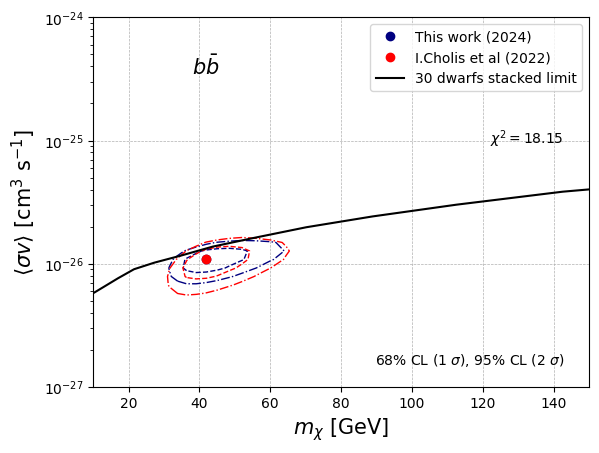

In [734]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

#plt.title("DM interpretation of GCE for model I", fontsize=13)



Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

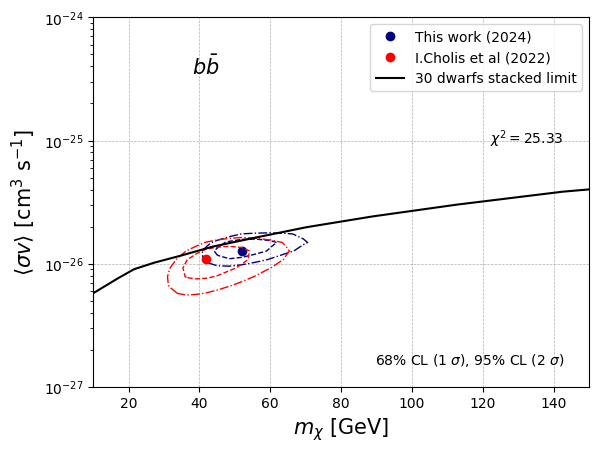

In [766]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

#plt.title("DM interpretation of GCE for model I", fontsize=13)



In [242]:
best_fit_dm, best_fit_sigmav

(42.597833401270954, 1.487352107293512e-26)

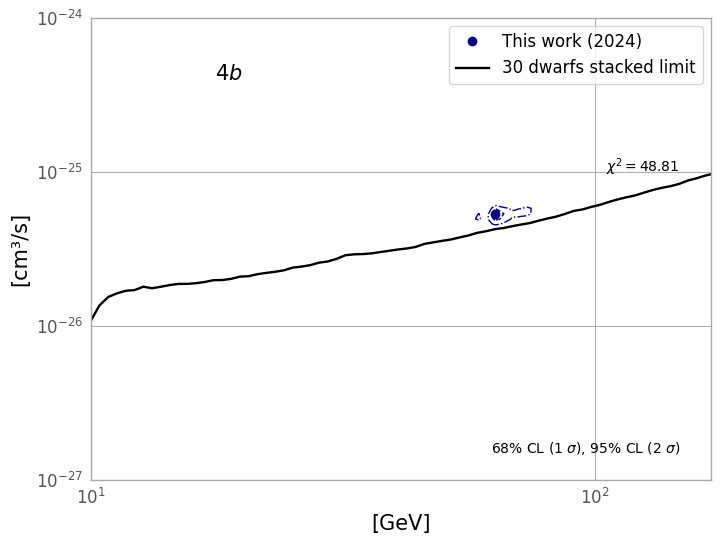

<Figure size 2000x2000 with 0 Axes>

In [626]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

#plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('log')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 170)
plt.ylim(1e-27, 1e-24)

#plt.xlim(30, 50)
#plt.ylim(1e-26, 5e-26)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
#plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

#plt.title("DM interpretation of GCE for model I", fontsize=13)



# import matplotlib.pyplot as plt
# import pandas as pd

# solid_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_solid_line.txt', delim_whitespace=True)
# solid_line_x = solid_line_data['x']
# solid_line_y = solid_line_data['y']*(10**-26)

# dashed_line_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_dashed_line.txt', delim_whitespace=True)
# dashed_line_x = dashed_line_data['x']
# dashed_line_y = dashed_line_data['y']*(10**-26)

# point_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2112fig18left_best_fit_point.txt', delim_whitespace=True)
# point_x = point_data['x']
# point_y = point_data['y']*(10**-26)

# rectangle_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references/2101fig10right_DMdensity.txt', delim_whitespace=True)
# rectangle_x = rectangle_data['x']
# rectangle_y = rectangle_data['y']

# point2_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs.txt', delim_whitespace=True)
# point2_x = point2_data['x']
# point2_y = point2_data['y']

# errorbar_data = pd.read_csv('/home/FermiLAT/Sanghwan/GCE_references//2101fig10right_IEMs_errorbar.txt', delim_whitespace=True)
# error_x = errorbar_data['x']
# error_y = errorbar_data['y']
# error_yerr = errorbar_data['yerr']

# plt.plot(solid_line_x, solid_line_y, linestyle='-', color='black')#, label='Solid Line')
# plt.plot(dashed_line_x, dashed_line_y, linestyle='--', color='black')#, label='Dashed Line')
# plt.scatter(point_x, point_y, color='black', zorder=5, marker='.', label='I. Cholis (2022)', s=100)
# plt.scatter(point2_x, point2_y, color='green', label='D. Mauro (2021)', zorder=5, marker='+', s=100)
#plt.fill(rectangle_x, rectangle_y, color='gray', alpha=0.1, label='Boundary Area')

plt.xlabel('[GeV]')
plt.ylabel('[cm³/s]')
#plt.title('Combined Graph in Log-Log Scale')
plt.legend()
#plt.grid(False, which="both", ls="--", lw=0.5)
plt.figure(figsize=(20, 20))
plt.show()

In [627]:
best_fit_dm

63.398376650646874

Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

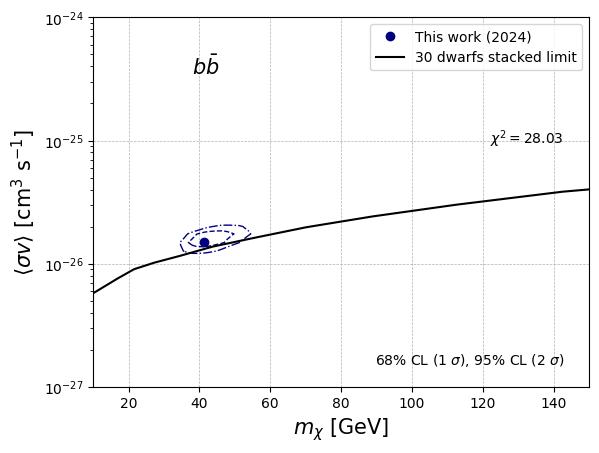

In [432]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

#plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

#plt.title("DM interpretation of GCE for model I", fontsize=13)



(0.31332890159702786, 374.9416797515359)

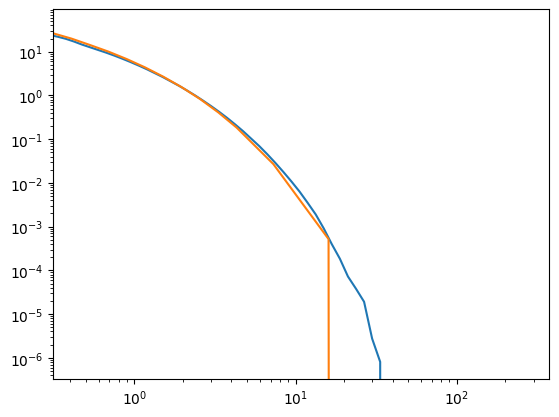

In [866]:
plt.loglog(Interpolator(30).interpolated_table()[0], Interpolator(30).interpolated_table()[1])
plt.loglog(emeans, exctractcirellitable(30, 13, 'gammas', 'Yes') )
plt.xlim(emeans[0], emeans[-1])

In [867]:
Interpolator(30).interpolated_table()[1]

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
      

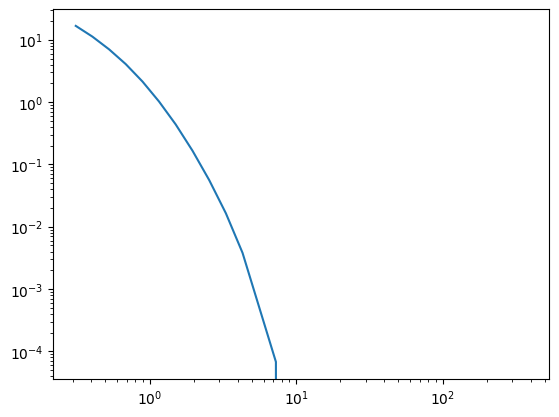

In [861]:
plt.loglog(emeans, exctractcirellitable(9, 13, 'gammas', 'Yes') )

In [ ]:
'/home/sanghwan/Madgraph_2/MG5_aMC_v2_9_18/bin/test_bb/Events/DM105.54GeV/DM105.54GeV_gamma.da

Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

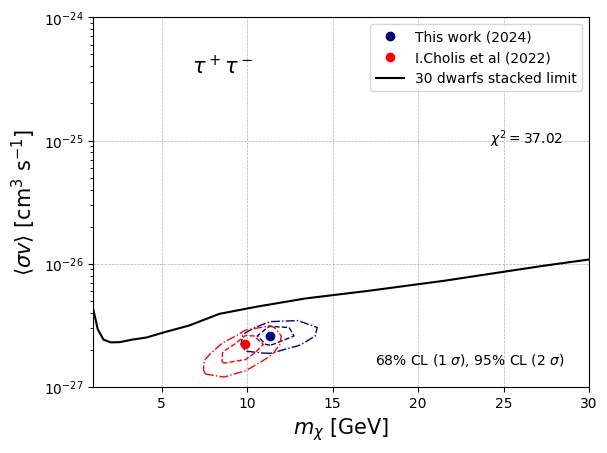

In [766]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/tau.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(1, 30)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$\tau^+ \tau^-$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

#plt.title("DM interpretation of GCE for model I", fontsize=13)



Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

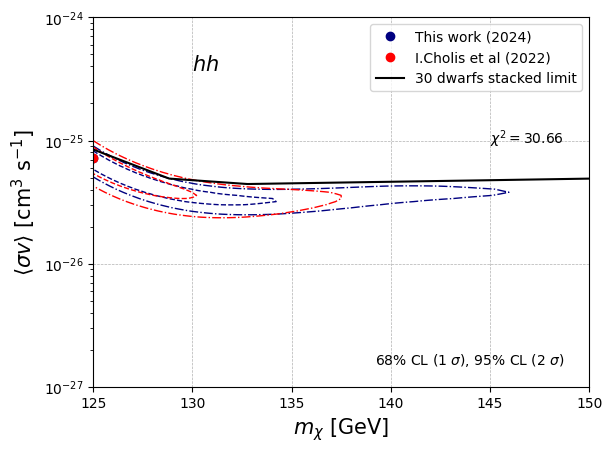

In [794]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/hh.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(125, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$hh$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]', fontsize=15)
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]', fontsize=15)

#plt.title("DM interpretation of GCE for model I", fontsize=13)



In [690]:
min_chi2, min_chi2_I

(32.7322781982104, 34.49793366907972)

Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

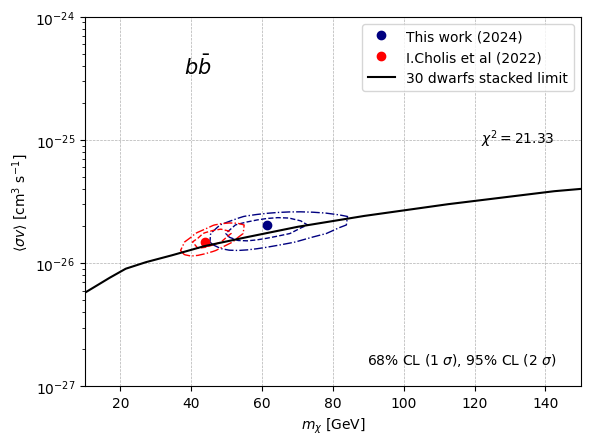

In [573]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]')
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]')


Text(0, 0.5, '$\\langle \\sigma v \\rangle$ [cm$^3$ s$^{-1}$]')

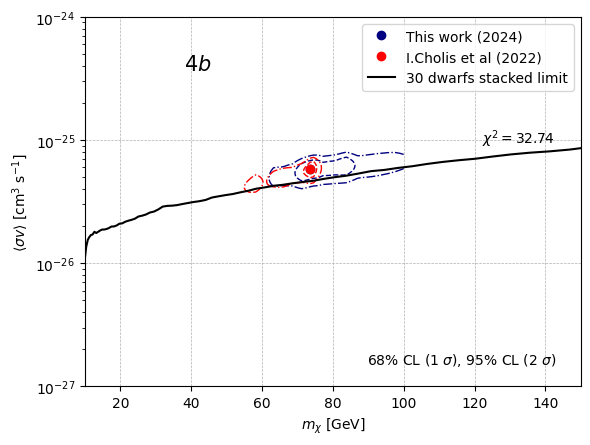

In [589]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$\chi^2 = {}$ '.format(np.round(min_chi2, 2)), fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'4$b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi$ [GeV]')
plt.ylabel(r'$\langle \sigma v \rangle$ [cm$^3$ s$^{-1}$]')


Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

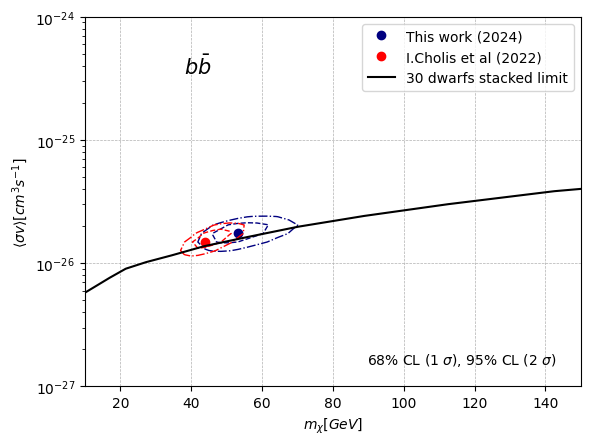

In [470]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [ ]:
min_chi2/15

2.3029279427689433

In [ ]:
min_chi2_I/12

4.363779463814119

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

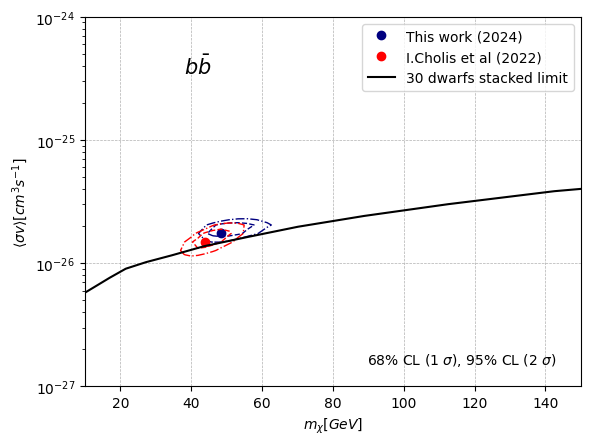

In [283]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [ ]:
model XLIX

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

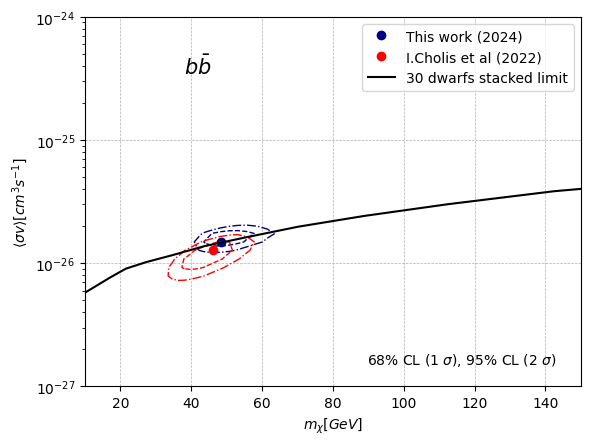

In [289]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [ ]:
model X

In [278]:
min_chi2/15

1.0152019403159247

In [143]:
best_fit_dm, best_fit_sigmav

(46.128300997787484, 1.7433288221999943e-26)

In [190]:
min_chi2

24.426863369429366

In [189]:
min_chi2_I/12

1.9611003582498512

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

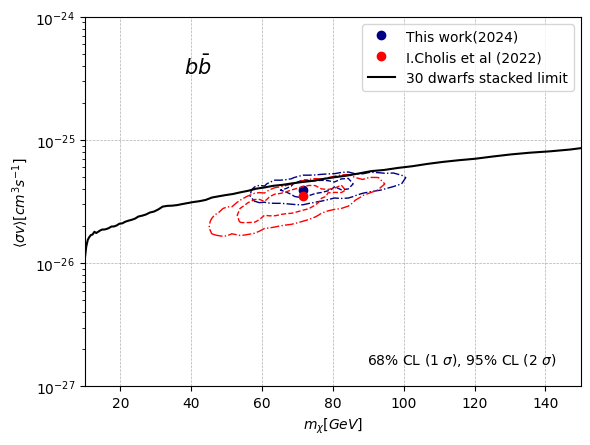

In [644]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$b\bar{b}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

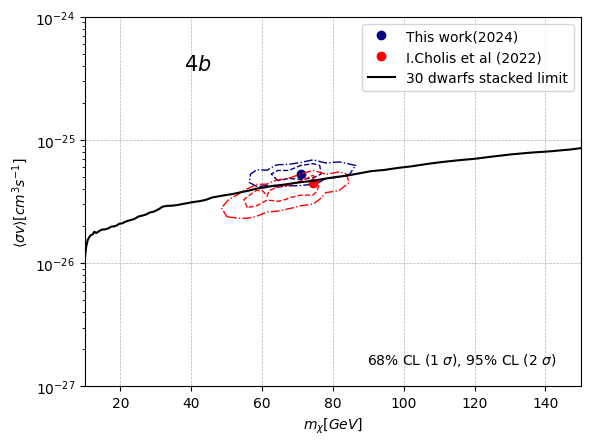

In [204]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 150)
plt.ylim(1e-27, 1e-24)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$4b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

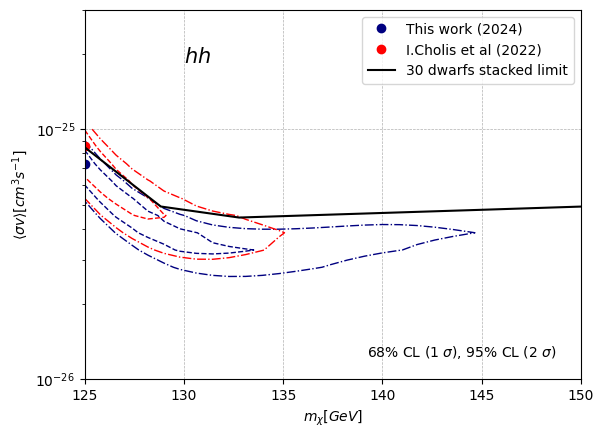

In [215]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/hh.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work (2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='dwarf galaxy upper limit(2023)', color='black')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(125, 150)
plt.ylim(1e-26, 3e-25)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.2, 0.90, r'$hh$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [205]:
min_chi2, min_chi2_I

(23.874933961499313, 23.32278428186855)

In [616]:
best_fit_dm, best_fit_sigmav

(124.99999999999994, 7.038135554931547e-26)

In [206]:
best_fit_dm_I

74.40024273975517

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

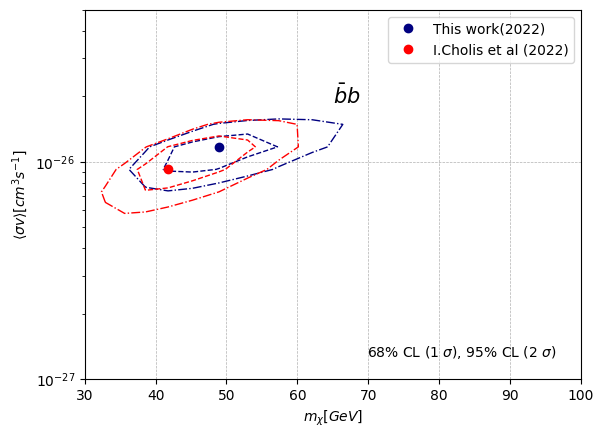

In [288]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2022)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(30, 100)
plt.ylim(1e-27, 5e-26)
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.5, 0.80, r'$\bar{b}$$b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [93]:
min_chi2/12, min_chi2_I/12

(1.4189904755066192, 1.7459960576135864)

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

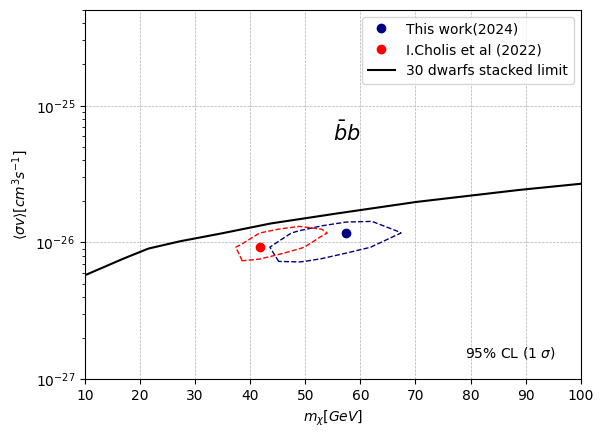

In [112]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 100)
plt.ylim(1e-27, 5e-25)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'95% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.5, 0.70, r'$\bar{b}$$b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [73]:
min_chi2/12, min_chi2_I/12

(1.4852426164539805, 1.7459960576135864)

Text(0.95, 0.6, '$h_2 h_2$ $m_{h2} = 75 GeV$')

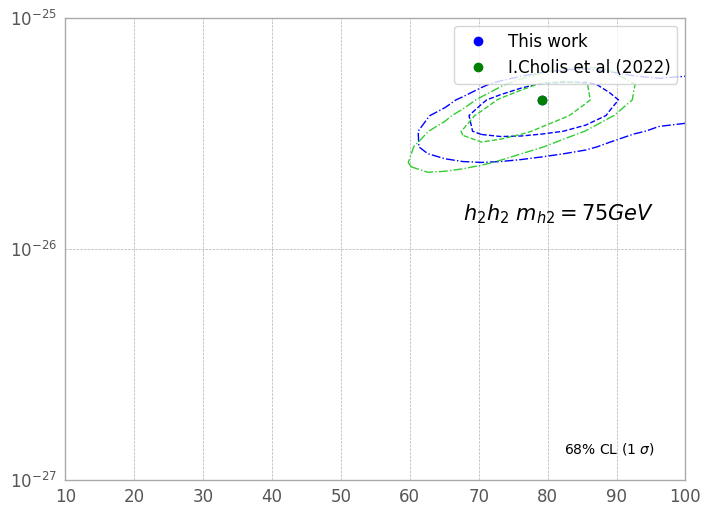

In [181]:
plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='blue', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label='This work', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='limegreen', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 100)
plt.ylim(1e-27, 1e-25)
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, r'68% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.60, r'$h_2 h_2$ $m_{h2} = 75 GeV$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)


Text(0.95, 0.6, '$h_2 h_2$, $m_{h2}$ =55 $GeV$')

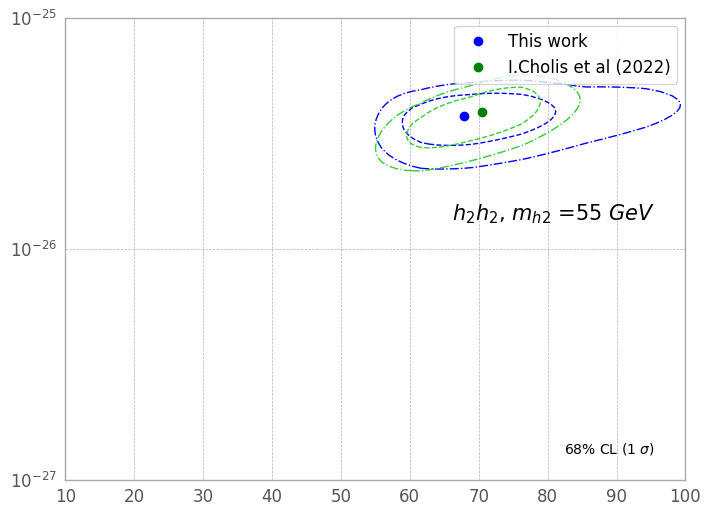

In [31]:
plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='blue', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label='This work', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='limegreen', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 100)
plt.ylim(1e-27, 1e-25)
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, r'68% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.60, r'$h_2 h_2$, $m_{h2}$ =55 $GeV$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)


Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

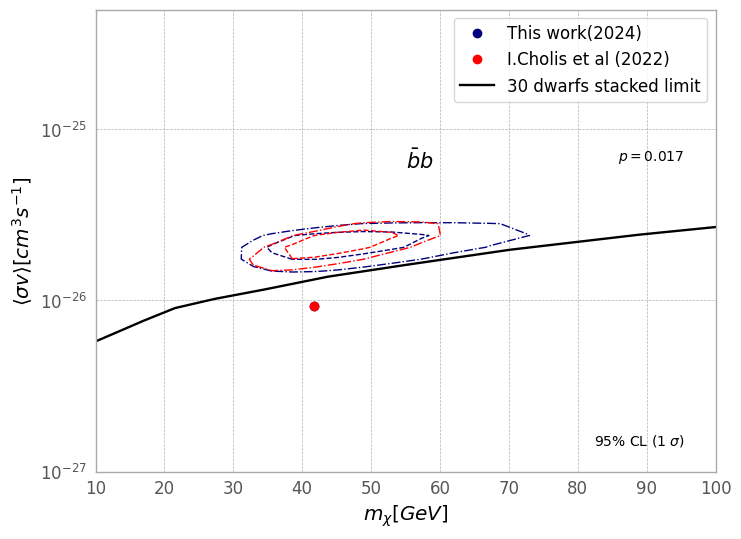

In [48]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 100)
plt.ylim(1e-27, 5e-25)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'95% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.5, 0.70, r'$\bar{b}$$b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

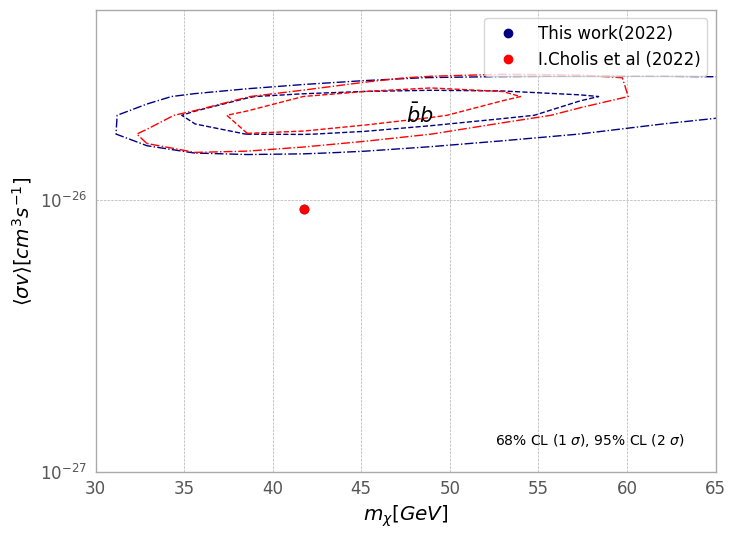

In [49]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2022)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(30, 65)
plt.ylim(1e-27, 5e-26)
#plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'68% CL (1 $\sigma$), 95% CL (2 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
#         verticalalignment='top', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.text(0.5, 0.80, r'$\bar{b}$$b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

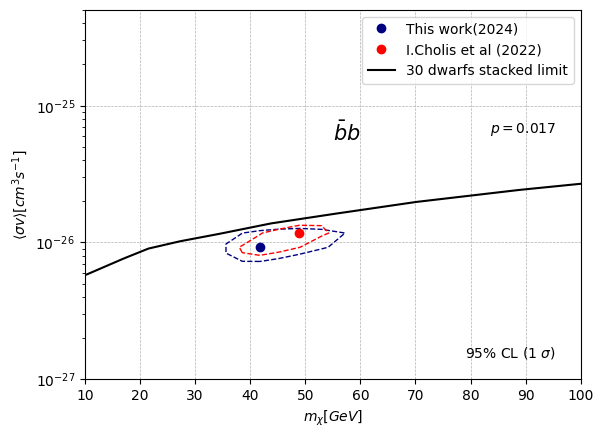

In [2030]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 100)
plt.ylim(1e-27, 5e-25)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'95% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$p=0.017$', fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.5, 0.70, r'$\bar{b}$$b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [2031]:
best_fit_sigmav, best_fit_sigmav_I

(9.236708571873847e-27, 1.1721022975334842e-26)

In [2032]:
min_chi2/12, min_chi

1.4801860510085423

In [805]:
best_fit_sigmav, best_fit_sigmav_I

(2.395026619987491e-26, 2.395026619987491e-26)

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

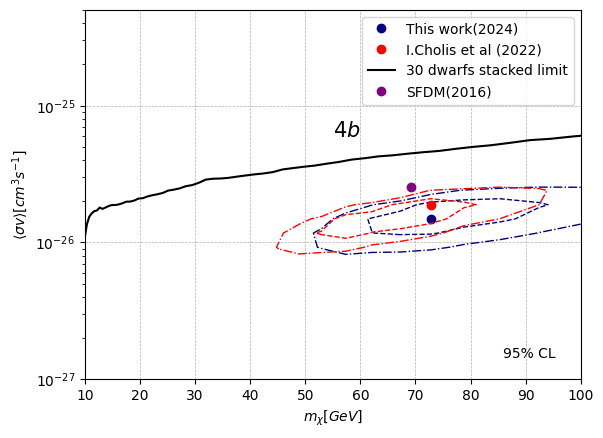

In [178]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/4b.txt')


plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o',color='navy', label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(10, 100)
plt.ylim(1e-27, 5e-25)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')

plt.plot(69.2, 2.54e-26, 'o', color='purple' , label='SFDM(2016)')


plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid

plt.text(0.95, 0.05, r'95% CL', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
#plt.text(0.95, 0.70, r'$p=0.01$', fontsize=10, color='black',verticalalignment='top', horizontalalignment='right',transform=plt.gca().transAxes)

plt.text(0.5, 0.70, r'$4b$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

#plt.text(0.5-0.3, 0.70, r'$J=2.54\bar{J}$', fontsize=15, color='black',
#         verticalalignment='top', horizontalalignment='left',
#         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [826]:
min_chi2_I/12

1.9592375936596913

In [173]:
best_fit_dm, best_fit_dm_I

(72.7895384398315, 72.7895384398315)

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

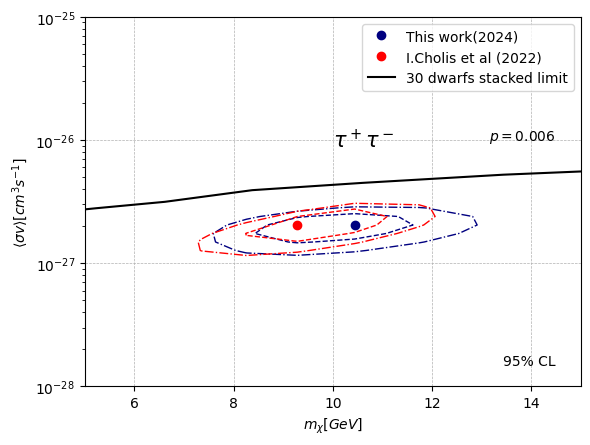

In [1012]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/tau.txt')

plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
#plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o', color='navy',label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
#plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(5, 15)
plt.ylim(1e-28, 1e-25)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, r'95% CL', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$p=0.006$', fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.5, 0.70, r'$\tau^+$$\tau^-$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [989]:
min_chi2/12

2.890645481750044

In [990]:
min_chi2_I/12

1.890761598708303

In [994]:
min_chi2/12

1.611139538185087

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

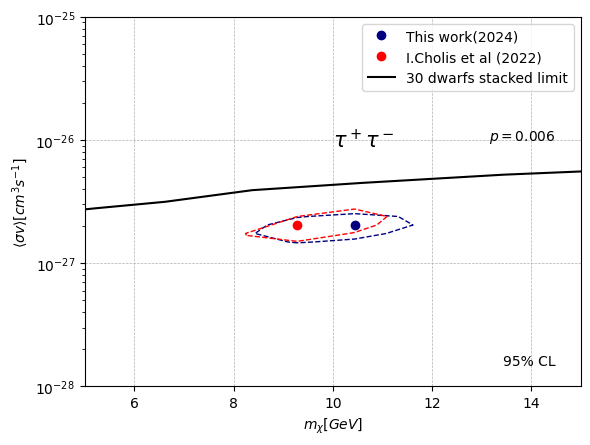

In [1011]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/tau.txt')

#plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold]), colors='navy', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'o', color='navy',label='This work(2024)', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

#plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I]), colors='red', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'ro', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(5, 15)
plt.ylim(1e-28, 1e-25)
plt.plot(ulm[0:, 0], ulm[0:, 1], label='30 dwarfs stacked limit', color='black')
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, r'95% CL', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.70, r'$p=0.006$', fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

plt.text(0.5, 0.70, r'$\tau^+$$\tau^-$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [1003]:
min_chi2/12

1.611139538185087

In [1005]:
best_fit_dm, best_fit_dm_I

(10.4400917075454, 9.284726129275331)

In [1008]:
cov=np.loadtxt('/home/sanghwan/C.Weniger/covariance.dat')

In [1010]:
np.sqrt(np.diag(cov))

array([5.47722568e-01, 6.32455537e-01, 3.72820044e-04, 2.81605097e-04,
       2.47608060e-07, 2.72895296e-07, 2.74737603e-07, 2.59715697e-07,
       2.51970290e-07, 2.53158909e-07, 2.72033506e-07, 2.34066646e-07,
       2.38360314e-07, 2.15372738e-07, 2.25068068e-07, 2.05760579e-07,
       1.83814246e-07, 1.63657568e-07, 1.40202738e-07, 1.53403265e-07,
       1.28265510e-07, 1.05915198e-07, 8.19694704e-08, 5.86296315e-08])

Text(0.95, 0.8, '$\\mu^+$$\\mu^{-}$')

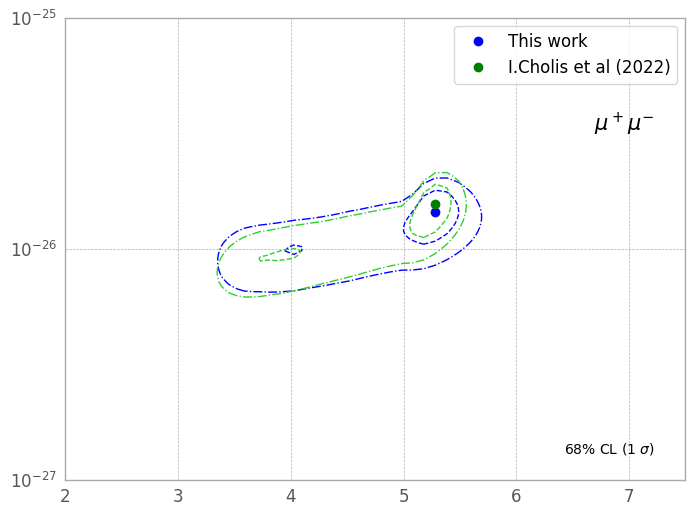

In [136]:
plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='blue', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label='This work', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='limegreen', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(2, 7.5)
plt.ylim(1e-27, 1e-25)
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, r'68% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.80, r'$\mu^+$$\mu^{-}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)


Text(0.95, 0.8, '$e^+$$e^{-}$')

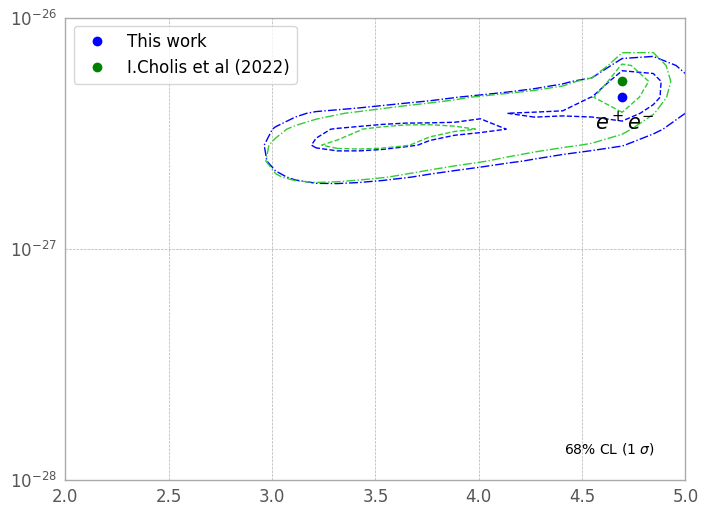

In [180]:
plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='blue', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label='This work', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='limegreen', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(2, 5)
plt.ylim(1e-28, 1e-26)
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, r'68% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.80, r'$e^+$$e^{-}$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)


Text(0.95, 0.8, '$hh$')

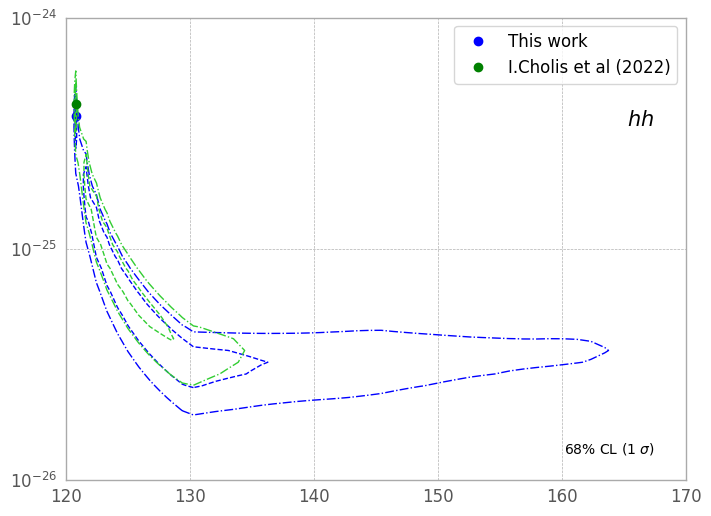

In [207]:
plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([one_sigma_threshold, two_sigma_threshold]), colors='blue', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label='This work', alpha=1)

#plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
#plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([one_sigma_threshold_I, two_sigma_threshold_I]), colors='limegreen', linestyles=['--', '-.'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)', alpha=1)


plt.yscale('log')
plt.xscale('linear')
#ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.plot(ulm[0:, 0], ulm[0:, 1])
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'ro', label='SFDM reference value')
plt.xlim(120, 170)
plt.ylim(1e-26, 1e-24)
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, r'68% CL (1 $\sigma$)', fontsize=10, color='black',
         verticalalignment='bottom', horizontalalignment='right',
         transform=plt.gca().transAxes)
plt.text(0.95, 0.80, r'$hh$', fontsize=15, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)


In [208]:
best_fit_dm, best_fit_sigmav

(120.82751500082526, 3.7693909753883634e-25)

In [209]:
best_fit_dm_I, best_fit_sigmav_I

(120.82751500082526, 4.237587160604055e-25)

In [93]:
best_fit_dm, best_fit_sigmav

(45.33893187678606, 1.0597662486760708e-26)

In [94]:
best_fit_dm_I, best_fit_sigmav_I

(45.33893187678606, 1.0597662486760708e-26)

In [73]:
min_chi2_I/12

1.8617525834790165

In [33]:
best_fit_dm, best_fit_sigmav

(10.628551770039401, 2.2695105366946686e-27)

In [34]:
best_fit_dm_w, best_fit_sigmav_w

(9.47113845233269, 3.625117049988528e-27)

In [17]:
best_fit_dm_I, best_fit_sigmav_I

(9.654893846056297, 2.1544346900318777e-27)

Text(0, 0.5, '$\\langle \\sigma v \\rangle [cm^3 s^{-1}] $')

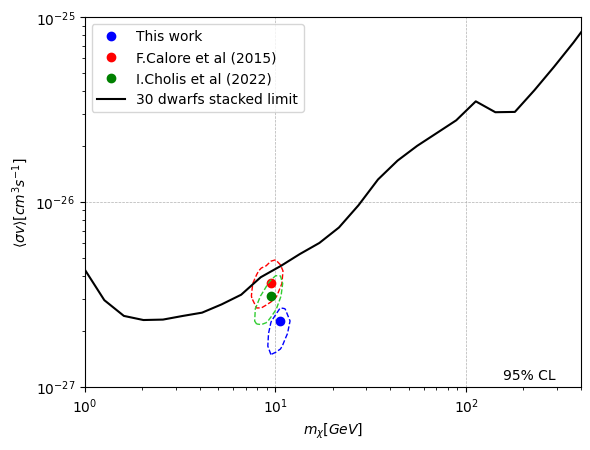

In [36]:
#plt.pcolormesh(mass_vec, sigmav_vec, chi_square_vec(DM_mass, Sigmav), vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
#plt.pcolormesh(mass_vec, sigmav_vec, chi_square_results, vmax=min_chi2+100, vmin=min_chi2,cmap='inferno', alpha=0.5)
#plt.colorbar()
plt.contour(mass_vec, sigmav_vec, chi_square_results, levels=np.array([two_sigma_threshold]), colors='blue', linestyles=['--'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm, best_fit_sigmav, 'bo', label='This work')

plt.contour(mass_vec, sigmav_vec, chi_square_w_results, levels=np.array([two_sigma_threshold_w]), colors='red', linestyles=['--'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_w, best_fit_sigmav_w, 'ro', label='F.Calore et al (2015)')

plt.contour(mass_vec, sigmav_vec, chi_square_I_results, levels=np.array([two_sigma_threshold_I]), colors='limegreen', linestyles=['--'], linewidths=3*[1],alpha=1)
plt.plot(best_fit_dm_I, best_fit_sigmav_I, 'go', label='I.Cholis et al (2022)')


plt.yscale('log')
plt.xscale('log')


ulm=np.loadtxt(f'/home/FermiLAT/Sanghwan/dwarf_galaxy/tau.txt')
plt.plot(ulm[0:, 0], ulm[0:, 1], color='black', linestyle='-', label='30 dwarfs stacked limit')
#plt.plot(9.96, 0.336*1e-26, 'bo', label='Paper reference value')
#plt.plot(40, 1.4e-26, 'bo', label='Paper reference value')
#plt.plot(38.2, 1.25*1e-26, 'bo', label='Paper reference value')
#plt.plot(49, 1.7e-26, 'bo', label='Paper reference value')
#plt.plot(69.2, 2.26*2.2e-26, 'co', label='SFDM reference value')



plt.xlim(1, 400)
plt.ylim(1e-27, 1e-25)
plt.legend()
plt.grid(True, which='major', linestyle='--', linewidth=0.5)  # Add this line to enable grid


plt.text(0.95, 0.05, '95% CL', fontsize=10, color='black',
         verticalalignment='top', horizontalalignment='right',
         transform=plt.gca().transAxes)

#plt.text(0.95, 0.05, r'$m_{h2}$ = 35 $GeV$', fontsize=15, color='black',
#         verticalalignment='bottom', horizontalalignment='right',
#         transform=plt.gca().transAxes)

plt.xlabel(r'$m_\chi [GeV]$')
plt.ylabel(r'$\langle \sigma v \rangle [cm^3 s^{-1}] $')


In [32]:
min_chi2_I

54.48418168025135

(1e-27, 1e-24)

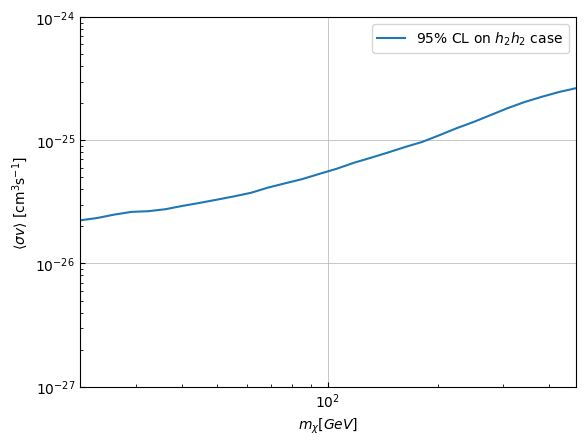

In [125]:
plt.style.use('default')
plt.tick_params(axis='y', which='both', direction='in', left=True)
plt.tick_params(axis='x', which='both', direction='in', bottom=True)
plt.minorticks_on()
plt.grid(True, which='Major', linestyle='-', linewidth=0.5)

#plt.ylabel(f'$\langle$ $\sigma$ v $\rangle$]')
plt.ylabel(r'$\langle \sigma v \rangle \ [\mathrm{cm}^3 \mathrm{s}^{-1}]$')
plt.xlabel(r'$m_{\chi}[GeV]$')

ulm=np.loadtxt('../dwarf_galaxy/SFDM_h2h2_15GeV.txt')
plt.loglog(ulm[0:, 0], ulm[0:, 1], label=r'95% CL on $h_2 h_2$ case')
plt.legend()
plt.xlim(ulm[0,0], ulm[-1, 0])
plt.ylim(1e-27, 1e-24)

In [93]:
best_fit_dm, best_fit_sigmav

(19.30978769211259, 5.994842503189421e-27)

In [94]:
best_fit_dm_w, best_fit_sigmav_w

(8.85849613163886, 2.1544346900318777e-27)

In [450]:
min_chi2/22

0.790102793798588

In [255]:
ulm[0:, 0]

array([1.00000000e+00, 1.26638017e+00, 1.60371874e+00, 2.03091762e+00,
       2.57191381e+00, 3.25702066e+00, 4.12462638e+00, 5.22334507e+00,
       6.61474064e+00, 8.37677640e+00, 1.06081836e+01, 1.34339933e+01,
       1.70125428e+01, 2.15443469e+01, 2.72833338e+01, 3.45510729e+01,
       4.37547938e+01, 5.54102033e+01, 7.01703829e+01, 8.88623816e+01,
       1.12533558e+02, 1.42510267e+02, 1.80472177e+02, 2.28546386e+02,
       2.89426612e+02, 3.66524124e+02, 4.64158883e+02, 5.87801607e+02,
       7.44380301e+02, 9.42668455e+02, 1.19377664e+03, 1.51177507e+03,
       1.91448198e+03, 2.42446202e+03, 3.07029063e+03, 3.88815518e+03,
       4.92388263e+03, 6.23550734e+03, 7.89652287e+03, 1.00000000e+04])

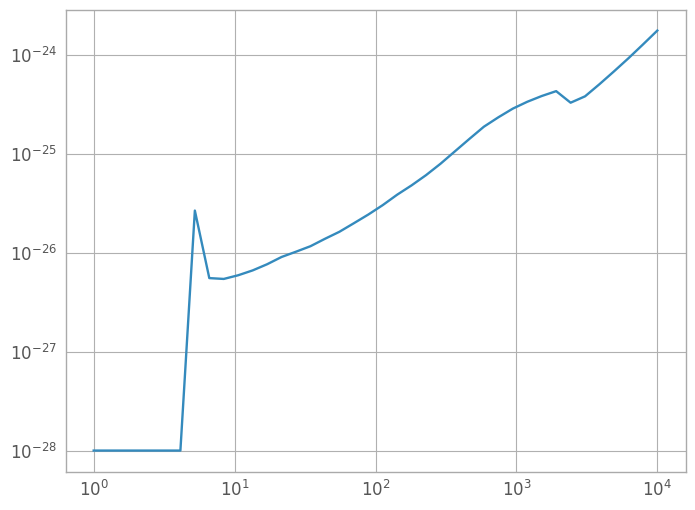

In [257]:
ulm=np.loadtxt('/home/FermiLAT/Sanghwan/dwarf_galaxy/bb_upper_limit.txt')
#plt.xlim(7, 1e+4)
plt.loglog()
plt.plot(ulm[0:, 0], ulm[0:, 1])


In [112]:
min_chi2/22

1.5744554256276693

In [191]:
best_fit_dm, best_fit_sigmav

(62.14465011907717, 1.6681005372000557e-26)

In [135]:
best_fit_dm_w, best_fit_sigmav_w

(8.85849613163886, 2.1544346900318777e-27)

In [259]:
a=fits.open('/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/ics_modelF.fits')[0].data

In [270]:
E_bounds

FITS_rec([( 1,   300000.  , 3.5000000e+05),
          ( 2,   350000.  , 4.0000000e+05),
          ( 3,   400000.  , 4.5000000e+05),
          ( 4,   450000.  , 5.0000000e+05),
          ( 5,   500000.  , 5.5745119e+05),
          ( 6,   557451.2 , 6.2499312e+05),
          ( 7,   624993.1 , 7.0508119e+05),
          ( 8,   705081.2 , 8.0095475e+05),
          ( 9,   800954.75, 9.1695450e+05),
          (10,   916954.5 , 1.0589995e+06),
          (11,  1058999.5 , 1.2353219e+06),
          (12,  1235321.9 , 1.4576299e+06),
          (13,  1457629.9 , 1.7430094e+06),
          (14,  1743009.4 , 2.1171480e+06),
          (15,  2117148.  , 2.6200380e+06),
          (16,  2620038.  , 3.3165858e+06),
          (17,  3316585.8 , 4.3175725e+06),
          (18,  4317572.5 , 5.8242265e+06),
          (19,  5824226.5 , 8.2321720e+06),
          (20,  8232172.  , 1.2404649e+07),
          (21, 12404649.  , 2.0517116e+07),
          (22, 20517116.  , 3.9361808e+07),
          (23, 39361808.  , 9.93

In [9]:
fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits')[1].data

FITS_rec([(3.00000000e+02,), (3.50000000e+02,), (4.00000000e+02,),
          (4.50000000e+02,), (5.00000000e+02,), (5.57451187e+02,),
          (6.24993125e+02,), (7.05081188e+02,), (8.00954750e+02,),
          (9.16954500e+02,), (1.05899950e+03,), (1.23532188e+03,),
          (1.45762988e+03,), (1.74300938e+03,), (2.11714800e+03,),
          (2.62003800e+03,), (3.31658575e+03,), (4.31757250e+03,),
          (5.82422650e+03,), (8.23217200e+03,), (1.24046490e+04,),
          (2.05171160e+04,), (3.93618080e+04,), (9.93371840e+04,),
          (5.00000000e+05,)], dtype=(numpy.record, [('Energy', '>f8')]))

In [22]:
fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits')[1].data

FITS_rec([(3.00000000e+02,), (3.50000000e+02,), (4.00000000e+02,),
          (4.50000000e+02,), (5.00000000e+02,), (5.57451187e+02,),
          (6.24993125e+02,), (7.05081188e+02,), (8.00954750e+02,),
          (9.16954500e+02,), (1.05899950e+03,), (1.23532188e+03,),
          (1.45762988e+03,), (1.74300938e+03,), (2.11714800e+03,),
          (2.62003800e+03,), (3.31658575e+03,), (4.31757250e+03,),
          (5.82422650e+03,), (8.23217200e+03,), (1.24046490e+04,),
          (2.05171160e+04,), (3.93618080e+04,), (9.93371840e+04,),
          (5.00000000e+05,)], dtype=(numpy.record, [('Energy', '>f8')]))

In [433]:
# Revision :: Jul 4, 2024

#In case of Logarithmic scale, central points should be considered logarithmically

model='F'
E_bounds=fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ccube_masked.fits')[1].data
E=np.zeros(len(E_bounds))
for i in range(0, 4, 1):
    E[i] = 1e-3*(E_bounds[i][2] + E_bounds[i][1])/2
for i in range(4, len(E_bounds), 1):
    E[i] = np.sqrt(E_bounds[i][2]*E_bounds[i][1]*1e-6)
    
delta_E=np.zeros(len(E_bounds))
for i in range(0, len(E_bounds), 1):
    delta_E[i] = (E_bounds[i][2] - E_bounds[i][1])*1e-3
    

exp_cube=fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits')[0].data
for i in range(0, 4, 1):
    exp_cube[i] = ( fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits')[0].data[i] + fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits')[0].data[i+1] )/2
for i in range(4, len(exp_cube)-1, 1):
    exp_cube[i] = np.sqrt(fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits')[0].data[i]*fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits')[0].data[i+1])

file_name='/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/psc.fits'
psc=np.zeros(len(fits.open(file_name)[0].data))
for i in range(0, len(fits.open(file_name)[0].data), 1):
    a=exp_cube[i]
    psc[i] = np.sum(fits.open(file_name)[0].data[i]/a)

file_name=f'/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/pion_model{model}.fits'
pion=np.zeros(len(fits.open(file_name)[0].data))
for i in range(0, len(fits.open(file_name)[0].data), 1):
    a=exp_cube[i]
    pion[i] = np.sum(fits.open(file_name)[0].data[i]/a)

file_name=f'/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/bremss_model{model}.fits'
bremss=np.zeros(len(fits.open(file_name)[0].data))
for i in range(0, len(fits.open(file_name)[0].data), 1):
    a=exp_cube[i]
    bremss[i] = np.sum(fits.open(file_name)[0].data[i]/a)
    
file_name=f'/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/ics_model{model}.fits'
ics=np.zeros(len(fits.open(file_name)[0].data))
for i in range(0, len(fits.open(file_name)[0].data), 1):
    a=exp_cube[i]
    ics[i] = np.sum(fits.open(file_name)[0].data[i]/a)
    
file_name='/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/GCE.fits'
GCE=np.zeros(len(fits.open(file_name)[0].data))
for i in range(0, len(fits.open(file_name)[0].data), 1):
    a=exp_cube[i]
    GCE[i] = np.sum(fits.open(file_name)[0].data[i]/a)
    
file_name='/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/fermi_bubble.fits'
bubble=np.zeros(len(fits.open(file_name)[0].data))
for i in range(0, len(fits.open(file_name)[0].data), 1):
    a=exp_cube[i]
    bubble[i] = np.sum(fits.open(file_name)[0].data[i]/a)
    
file_name='/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/isotropic.fits'
isotropic=np.zeros(len(fits.open(file_name)[0].data))
for i in range(0, len(fits.open(file_name)[0].data), 1):
    a=exp_cube[i]
    isotropic[i] = np.sum(fits.open(file_name)[0].data[i]/a)
    
counts_per_exp=np.zeros(len(E))
i=0
for i in range(0, len(E), 1):
    a=exp_cube[i]
    counts_per_exp[i]=np.sum( ( (fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ccube_masked.fits')[0].data[i]) /a))

counts_per_exp_err=np.zeros(len(E))
i=0
for i in range(0, len(E), 1):
    a=exp_cube[i]
    counts_per_exp_err[i]=np.sqrt( np.sum( ( np.sqrt(fits.open('/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ccube_masked.fits')[0].data[i]) /a)**2) )
    
sr=0.214411*2
    

In [434]:
counts_per_exp_err

array([3.87677169e-09, 3.24696991e-09, 2.77764086e-09, 2.42440943e-09,
       2.28242745e-09, 2.15844184e-09, 2.03131642e-09, 1.91698469e-09,
       1.79789516e-09, 1.65527154e-09, 1.52872657e-09, 1.39824740e-09,
       1.27241646e-09, 1.15306728e-09, 1.05006564e-09, 9.41745545e-10,
       8.41830360e-10, 7.31173041e-10, 6.12011680e-10, 4.98324491e-10,
       3.91072286e-10, 2.89275910e-10, 1.93720071e-10, 1.14405533e-10])

In [432]:
counts_per_exp_err

array([2.31076579e-08, 1.77529826e-08, 1.40970213e-08, 1.15369350e-08,
       1.08812671e-08, 1.04194768e-08, 9.92596491e-09, 9.48079138e-09,
       9.04289205e-09, 8.53067083e-09, 8.18861056e-09, 7.64602963e-09,
       7.26828290e-09, 6.57598135e-09, 6.25352224e-09, 5.54424049e-09,
       4.81639613e-09, 4.04149497e-09, 2.98267999e-09, 1.80172312e-09,
       8.94658483e-10, 4.10925556e-10, 2.32358437e-10, 1.22104783e-10])

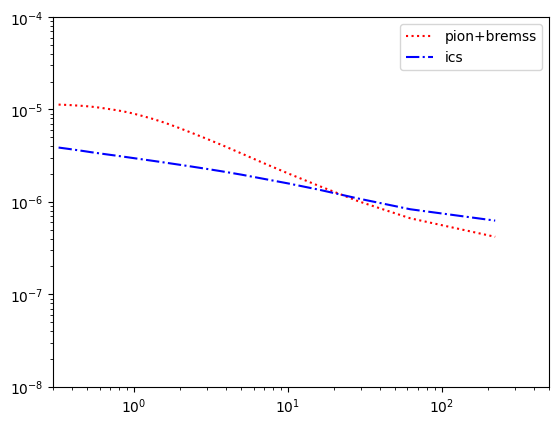

In [49]:
plt.style.use('default')

plt.ylim(1e-8, 1e-4)
plt.xlim(0.3, 500)

plt.loglog()
plt.plot(E*1e-3, (pion+bremss)*(E**2)/(1000*delta_E*sr), linestyle='dotted', label='pion+bremss', color='red')
plt.plot(E*1e-3, (ics)*(E**2)/(1000*delta_E*sr), linestyle='dashdot', label='ics', color='blue')
plt.legend()

In [290]:
%%bash
gtmodel outtype=ccube
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model/ics_modelF.xml
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/ics_modelF_new.fits
    P8R3_ULTRACLEANVETO_V3
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits

Source maps (or counts map) file[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_a_masked.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model/ics_modelF.xmlbremss_modelF.xml]  
Output file[/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/bremss_modelF_new.fits]     /home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/ics_modelF_new.fits
Response functions[P8R3_ULTRACLEANVETO_V3]     P8R3_ULTRACLEANVETO_V3
Exposure cube[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits
Binned exposure map[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits


In [291]:
%%bash
gtmodel outtype=ccube
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model/pion_modelF.xml
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/pion_modelF_new.fits
    P8R3_ULTRACLEANVETO_V3
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits

Source maps (or counts map) file[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits
Source model file[/home/FermiLAT/Sanghwan/GC_14yr/data/Model/ics_modelF.xml]     /home/FermiLAT/Sanghwan/GC_14yr/data/Model/pion_modelF.xml
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/pion_modelF_new.fitsew.fits]  
Response functions[P8R3_ULTRACLEANVETO_V3]     P8R3_ULTRACLEANVETO_V3
Exposure cube[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits
Binned exposure map[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits


In [292]:
%%bash
gtmodel outtype=ccube
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model/bremss_modelF.xml
    /home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/bremss_modelF_new.fits
    P8R3_ULTRACLEANVETO_V3
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits
    /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits

Source maps (or counts map) file[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_srcmap_model_f_masked.fits
Source model file[/home/FermiLAT/Sanghwan/GC_14yr/data/Model/pion_modelF.xml]     /home/FermiLAT/Sanghwan/GC_14yr/data/Model/bremss_modelF.xml
Output file[/home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/pion_modelF_new.fits]     /home/FermiLAT/Sanghwan/GC_14yr/data/Model_Map/bremss_modelF_new.fits
Response functions[P8R3_ULTRACLEANVETO_V3]     P8R3_ULTRACLEANVETO_V3
Exposure cube[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_ltcube.fits
Binned exposure map[/home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits]     /home/FermiLAT/Sanghwan/GC_14yr/GC_14yr_expcube.fits
